[13.469376698682192, 15.060529358906333, 16.104305732080395, 17.579639844161274, 18.79227869832696, 19.064447664498385, 20.093361004441853, 20.168730595370818, 20.914282824821456, 21.03587390010528, 21.876128897666742, 22.28907900019441, 22.902130550449595, 22.97407854872514, 23.688575694150032, 23.761709964419538, 24.607481547952904, 24.622190489866192, 24.827190306892348, 25.111659811551895, 25.308061572081943, 26.32098846888393, 26.479187663472974, 26.566274513587395, 26.587799111624307, 26.783425406771954, 27.21722140455118, 27.461792344821017, 27.512364764854535, 28.440311907587247, 28.93758497738992, 29.3267020723245, 30.300478919936747, 30.46663963486029, 31.85806310413148, 32.318160010034426, 32.73755318857495, 33.380141742640205, 34.129923774230825, 34.783428743090376, 35.2784266980169, 35.7117647948753, 36.172571603904586, 36.188184567189666, 36.45898362832524, 38.63909196227929, 39.15046219866844, 44.0997409349396, 47.83345236406072]


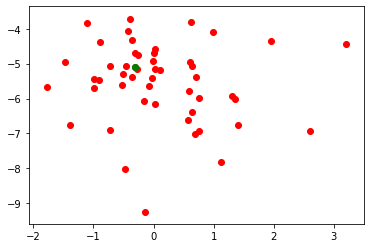

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
import random
import math
import matplotlib.pyplot as plt
from no_cluster import get_cluster
import copy

In [2]:
#random.seed(15)
P=2 #signal power threshold
#stream = BitStream()
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 60000
        self.clients = 50
        self.rounds = 200
        self.epochs = 2
        self.local_batches = 64
        self.lr = 0.001
        self.C = 0.9 #fraction of clients used in the round
        self.drop_rate = 0.1 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'iid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.csi_low=0
        self.csi_high=1
 
args = Arguments()

In [4]:
#checking if gpu is available
use_cuda = False
#print(use_cuda)
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
clients = []

#generating virtual clients
for i in range(int(args.clients)):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
    
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

In [5]:
for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average

#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=False, download=True, transform=transform)
# global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)
trainloader = torch.utils.data.DataLoader(global_train, batch_size=4,
                                          shuffle=True, num_workers=2)

In [6]:
# def imshow(img):
#     img = img / 2 + 0.5     # unnormalize
#     npimg = img.numpy()
#     plt.imshow(np.transpose(npimg, (1, 2, 0)))


# # get some random training images
# dataiter = iter(trainloader)
# images, labels = dataiter.next()

# # show images
# imshow(images[0])
# print(np.shape(images[0]))

In [7]:
# class Net(nn.Module):
#     def __init__(self):
#         super(Net, self).__init__()
#         #self.quant = torch.quantization.QuantStub()
#         self.conv1 = nn.Conv2d(1, 5, 5, 1)
#         self.conv2 = nn.Conv2d(5, 10, 5, 1)
#         self.fc1 = nn.Linear(4*4*10, 10) #..,50
#         self.fc2 = nn.Linear(10, 10) #50,5  50 non iid 5 iid

#     def forward(self, x):
#         #x=self.quant(x)
#         x = F.relu(self.conv1(x))
#         x = F.max_pool2d(x, 2, 2)
#         x = F.relu(self.conv2(x))
#         x = F.max_pool2d(x, 2, 2)
#         x = x.view(-1, 4*4*10
#                    )
#         x = F.relu(self.fc1(x))
#         x = self.fc2(x)
#         return F.log_softmax(x, dim=1)
    
    
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)#50

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return F.log_softmax(x)
        

In [8]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data,target=data,target
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                client['optim'].step()
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get() 
    #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [9]:
def test(args, model, device, test_loader, name):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return(100. * correct / len(test_loader.dataset))


In [10]:
torch.manual_seed(args.torch_seed)
#global_model = Net() #redundant code as we don't use it for training: assigns a CNN to the global model

for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)
    

accuracy=[]
rc=1

[14.0451028156088, 14.7325677939596, 15.210927201616279, 16.61133825842895, 16.673578640237295, 17.04968172980935, 17.40065557253575, 18.049650368948967, 18.17035793859231, 18.187820388691026, 18.237505777687126, 18.595302734638665, 18.799405815022368, 18.866727777656166, 19.00770332812949, 19.038283273448883, 19.130844735393737, 19.30637432921484, 19.748614351489568, 19.786175810637378, 19.812066026300165, 20.497019615829455, 20.604825091330564, 20.79815877075119, 20.820926259668504, 20.933480720216465, 21.048123653483067, 21.393107502467828, 21.42063444395058, 21.625630319019518, 21.737332690213044, 21.78268566303, 22.03866830312691, 22.246439416067116, 22.29389805022866, 22.34519866659622, 23.28835558265223, 23.770865183314537, 24.207935324971842, 24.25775676421371, 24.801958784231292, 25.059805168886367, 25.512304642160014, 26.54723877364681, 26.672390079513594, 26.787282783223443, 28.7606983056936, 29.116805673253474, 30.804988300092678]


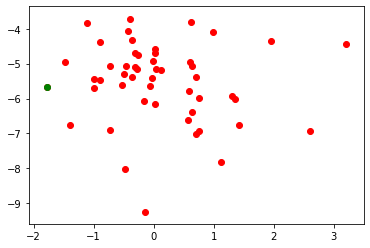

Power Allocated= 3.444359760328449
CSI= 0.848285247004372
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.558986818377708
CSI= 0.48444409127917143
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.542480


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.313932

Power Allocated= 1.6118177817480746
CSI= 0.33207248455433414
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.588934
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.245725

Power Allocated= 3.30088007272391
CSI= 0.7562417734526591
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294969
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.277053

Power Allocated= 3.6101819594429525
CSI= 0.9871409616102431
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.356231
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.332990

Power Allocated= 0
CSI= 0.06928871643929058
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.48234448088368875
CSI= 0.2414954931542077
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.305635

Power Allocated= 3.4576319761338317
CSI= 0.8579445225366756
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.414349
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.350279

Power Allocated= 3.6029754995756087
CSI= 0.9801682488342881
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308814
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.302683

Power Allocated= 1.0920700580976344
CSI= 0.2831947867676111
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294115
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.310671

Power Allocated= 1.9132938468089704
CSI= 0.36901531062927506
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.333747
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.306586

Power Allocated= 3.546109761577423
CSI= 0.9284199842628722
SNR= 18.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.2965, Accuracy: 1549/10000 (15%)

Power in training Round= 97.99687848163472



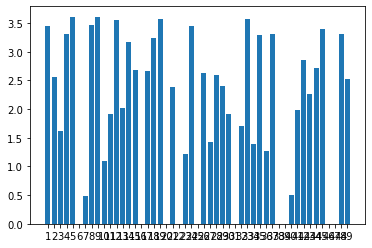

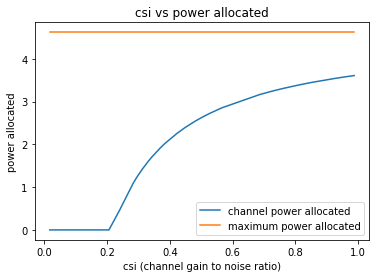

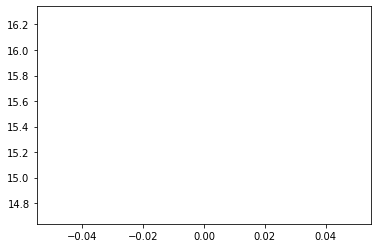

1
Power Allocated= 1.2435796670570598
CSI= 0.32213937449986607
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304050


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.290451

Power Allocated= 2.4223596200843307
CSI= 0.5193546692216451
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302911
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.283562

Power Allocated= 1.4907366750472493
CSI= 0.3500065471635315
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4030070195990283
CSI= 0.5141866494339343
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.327229
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.269075

Power Allocated= 2.0819692585471032
CSI= 0.44133415115278396
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287021
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.272562

Power Allocated= 1.4385765827254642
CSI= 0.3437312607755042
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.288067

Power Allocated= 3.014890848614022
CSI= 0.7502239953106601
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.291040
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.299726

Power Allocated= 2.717128831515887
CSI= 0.6132346127788898
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.295718
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.283542

Power Allocated= 0
CSI= 0.1287276598516094
SNR= 19.038283273448883
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2672683362788897
CSI= 0.9254479914400581
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.298264
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.265127

Power Allocated= 2.6294024712241746
CSI= 0.5819286879234231
SNR= 19.30637432921484
Client: client18
Model client18 Train Epoch: 1 [0/1216 (

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.2935, Accuracy: 1266/10000 (13%)

Power in training Round= 98.00366662468879



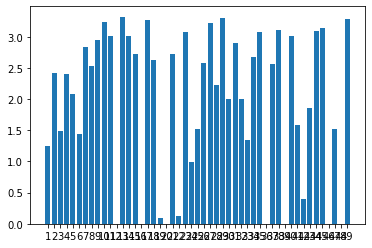

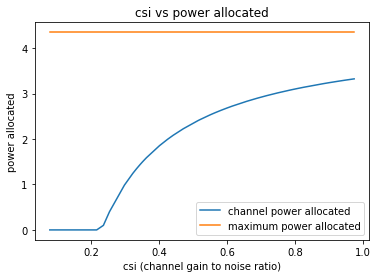

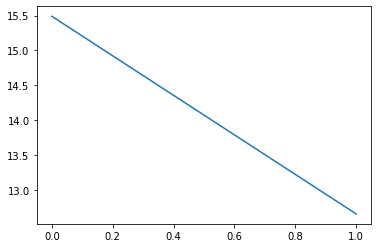

2
Power Allocated= 3.5549179499651284
CSI= 0.6452748265566053
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.929217170422432
CSI= 0.8507538970765356
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.279937


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.294136

Power Allocated= 4.007375473529636
CSI= 0.9113529254718142
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277888
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.292172

Power Allocated= 0
CSI= 0.124599465418885
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11236759511658923
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04806070778460403
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2637557879106343
CSI= 0.2603563616754935
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300401


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.280758

Power Allocated= 0.5839855177462727
CSI= 0.22120665218801872
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287471
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.295367

Power Allocated= 2.869318394919861
CSI= 0.4473618736993402
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.303479
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.256690

Power Allocated= 0
CSI= 0.04885940372506625
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11204293583250546
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5323444348904958
CSI= 0.6360106189086783
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297590
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.293166

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.2954, Accuracy: 1135/10000 (11%)

Power in training Round= 98.00265540276551



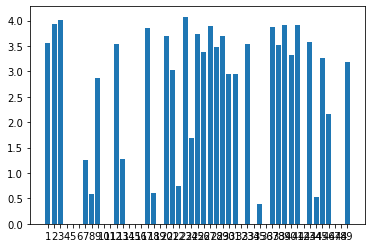

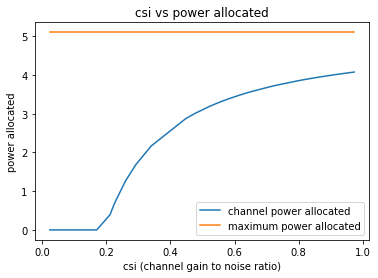

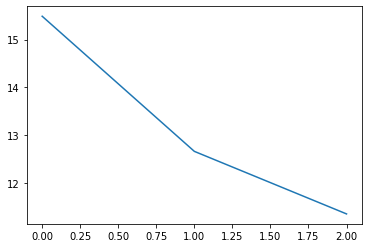

3
Power Allocated= 2.070078959441868
CSI= 0.42965321810585644
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8771340992083583
CSI= 0.39676190234748154
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293400


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.292091

Power Allocated= 2.73635484173436
CSI= 0.6019808043521884
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5211284889780554
CSI= 0.5329328832757713
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3898789350198038
CSI= 0.9923997619495244
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284996
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.285822

Power Allocated= 1.8436339063577245
CSI= 0.39155747689191844
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.295143
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.291710

Power Allocated= 3.0255156708974256
CSI= 0.7288514416679859
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.272944
Model client7 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.264319

Power Allocated= 0.8474212398966801
CSI= 0.281680925580475
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292186
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.282542

Power Allocated= 1.9578328710497859
CSI= 0.4098857040733376
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292249
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.281269

Power Allocated= 2.035197435225493
CSI= 0.42330910189554316
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294763
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.248558

Power Allocated= 3.299646739162135
CSI= 0.9108375312186026
SNR= 19.038283273448883
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292684
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.293847

Power Allocated= 3.264639708351904
CSI= 0.8826922553100331
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.2834, Accuracy: 2151/10000 (22%)

Power in training Round= 97.99902899055796



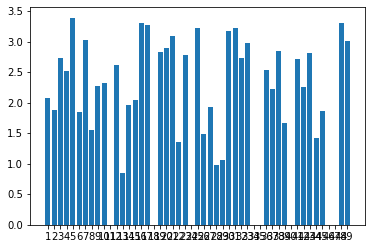

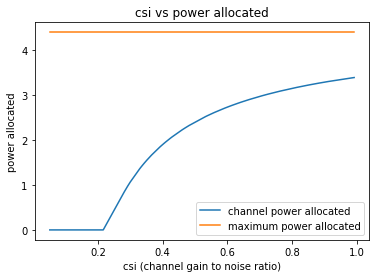

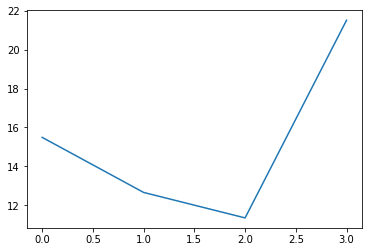

4
Power Allocated= 2.756784585431415
CSI= 0.7411156455381679
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.43242789276737
CSI= 0.5974880023510196
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.280004


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.230317

Power Allocated= 0
CSI= 0.05670809344196648
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9379555476310824
CSI= 0.8560572888549979
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284198


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.264603

Power Allocated= 2.7296866315545163
CSI= 0.7265250481805863
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287616
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.235294

Power Allocated= 3.0129976176987956
CSI= 0.9148259953552904
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.280109
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.276442

Power Allocated= 0.9563074392292745
CSI= 0.3174810567492431
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294004
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.237876

Power Allocated= 0
CSI= 0.020727501149448546
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13820286995847075
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Powe

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.2149, Accuracy: 3082/10000 (31%)

Power in training Round= 98.00092879942379



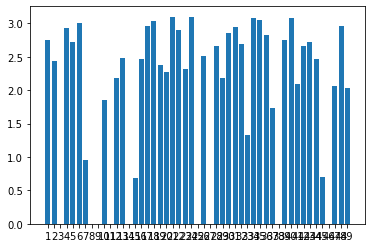

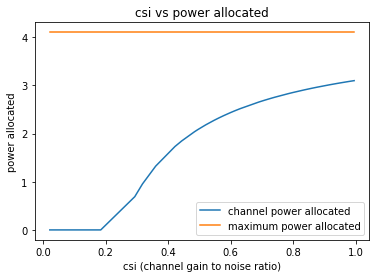

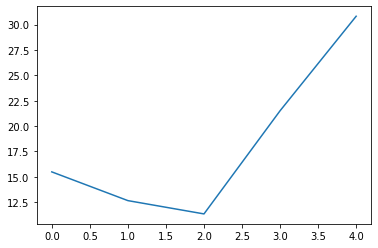

5
Power Allocated= 3.225300256948778
CSI= 0.5116563994176136
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.234292


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.142327

Power Allocated= 3.7398216813768976
CSI= 0.6944853477069451
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.204297
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.954248

Power Allocated= 2.938814872440172
CSI= 0.4462448944547245
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.212145
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.201799

Power Allocated= 0.41188985606622364
CSI= 0.20973827331503359
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.212430
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.109780

Power Allocated= 3.9556451590747
CSI= 0.8169322540065206
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.215131
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.024473

Power Allocated= 3.938623696592738
CSI= 0.8057282945152271
SNR= 17.04968172980

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.061124

Power Allocated= 1.692519440076064
CSI= 0.2867615857848178
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.248389
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.158791

Power Allocated= 0
CSI= 0.1757234638339651
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0367093972753745
CSI= 0.24136938669515562
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.189331
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.129063

Power Allocated= 3.5484710663882257
CSI= 0.6130208811916416
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.271184
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.937242

Power Allocated= 4.115025284365499
CSI= 0.9392214887925204
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.0479, Accuracy: 5387/10000 (54%)

Power in training Round= 97.99046440178127



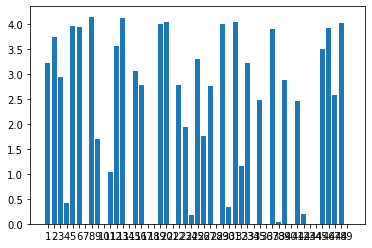

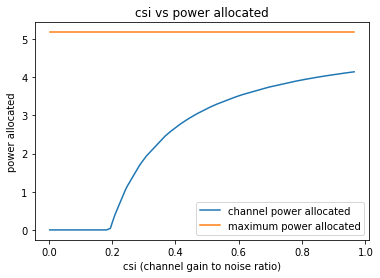

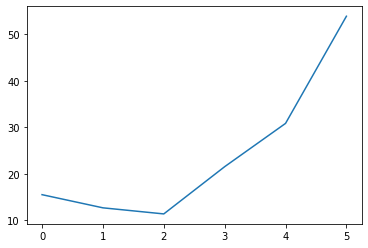

6
Power Allocated= 2.931444666269493
CSI= 0.6568137898423148
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1383499475895571
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4761014952431464
CSI= 0.2513924185443145
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.140269


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.996295

Power Allocated= 0
CSI= 0.17072795568126564
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.411196385130704
CSI= 0.9590028108943296
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.657768791410863
CSI= 0.3576310996007033
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.134425
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.905209

Power Allocated= 2.9594059274613294
CSI= 0.6691020782977867
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.058406
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.645208

Power Allocated= 3.3861013125274626
CSI= 0.93646560017099
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.992450191604285
CSI= 0.68423040

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 1.6572, Accuracy: 6616/10000 (66%)

Power in training Round= 98.00206610063995



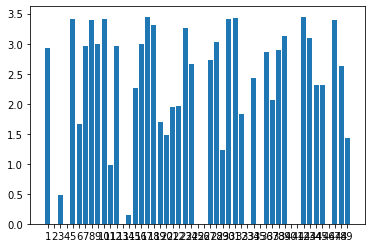

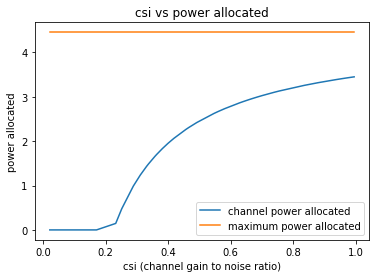

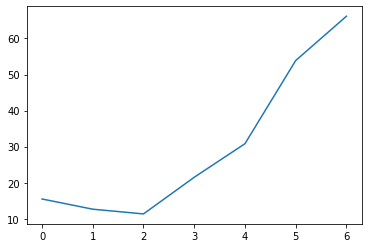

7
Power Allocated= 2.1179383821064044
CSI= 0.4066462901917737
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3107131913345995
CSI= 0.23439158309052388
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.802197


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.553314

Power Allocated= 2.033446064727855
CSI= 0.3931386411391443
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9585892543447674
CSI= 0.6178603383906963
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5470165505225073
CSI= 0.9708158740486075
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07806062543608305
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.268527540707955
CSI= 0.7642043896248331
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.855733


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.701716

Power Allocated= 3.4887491176030836
CSI= 0.9188399042147369
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.707077
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.524951

Power Allocated= 0
CSI= 0.11272394734685676
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2635120530396415
CSI= 0.43223319575675545
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.797708
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.407776

Power Allocated= 3.34609255585038
CSI= 0.8123572948051726
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.697827
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.262294

Power Allocated= 3.25450779985755
CSI= 0.7561035360357246
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 1.5529, Accuracy: 7070/10000 (71%)

Power in training Round= 97.99628115848911



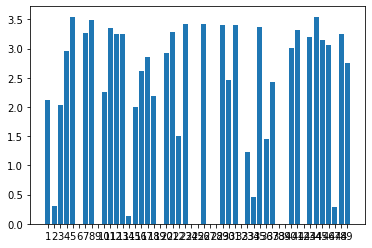

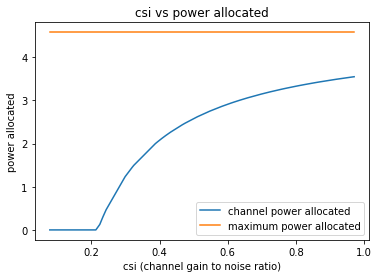

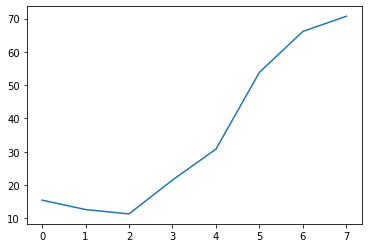

8
Power Allocated= 1.8016766353749771
CSI= 0.3094012183403678
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1664192189653505
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9530134206918173
CSI= 0.9253154376991114
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.600894


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.399176

Power Allocated= 3.5243429113844504
CSI= 0.6625223453346991
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.706819
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.539236

Power Allocated= 2.123485308614604
CSI= 0.34361419498544266
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16437268121072723
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17595743254728846
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.04195893665573003
CSI= 0.20032986205693926
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.686993
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.670275

Power Allocated= 1.9018421894019601
CSI= 0.3192966508284626


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 1.3513, Accuracy: 7142/10000 (71%)

Power in training Round= 98.00564784061483



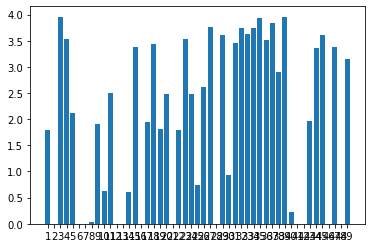

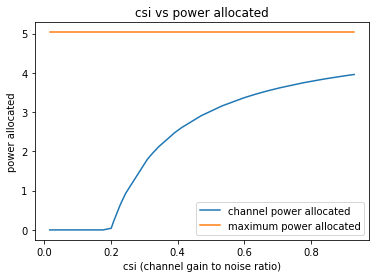

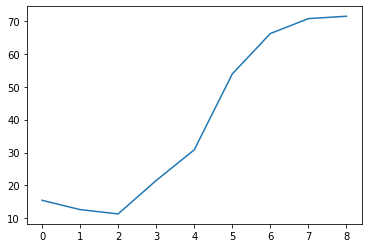

9
Power Allocated= 1.988901032550518
CSI= 0.38837842040963055
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4589615434968346
CSI= 0.9051839381388647
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3386501132739692
CSI= 0.3100718208161858
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.392234


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.206309

Power Allocated= 0
CSI= 0.06361694969887044
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9831122043033376
CSI= 0.27928302182477416
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.321740


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.076009

Power Allocated= 0.2289154625726022
CSI= 0.2306914742337809
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.494534
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.113906

Power Allocated= 0
CSI= 0.1363199538067289
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.282528540580948
CSI= 0.7805299352760376
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5156509093712858
CSI= 0.3280776955744569
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.476176
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.298657

Power Allocated= 0
CSI= 0.0008914039090324177
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4070538531460954
CSI= 0.8645616384487899
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.9917, Accuracy: 7672/10000 (77%)

Power in training Round= 98.00399742546774



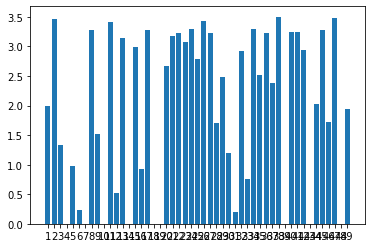

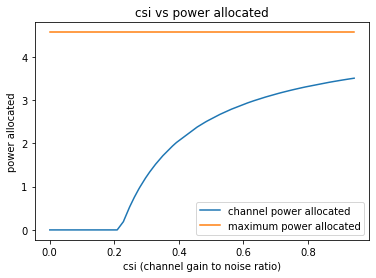

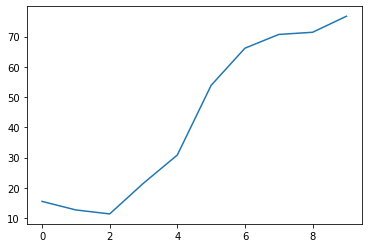

10
Power Allocated= 3.344453038483124
CSI= 0.8904531335520547
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4760638995072766
CSI= 0.5021560396935001
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.152795


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.234258

Power Allocated= 0.1675119607283131
CSI= 0.232560042828292
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.462068
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.326625

Power Allocated= 3.3322414987897964
CSI= 0.8808746751746611
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.625622233401214
CSI= 0.542931040756209
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.154519
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.254966

Power Allocated= 3.0468631742707633
CSI= 0.7039211813999819
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.199778
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.113065

Power Allocated= 1.9410347184525527
CSI= 0.39581355120943207
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.060399

Power Allocated= 2.8938265523340814
CSI= 0.6354652319380542
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.404910
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.136276

Power Allocated= 1.55583489223485
CSI= 0.34344883137529847
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.209028
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.116796

Power Allocated= 0
CSI= 0.05227742856404205
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4446249312920001
CSI= 0.24857987326215214
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.153065
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.110667

Power Allocated= 1.7106049556639369
CSI= 0.36272995904947225
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7455, Accuracy: 8014/10000 (80%)

Power in training Round= 98.00402039284522



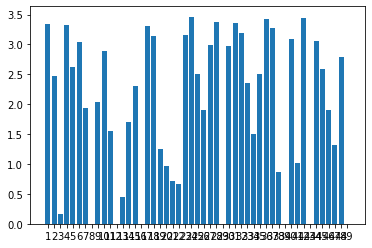

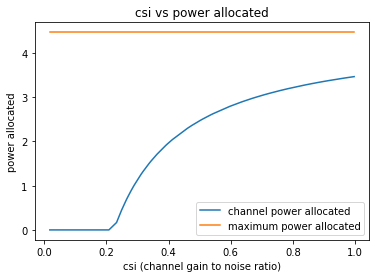

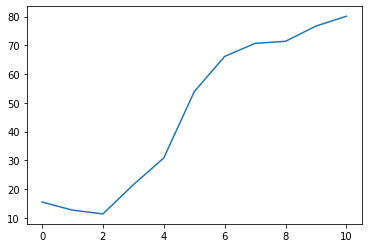

11
Power Allocated= 0
CSI= 0.03819757633605558
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.243303196235059
CSI= 0.5918528395894921
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.030681


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.843042

Power Allocated= 0.36698648559923086
CSI= 0.21901362847628747
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.020226
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.054659

Power Allocated= 3.7632598225517873
CSI= 0.8549547331987295
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.096668
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.964908

Power Allocated= 0
CSI= 0.1469233434311541
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.721158966012088
CSI= 0.3113564049069204
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.129627
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.160824

Power Allocated= 1.3219530396329922
CSI= 0.27693471528267
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 1.0927, Accuracy: 8233/10000 (82%)

Power in training Round= 98.0036114497847



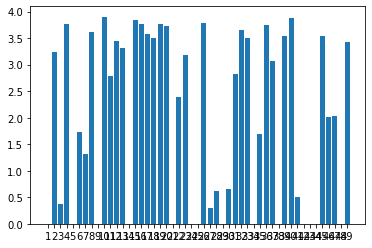

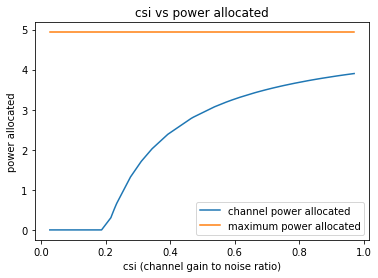

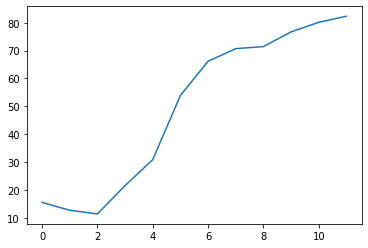

12
Power Allocated= 1.185403906113594
CSI= 0.3469871023878863
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.181349


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.658465

Power Allocated= 2.7698827951603127
CSI= 0.7707291791893827
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.108167
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.997444

Power Allocated= 2.3557939011289104
CSI= 0.5842617968661372
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8540812407955065
CSI= 0.45181930731404496
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.600827
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.071880

Power Allocated= 2.840397558307121
CSI= 0.8150239246401033
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.235625
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.042136

Power Allocated= 0
CSI= 0.239241777890832
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.901343

Power Allocated= 2.4876462787706757
CSI= 0.6330279309460088
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.193217
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.750130

Power Allocated= 2.9541013188940957
CSI= 0.8982675312107793
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.235908
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.181166

Power Allocated= 2.9656061944647174
CSI= 0.9076475753007132
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.238156
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.828222

Power Allocated= 0
CSI= 0.032588334611548975
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.23624171151804163
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this roun

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5112, Accuracy: 8494/10000 (85%)

Power in training Round= 98.00099591961717



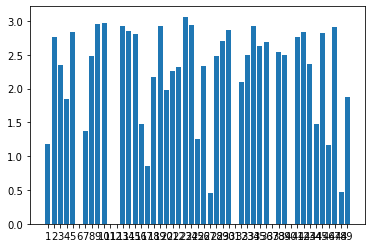

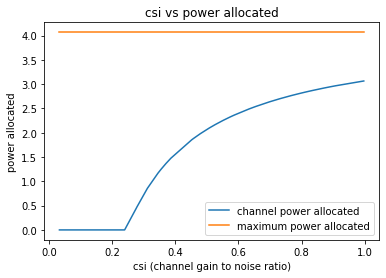

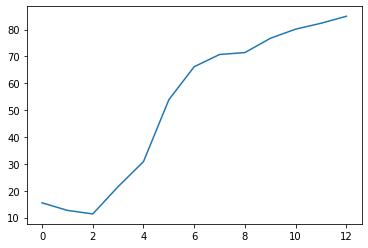

13
Power Allocated= 0
CSI= 0.13965371582093722
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4741210781114877
CSI= 0.9576494833845243
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.491760282504882
CSI= 0.49344113209557183
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.604259


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.964583

Power Allocated= 0
CSI= 0.09857289934536995
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3066750886082907
CSI= 0.4521471448367038
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.662127
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.569027

Power Allocated= 1.6310951298898413
CSI= 0.34635041149198675
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.891032
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.819496

Power Allocated= 0
CSI= 0.15985472360566222
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.454573206582512
CSI= 0.9400517069040797
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.867291
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.370465

Power

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7365, Accuracy: 8707/10000 (87%)

Power in training Round= 98.00510900504968



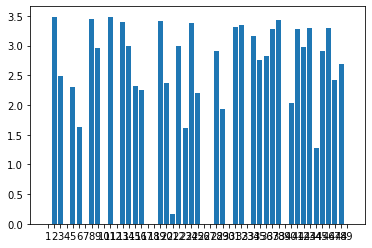

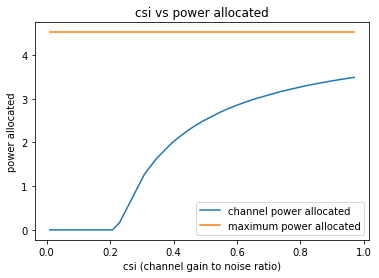

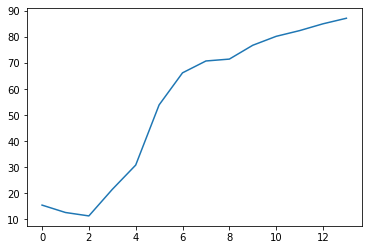

14
Power Allocated= 2.57305928061008
CSI= 0.525979812936561
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.977733


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.676887

Power Allocated= 3.2908219723987857
CSI= 0.8449864297531996
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.008439
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.770464

Power Allocated= 3.027616714451037
CSI= 0.6912492330956375
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.869087
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.809406

Power Allocated= 0.33099456732826305
CSI= 0.24135477086277202
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.273940
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.822834

Power Allocated= 3.266480365993414
CSI= 0.8279567446128588
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.831942
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.794538

Power Allocated= 2.802111224386344
CSI= 0.5980282865315296
SNR= 17.049681729

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.668790

Power Allocated= 2.202455499601049
CSI= 0.4401762158936511
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.672146
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.287086

Power Allocated= 0
CSI= 0.011876645092827931
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0997247081039934
CSI= 0.7275117624817485
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.908698
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.868829

Power Allocated= 3.2262390827407543
CSI= 0.8012603197228177
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.887424
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.806408

Power Allocated= 2.0370053899392544
CSI= 0.41029553928606566
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4669, Accuracy: 8716/10000 (87%)

Power in training Round= 98.00363928651352



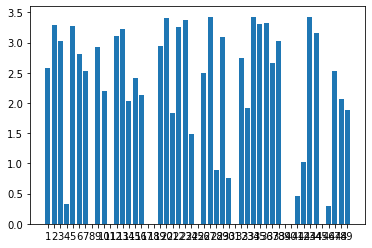

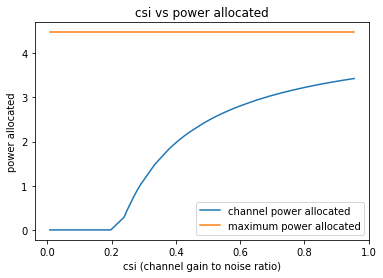

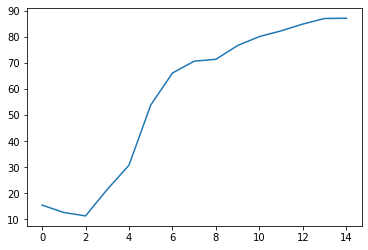

15
Power Allocated= 0
CSI= 0.14362343277620604
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08069645257471825
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16039544644756631
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.660511016815458
CSI= 0.35600333126637884
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.683629


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.553512

Power Allocated= 2.909515204425835
CSI= 0.6410427800453702
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.507609
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.393014

Power Allocated= 1.4145970450513263
CSI= 0.32734548059449875
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.815494
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.974339

Power Allocated= 2.8187998744031466
CSI= 0.6058132794409891
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.919580
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.716324

Power Allocated= 3.1280363314538255
CSI= 0.7454691329664211
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.825878
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.748868

Power Allocated= 1.8375289814848963
CSI= 0.3799472194327994
SNR= 18.1703579

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5146, Accuracy: 8994/10000 (90%)

Power in training Round= 98.00296624881433



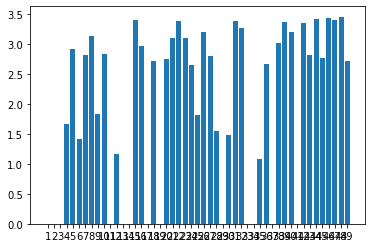

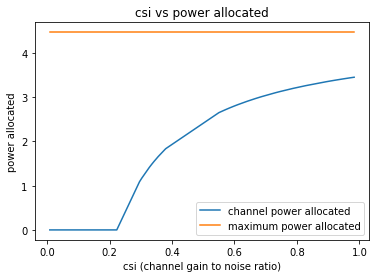

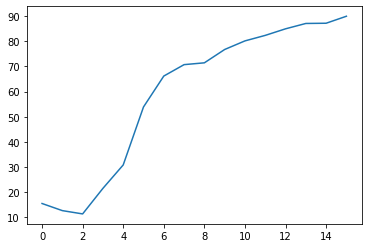

16
Power Allocated= 3.475646017646733
CSI= 0.828583616034554
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08431481035740285
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4250030317638167
CSI= 0.3069818303027134
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.745283


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.643427

Power Allocated= 3.254807067643048
CSI= 0.7004185527446993
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6519425041745803
CSI= 0.970325210499552
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3493967291352145
CSI= 0.7501154681356946
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.818929
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.573001

Power Allocated= 2.739920905528944
CSI= 0.5147729775989963
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.736238
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.580350

Power Allocated= 3.400774587153328
CSI= 0.7801832029487354
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.787007
Model client8 Train Epoch: 2 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7806, Accuracy: 9059/10000 (91%)

Power in training Round= 97.99391555303933



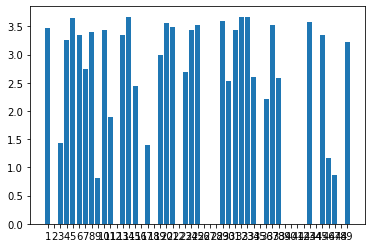

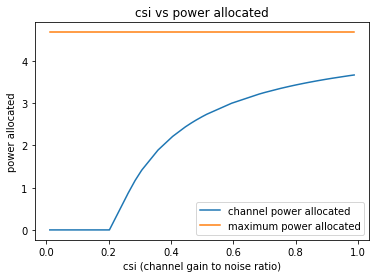

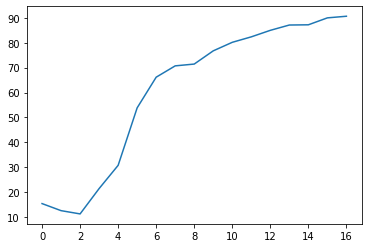

17
Power Allocated= 2.5436155598777104
CSI= 0.6468182053198237
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.889840


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.468938

Power Allocated= 3.059545239038338
CSI= 0.9707797435107762
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.178264
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.607219

Power Allocated= 0
CSI= 0.18857067813024386
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6897849972092107
CSI= 0.7143571389762491
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.081273366093061
CSI= 0.9916978499968728
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.833981


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.440775

Power Allocated= 1.070553679133826
CSI= 0.3312254872375998
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.853933
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.635220

Power Allocated= 0
CSI= 0.11885330982448039
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11655566392458272
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7539506041776058
CSI= 0.4281381989587749
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.791244
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.610977

Power Allocated= 2.7744675316291683
CSI= 0.7603536478877874
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.102144
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.636577

Pow

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3125, Accuracy: 9069/10000 (91%)

Power in training Round= 97.9948906997698



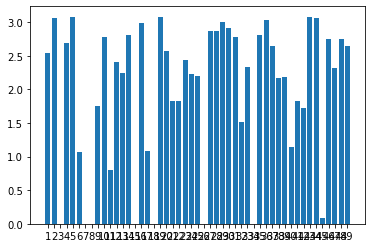

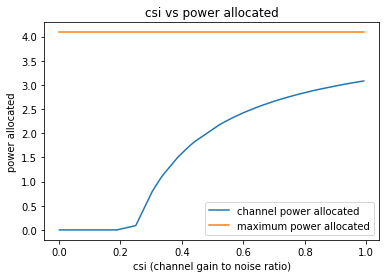

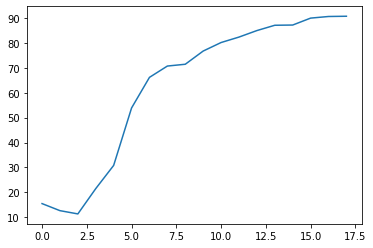

18
Power Allocated= 3.1274591473979516
CSI= 0.720022903310288
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8399999486685363
CSI= 0.2720123322107407
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.952228


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.595088

Power Allocated= 3.331458251732145
CSI= 0.8439918210593929
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.658734
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.022301

Power Allocated= 0
CSI= 0.0911021840767825
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.282292131076168
CSI= 0.44762522435755703
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.540760


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.387133

Power Allocated= 2.9261973073086267
CSI= 0.6288886743105083
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.440332
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.510792

Power Allocated= 0
CSI= 0.08051863899748157
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2245446551037933
CSI= 0.7741380890424417
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.691629
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.817446

Power Allocated= 0
CSI= 0.05951227819872684
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.175772817010055
CSI= 0.7459730287664776
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3405956764661173
CSI= 0.8505511968204901
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3142, Accuracy: 9231/10000 (92%)

Power in training Round= 97.99288786411435



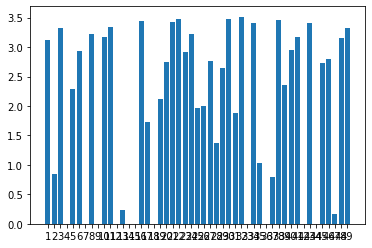

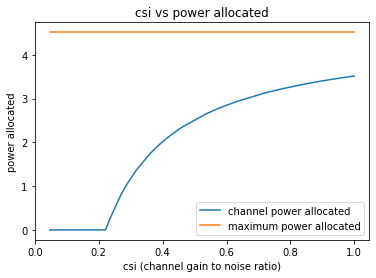

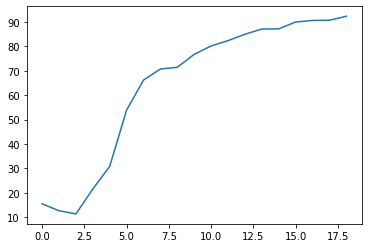

19
Power Allocated= 2.4790441925747793
CSI= 0.5368432432155716
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.442995


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.538439

Power Allocated= 2.951493474168205
CSI= 0.7192734295884109
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.743016
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.695258

Power Allocated= 2.9547522757312823
CSI= 0.7209633455921464
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.474455
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.419899

Power Allocated= 2.9644605704315268
CSI= 0.7260451714409879
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13970155638663173
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0033360827573277
CSI= 0.2995402722361509
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.665329


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.820427

Power Allocated= 3.290581114562504
CSI= 0.9512899337467962
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.679406
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.574117

Power Allocated= 3.283121883221471
CSI= 0.9445872449664466
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.619607
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.546340

Power Allocated= 0
CSI= 0.02228920818826563
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7591490805530925
CSI= 0.38720125434474184
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.584206
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.007216

Power Allocated= 0
CSI= 0.15930804330636772
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

P

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6089, Accuracy: 9244/10000 (92%)

Power in training Round= 97.9984557268507



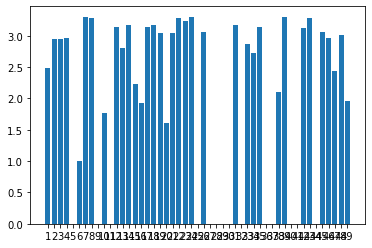

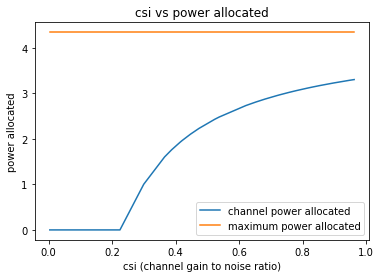

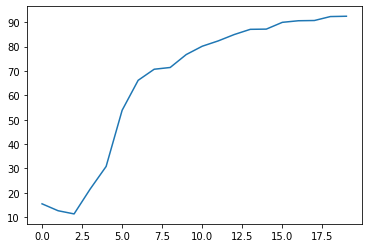

20
Power Allocated= 3.570795614490388
CSI= 0.9215473977633847
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8775834869109875
CSI= 0.5623210563171738
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.893580


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.375915

Power Allocated= 3.3661661640509286
CSI= 0.7753375478255821
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.157825
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.618608

Power Allocated= 1.2756122314214409
CSI= 0.29583043885596605
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.163656
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.647986

Power Allocated= 2.828001483630791
CSI= 0.5470682441623914
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.094833
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.697671

Power Allocated= 3.1499505932348795
CSI= 0.6640210290046418
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.990124
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.561861

Power Allocated= 1.391396737579667
CSI= 0.3063227849418906
SNR= 17.40065557

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.969012

Power Allocated= 0.7510640892224041
CSI= 0.25609093689403095
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.749282
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.710651

Power Allocated= 1.5903909468540784
CSI= 0.3262072225781142
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.843164
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.775001

Power Allocated= 1.0411669492326863
CSI= 0.2766435357591551
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.654111
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.445290

Power Allocated= 3.3085487254340014
CSI= 0.7421820750261945
SNR= 19.038283273448883
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.776491
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.624917

Power Allocated= 1.9010360258817678
CSI= 0.3629907721162732


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2872, Accuracy: 9253/10000 (93%)

Power in training Round= 97.99332329121053



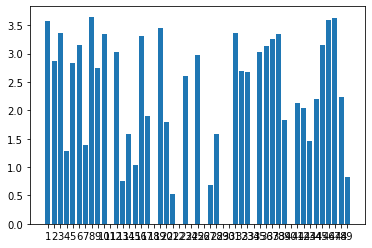

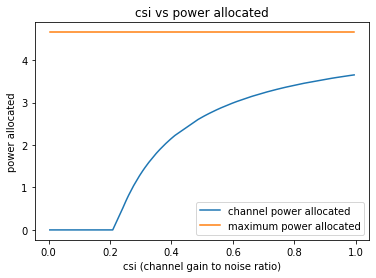

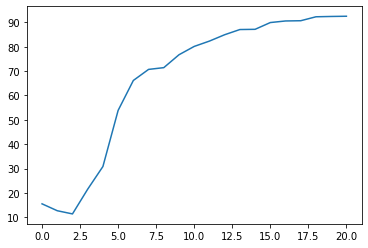

21
Power Allocated= 3.419708205488992
CSI= 0.8991586691432953
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.494900


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.318801

Power Allocated= 3.367710679175783
CSI= 0.8589970960986025
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.217786245507916
CSI= 0.7609928906259728
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.297198704274799
CSI= 0.8099394051428528
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2041834711532275
CSI= 0.3005100710037709
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.452762
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.441489

Power Allocated= 2.5497590810490784
CSI= 0.5045154415810904
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.607383
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.696324

Power Allocated= 2.640273399690488

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.459605

Power Allocated= 3.4016565780610852
CSI= 0.8847972791563782
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.664624
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.572521

Power Allocated= 2.281373731419832
CSI= 0.4443486158014174
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.562977
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.371306

Power Allocated= 0
CSI= 0.006989666021561258
SNR= 19.00770332812949
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1210417400538325
SNR= 19.038283273448883
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.429711755070337
CSI= 0.907319809704436
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.564728
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.66

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3056, Accuracy: 9351/10000 (94%)

Power in training Round= 98.00371389029442



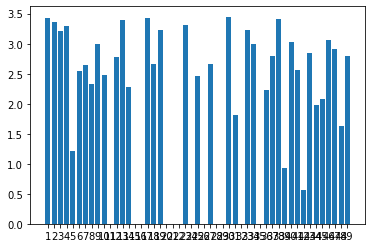

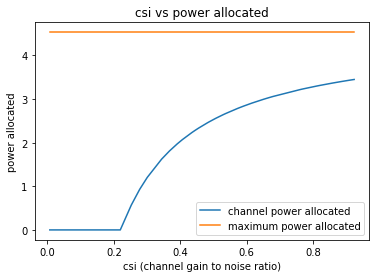

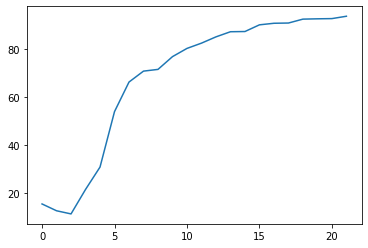

22
Power Allocated= 2.9441907928886053
CSI= 0.7506168940216077
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.64034331014203
CSI= 0.3793504358097416
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.159573


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.494982

Power Allocated= 2.097074376077489
CSI= 0.4588515782617144
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.769433476464492
CSI= 0.6635722740550316
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.100805
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.016005

Power Allocated= 3.178982784232221
CSI= 0.9112069446487302
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16371903752688188
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.845455613212466
CSI= 0.6988253446916333
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.170671376386883
CSI= 0.9043578694122069
SNR= 18.049650368948967
Client: client8
Model cl

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.387116

Power Allocated= 2.075500651384648
CSI= 0.45435386680409073
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.522868
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.619673

Power Allocated= 2.158518013218816
CSI= 0.4721635252748446
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.768765
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.850005

Power Allocated= 3.2409781909718403
CSI= 0.9657635506971763
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.589623
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.421733

Power Allocated= 3.090542007315284
CSI= 0.8432511475584358
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.645483369379534
CSI= 0.3800915701714247
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3195, Accuracy: 9371/10000 (94%)

Power in training Round= 98.0037923063575



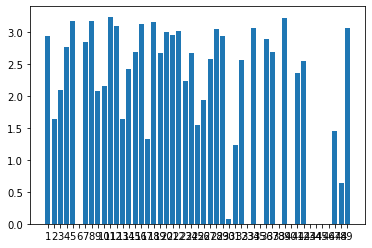

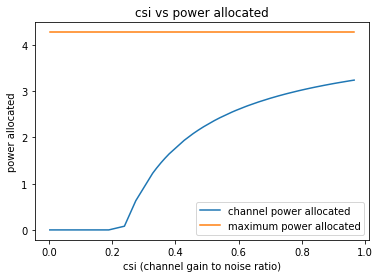

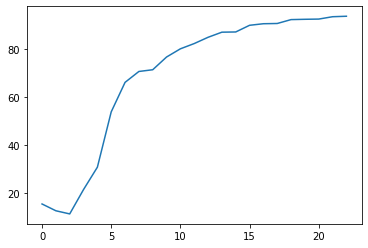

23
Power Allocated= 2.055054875045379
CSI= 0.39789257779188714
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.601761


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.500064

Power Allocated= 3.061798588134419
CSI= 0.6637913713903912
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.465524
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.574165

Power Allocated= 3.1764983945982896
CSI= 0.7184952594671414
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19145025739827337
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5577920430213927
CSI= 0.9896052041924414
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.713274


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.510706

Power Allocated= 2.4486559966633266
CSI= 0.4717782200545384
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.691747
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.617977

Power Allocated= 0
CSI= 0.06151924375294249
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16363115361389735
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.017503329333961593
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.44101630665384395
CSI= 0.2422903384555416
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.543274
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.287133

Power Allocated= 0
CSI= 0.026305288606985
SNR= 18.237505777687126
Client:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2848, Accuracy: 9405/10000 (94%)

Power in training Round= 97.99339438161698



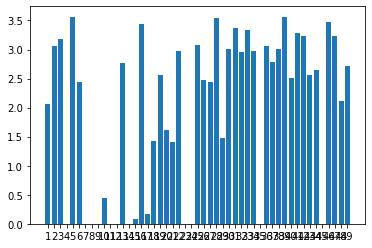

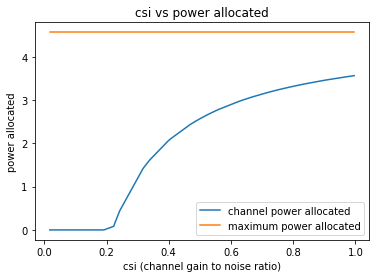

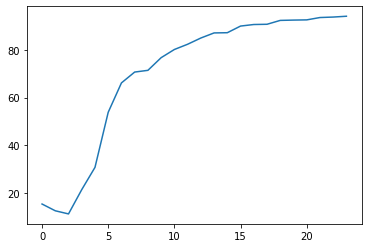

24
Power Allocated= 1.0456016173789453
CSI= 0.2997480345175926
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.019048


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.775688

Power Allocated= 3.3218246677069594
CSI= 0.9434743275681641
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.750831624445725
CSI= 0.6131563876883042
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.759398
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.488359

Power Allocated= 0
CSI= 0.2005838516288131
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03630128216820372
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8926606876956935
CSI= 0.6715572903250181
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.935337


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.429278

Power Allocated= 1.9458445863052112
CSI= 0.4105271755880414
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7913948370813784
CSI= 0.6287955342541799
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.647840
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182026

Power Allocated= 0
CSI= 0.05957540930258176
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1945212806876786
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09354228150717459
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0181689846820454
CSI= 0.733370134131682
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3183, Accuracy: 9427/10000 (94%)

Power in training Round= 97.999656230697



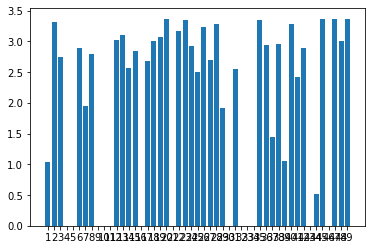

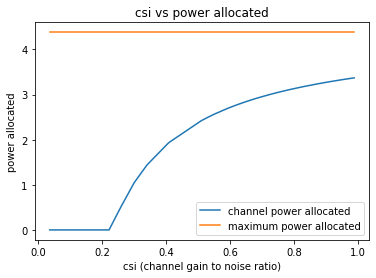

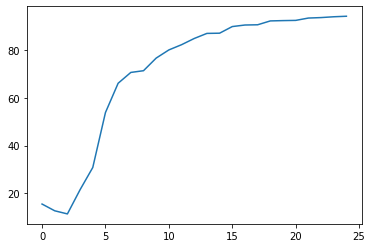

25
Power Allocated= 2.667609341439136
CSI= 0.5034864176705616
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.605657


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.474007

Power Allocated= 1.209846106608277
CSI= 0.2903672861078713
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.883120
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.493251

Power Allocated= 2.989246887791409
CSI= 0.6007761966647713
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.634029
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264341

Power Allocated= 3.3937453194713285
CSI= 0.7936413966837234
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.492179
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.323626

Power Allocated= 3.536794321524031
CSI= 0.8952824656554328
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.462771
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337492

Power Allocated= 2.547523520353196
CSI= 0.47478044205196857
SNR= 17.04968172980

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.419438

Power Allocated= 0
CSI= 0.031248157770126017
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9664787195888653
CSI= 0.3721232751564134
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.533958
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.323804

Power Allocated= 0
CSI= 0.20206933788588433
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.595640780967267
CSI= 0.9450728772594184
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2918746391821081
CSI= 0.22925864910543414
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.352646
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.482153

Power Allocated= 0
CSI= 0.08623610175473884
SNR= 18

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2635, Accuracy: 9439/10000 (94%)

Power in training Round= 98.00182981414393



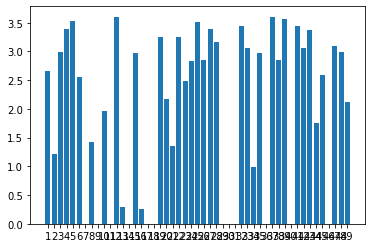

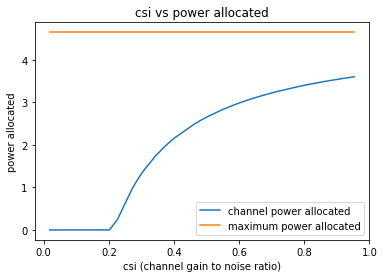

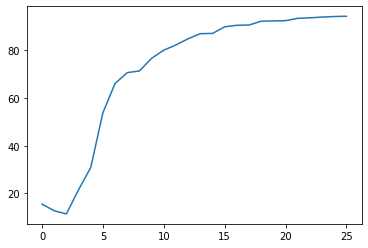

26
Power Allocated= 3.1026805874066907
CSI= 0.7125309809687658
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.437457


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.393244

Power Allocated= 2.104105241948891
CSI= 0.4163157311377924
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.503875
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.519488

Power Allocated= 3.2412173524246466
CSI= 0.7905694662649929
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.406339
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.366750

Power Allocated= 2.241180430037747
CSI= 0.44151125860963525
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.374166
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.714973

Power Allocated= 2.7497877050601067
CSI= 0.5693656362654258
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.432935
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.354451

Power Allocated= 0
CSI= 0.212220315829866
SNR= 17.04968172980935
Client: clie

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.477719

Power Allocated= 1.7640325097022411
CSI= 0.3646845565876081
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.801495
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.415729

Power Allocated= 2.8501871520413826
CSI= 0.6038861830188421
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.474842
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.418579

Power Allocated= 2.833534522386884
CSI= 0.5978737890435445
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.414318
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.305930

Power Allocated= 2.9917152586895006
CSI= 0.6603218210074263
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.437649
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.369712

Power Allocated= 0.05974051196876129
CSI= 0.2249016594829477
SNR= 18.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2061, Accuracy: 9437/10000 (94%)

Power in training Round= 98.0009431236767



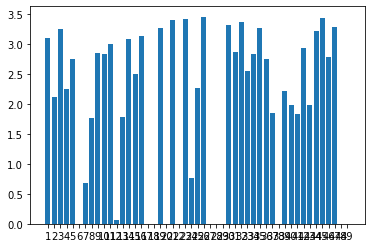

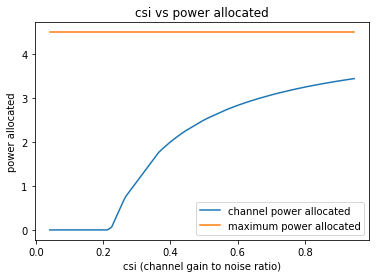

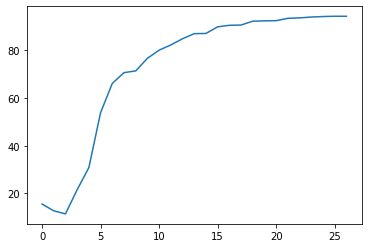

27
Power Allocated= 2.3655071026635124
CSI= 0.6527786676255859
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.609264


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.042562

Power Allocated= 2.370195796644781
CSI= 0.6547827476994909
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.47806413838403605
CSI= 0.2924527505677178
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.900667
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.509475

Power Allocated= 2.4869595010137053
CSI= 0.7089883523363929
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.598265
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.621919

Power Allocated= 2.5817756675386763
CSI= 0.7600838959574668
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.378054
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.438978

Power Allocated= 1.5778320968014192
CSI= 0.43111107721941155
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.631630

Power Allocated= 2.3717457834011797
CSI= 0.655447964845718
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.736061
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.432619

Power Allocated= 2.7837277585747184
CSI= 0.8979142041155301
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.336588
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.209050

Power Allocated= 1.8956219757546275
CSI= 0.4995509206404788
SNR= 19.038283273448883
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.473749
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.691217

Power Allocated= 2.414171468359872
CSI= 0.6741958887401862
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.631974
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.485693

Power Allocated= 2.043394659494372
CSI= 0.5393669804629422
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1842, Accuracy: 9470/10000 (95%)

Power in training Round= 97.99363405838712



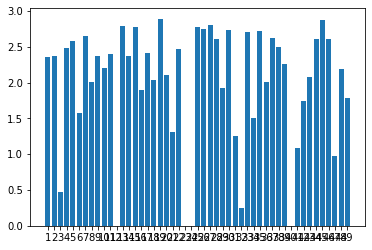

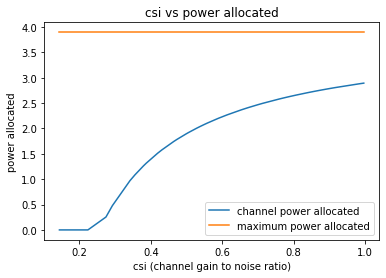

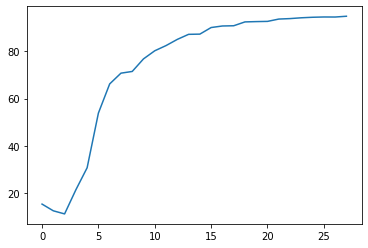

28
Power Allocated= 1.7833449372965697
CSI= 0.36672376447344945
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.274691


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.312208

Power Allocated= 0
CSI= 0.15392241876043722
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16914176954494287
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.0328521144915257
CSI= 0.2233468519534787
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.311353


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.321729

Power Allocated= 0
CSI= 0.19187972614472293
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6880651897659766
CSI= 0.5488089114728265
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.306067
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.534693

Power Allocated= 0
CSI= 0.004437842853802665
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2689983883556213
CSI= 0.8056754044875213
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.290696
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.202992

Power Allocated= 2.632149841963867
CSI= 0.5324691162779865
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.599874
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.295874

Power

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1915, Accuracy: 9504/10000 (95%)

Power in training Round= 98.000640556256



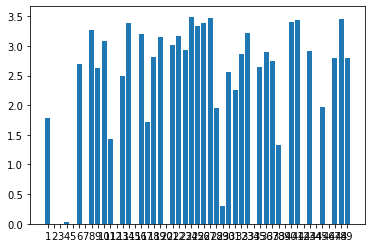

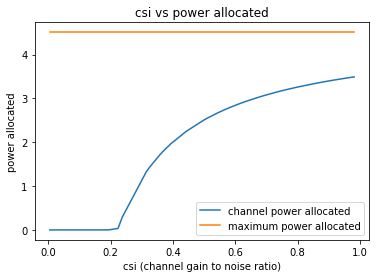

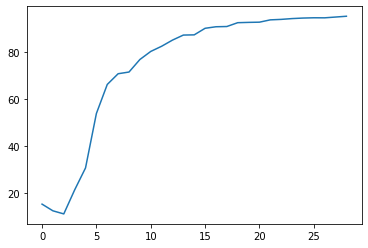

29
Power Allocated= 3.2783596679694478
CSI= 0.6966172457466911
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0186483487424347
CSI= 0.5898939887433282
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8872007745152524
CSI= 0.35377348990451796
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.451313


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.412681

Power Allocated= 2.816173298404908
CSI= 0.5269550964331015
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.479454
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.495315

Power Allocated= 0
CSI= 0.11363784055862935
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16698511006611494
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3443383071273587
CSI= 0.7301775631368094
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.408782


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.476003

Power Allocated= 0
CSI= 0.1854217497874917
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4445685482916186
CSI= 0.7878360310433259
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.377346
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.277685

Power Allocated= 1.4351199994054848
CSI= 0.3049944487179004
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.358951
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.386630

Power Allocated= 3.4443488409906147
CSI= 0.78769968548329
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.501693
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.421973

Power Allocated= 0
CSI= 0.07495425644990628
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3764, Accuracy: 9498/10000 (95%)

Power in training Round= 97.9927124871734



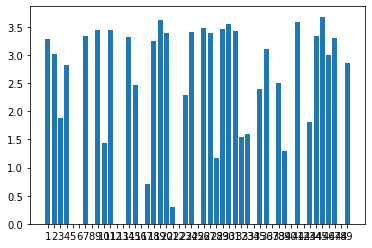

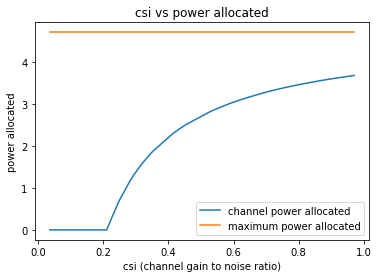

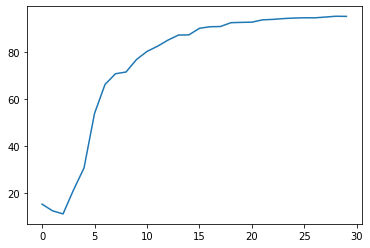

30
Power Allocated= 3.7049111413568183
CSI= 0.9408252699147656
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18081227502327857
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6622615031274055
CSI= 0.9045302193212368
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.603244


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.805960

Power Allocated= 3.657358902024565
CSI= 0.9005367433398851
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.546583
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.368631

Power Allocated= 0.8033244397837147
CSI= 0.25223967885003995
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.706120
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.342500

Power Allocated= 3.288161167165402
CSI= 0.6758370569680614
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.629972
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.545711

Power Allocated= 3.4158688452184967
CSI= 0.7396783890111184
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.589790
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.503575

Power Allocated= 1.7874454852150023
CSI= 0.33552967966083047
SNR= 18.04965036

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2027, Accuracy: 9508/10000 (95%)

Power in training Round= 97.99949918867384



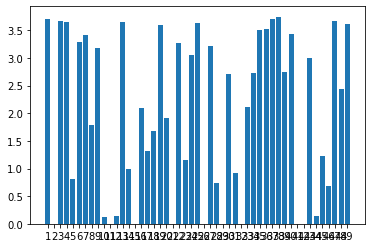

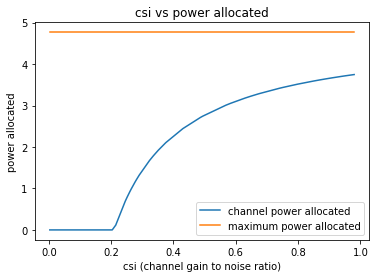

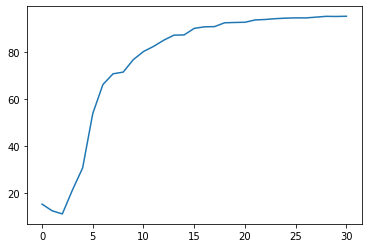

31
Power Allocated= 0.5824926058062996
CSI= 0.27444684393770324
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.899865


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.521452

Power Allocated= 2.36802044611982
CSI= 0.5381653408567484
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.999580815173641
CSI= 0.4491143091128843
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.488317
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.401283

Power Allocated= 2.0474923405608165
CSI= 0.4589907582459847
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.550744
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.395913

Power Allocated= 2.0726495851972255
CSI= 0.46435261128334593
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.479629
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.334048

Power Allocated= 1.6520137278994467
CSI= 0.3884744725264303
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.352873

Power Allocated= 1.6564159512715393
CSI= 0.38913996077608815
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.806969
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.359097

Power Allocated= 2.741536248943148
CSI= 0.6735597895071577
SNR= 19.038283273448883
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.350229
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.380818

Power Allocated= 2.773200818645093
CSI= 0.6882385276824687
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.282302
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.467214

Power Allocated= 2.503697916655179
CSI= 0.5805557274197518
SNR= 19.30637432921484
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.316382
Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.320663

Power Allocated= 2.2013950724287827
CSI= 0.49387828663040834
SNR

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1588, Accuracy: 9521/10000 (95%)

Power in training Round= 97.99866404366557



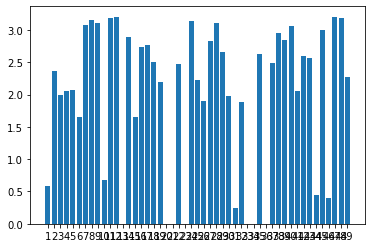

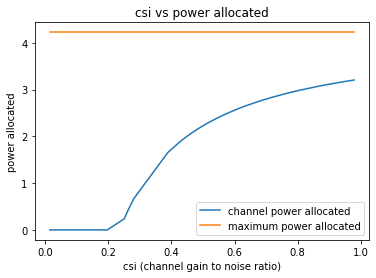

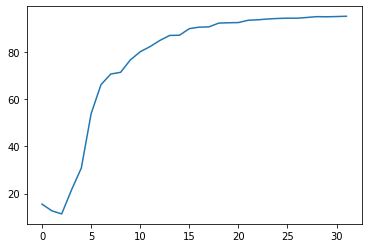

32
Power Allocated= 0
CSI= 0.07166553077095539
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7569606611245954
CSI= 0.5390370665269493
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.431654


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.686962

Power Allocated= 0
CSI= 0.2124367593741533
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10386051959246723
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11013082559457754
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.960603748344527
CSI= 0.3771426077711634
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.592637696607359
CSI= 0.4951762513253978
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.498361
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.519834

Power Allocated= 3.3169640575545114
CSI= 0.7721074065154607
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1548, Accuracy: 9557/10000 (96%)

Power in training Round= 98.00762225309195



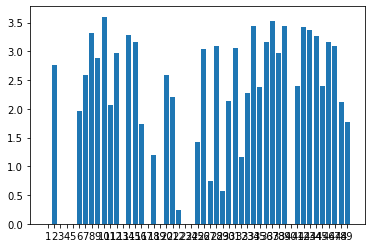

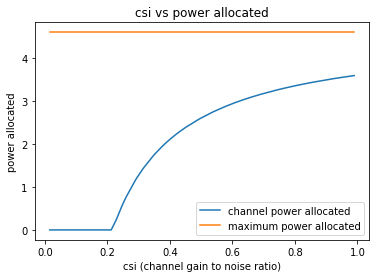

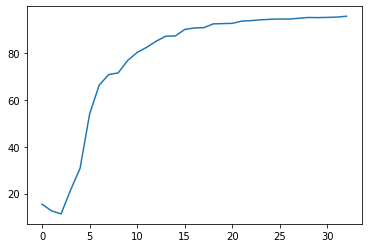

33
Power Allocated= 3.2094742578661153
CSI= 0.8276313720972149
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.318499


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.328789

Power Allocated= 3.401185509988755
CSI= 0.9837135010840362
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.365041
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.261511

Power Allocated= 3.378002654128253
CSI= 0.9617798346697451
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.446443
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.172912

Power Allocated= 1.8772991843856546
CSI= 0.39363221696645634
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9638561078631396
CSI= 0.6878120530780336
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.808151579356287
CSI= 0.6212761981744118
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.508573
Model client6 Train Epoch: 2 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.313807

Power Allocated= 2.746448627644749
CSI= 0.5983391220710782
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.275419
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146722

Power Allocated= 0
CSI= 0.006579253277656849
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8626557707588796
CSI= 0.6430513022127123
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8994231952648155
CSI= 0.6586233583426463
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.378795
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.132935

Power Allocated= 1.9747161523686332
CSI= 0.4093285153092744
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.273620
Model client14 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2723, Accuracy: 9543/10000 (95%)

Power in training Round= 97.99423803849905



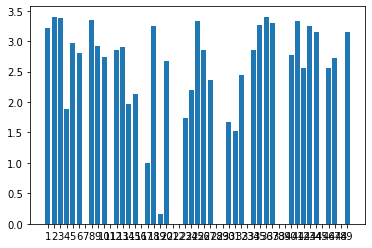

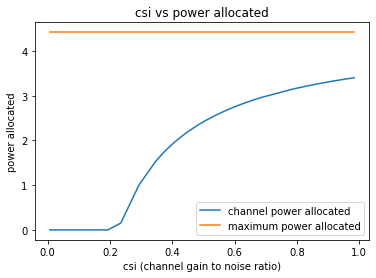

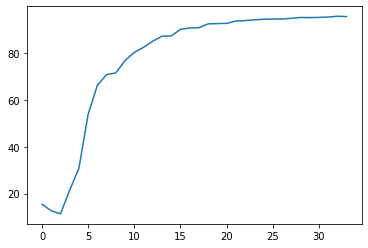

34
Power Allocated= 2.885949966378101
CSI= 0.6908192231851663
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6662595111086205
CSI= 0.5997910942641922
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.889726093630431
CSI= 0.409202040558061
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.815831443806898
CSI= 0.658902497957918
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.764962


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.341545

Power Allocated= 2.7927224627950276
CSI= 0.6490201502500442
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.197785156163742
CSI= 0.880497538037972
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1227136882833557
CSI= 0.8259050160733258
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.633325
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.710909

Power Allocated= 0
CSI= 0.18411772306038543
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8053728856637115
CSI= 0.6543929647351188
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.463672


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.432541

Power Allocated= 1.2800599033397302
CSI= 0.3274987498519679
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.510283
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.262045

Power Allocated= 2.7513228644505654
CSI= 0.6320378164766715
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.351023464290974
CSI= 0.5044178913112619
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.519744
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.489938

Power Allocated= 2.3066223947016007
CSI= 0.493368077502256
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.613420
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.634692

Power Allocated= 3.257049174942461
CSI= 0.9289730446826281
SNR= 18.866727777656166
Client: client14
Poor Channel, client n

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3053, Accuracy: 9550/10000 (96%)

Power in training Round= 97.99338787802816



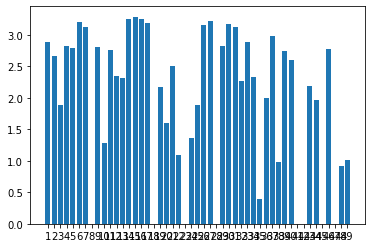

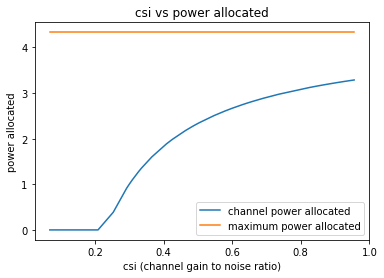

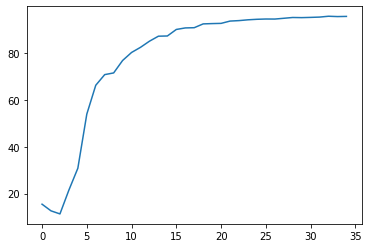

35
Power Allocated= 3.018948099449637
CSI= 0.9133055010841559
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.773011


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.336788

Power Allocated= 1.6926808742540946
CSI= 0.41301985586892076
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.794770
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.466029

Power Allocated= 2.764215829530587
CSI= 0.7409294599889403
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.635210
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.360081

Power Allocated= 3.0541387881003796
CSI= 0.9436337477498352
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.781216
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.345678

Power Allocated= 0
CSI= 0.2408197333408344
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2362081814727448
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Al

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.458008

Power Allocated= 0
CSI= 0.13458652390642434
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8792888791971736
CSI= 0.809990030110554
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.476457
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.194430

Power Allocated= 2.8465941126271783
CSI= 0.7890929279694018
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.877953
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.361808

Power Allocated= 3.0443448448998116
CSI= 0.9349926436055556
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1942577405846744
CSI= 0.5209379996210436
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.698251
Model client13 Train Epoch: 2 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1494, Accuracy: 9569/10000 (96%)

Power in training Round= 97.99476932911482



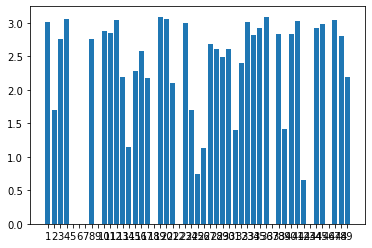

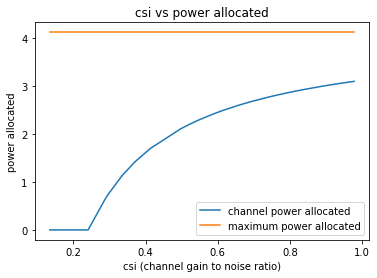

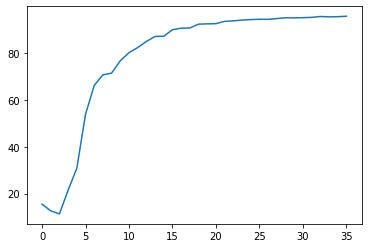

36
Power Allocated= 3.217599373295652
CSI= 0.7424217708671459
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.240421


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224678

Power Allocated= 2.6713525927021706
CSI= 0.5282089905423498
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.566230
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.683288

Power Allocated= 3.128052602667552
CSI= 0.6961412742195667
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.301741
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.315782

Power Allocated= 3.43005399251299
CSI= 0.8814543966890881
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.361839
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.303287

Power Allocated= 0
CSI= 0.011705430970044728
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4470908478564732
CSI= 0.8948931966894337
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.3

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115493

Power Allocated= 3.0663158615879453
CSI= 0.6674557010965256
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.381390
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.288479

Power Allocated= 1.7911100312690258
CSI= 0.3605640171092248
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.295126
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.464556

Power Allocated= 2.366468557853458
CSI= 0.45494372159014673
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.471037
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.272952

Power Allocated= 3.089519768718861
CSI= 0.6779555926433538
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.342554
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.281089

Power Allocated= 0
CSI= 0.14751286270897934
SNR= 18.237505777687126
Clien

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1428, Accuracy: 9570/10000 (96%)

Power in training Round= 97.99870487091033



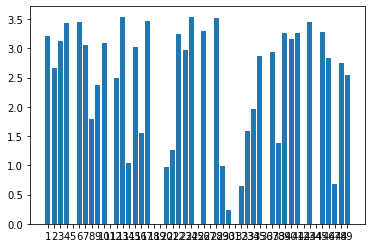

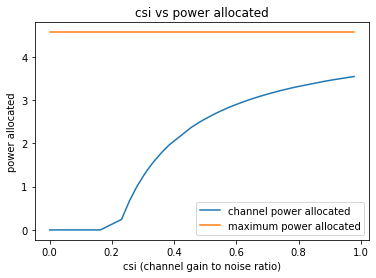

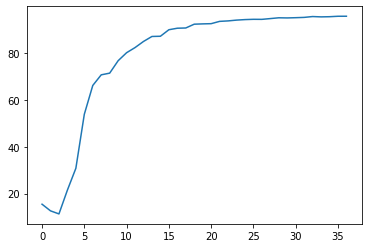

37
Power Allocated= 3.1770102519226677
CSI= 0.8019339432291113
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0220250119702583
CSI= 0.7132816475833372
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8100838309629292
CSI= 0.38256836107708825
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220914


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.304334

Power Allocated= 2.4505156677921116
CSI= 0.5067190733331626
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.426178
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.467702

Power Allocated= 0
CSI= 0.19145378217808962
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3979530137685803
CSI= 0.9746182705641269
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.332819


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.346873

Power Allocated= 3.1611583528772256
CSI= 0.79186758321451
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.444935
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.326948

Power Allocated= 3.3801988076386658
CSI= 0.9580407420025973
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.654418
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.256393

Power Allocated= 0.959619262051044
CSI= 0.28865223009763896
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.544073
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.603026

Power Allocated= 3.2971158281360458
CSI= 0.8874059941676898
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.337156
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.434737

Power Allocated= 3.1683898966441792
CSI= 0.7964282700389803
SNR= 18.237505

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1728, Accuracy: 9592/10000 (96%)

Power in training Round= 98.0055972250464



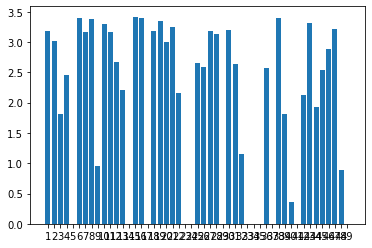

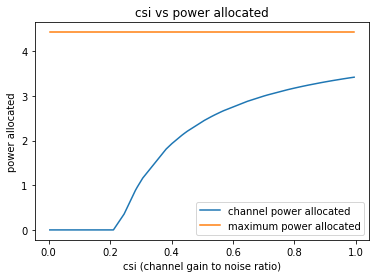

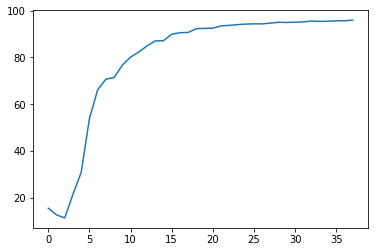

38
Power Allocated= 2.9297484502739017
CSI= 0.687619043968078
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.345236


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.296288

Power Allocated= 3.1717289738982726
CSI= 0.8248694082032796
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08472325926360891
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1365527589430372
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.468186977775601
CSI= 0.5219601395154034
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.321530


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.186372

Power Allocated= 2.8105244995430576
CSI= 0.6355187943850265
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.479932
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.445361

Power Allocated= 3.282636524107346
CSI= 0.9079307694353841
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.724331
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.293931

Power Allocated= 2.7381839044028418
CSI= 0.6075857632768898
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.366196
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.435978

Power Allocated= 0
CSI= 0.10169529898883822
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8392468541404705
CSI= 0.647334985799709
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1544, Accuracy: 9606/10000 (96%)

Power in training Round= 98.00092060456852



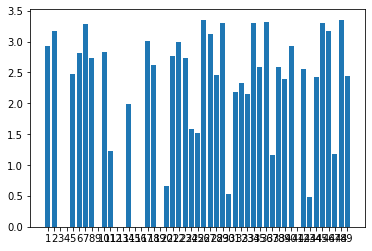

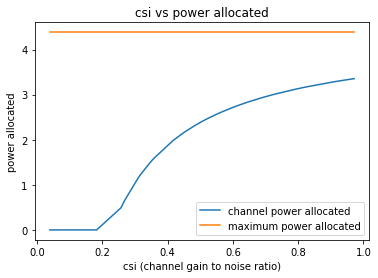

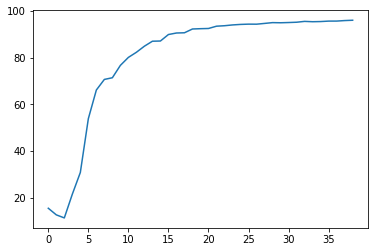

39
Power Allocated= 2.154536454915711
CSI= 0.3721427758644882
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.402482


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.149209

Power Allocated= 2.507381871114517
CSI= 0.4283948162259126
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8025737232942203
CSI= 0.3290444112299692
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.695531
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.524663

Power Allocated= 3.2082501436076454
CSI= 0.6122097845945794
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.399886
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.193352

Power Allocated= 2.715032005695991
CSI= 0.4702241929746054
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.287368
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188820

Power Allocated= 3.395497344963924
CSI= 0.6914769461582911
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.392045

Power Allocated= 2.8747166141508047
CSI= 0.5083986070040831
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.284722
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.256927

Power Allocated= 0
CSI= 0.034911283342906385
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.854536706551749
CSI= 0.5032356921680007
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.481167
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.463734

Power Allocated= 3.5967767405609585
CSI= 0.8032771029883239
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.692354
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.436869

Power Allocated= 3.1956481707717144
CSI= 0.6075227158126482
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2154, Accuracy: 9625/10000 (96%)

Power in training Round= 98.0008360147952



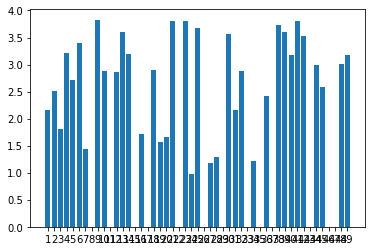

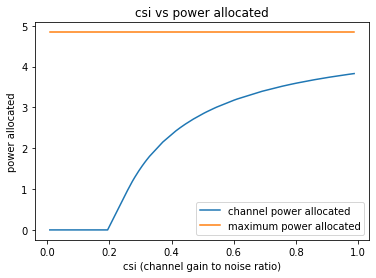

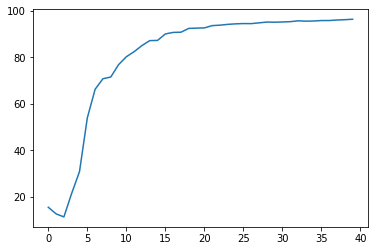

40
Power Allocated= 0
CSI= 0.14980163214887499
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.210007394501468
CSI= 0.9081986252923889
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.437317


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.350636

Power Allocated= 2.2022165564762366
CSI= 0.47418724683888314
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.720615
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.516475

Power Allocated= 2.7967662724517863
CSI= 0.6603616018061896
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.540813
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.318991

Power Allocated= 2.5358148973251176
CSI= 0.5632935753170679
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0664522763544317
CSI= 0.8034478568144027
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0813171236670227
CSI= 0.8131595265187456
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.853020
Model client7 Train Epoch: 2 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1587, Accuracy: 9613/10000 (96%)

Power in training Round= 97.99361193714421



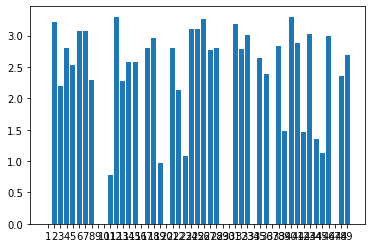

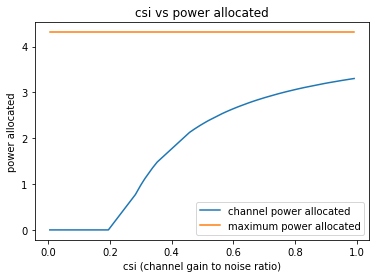

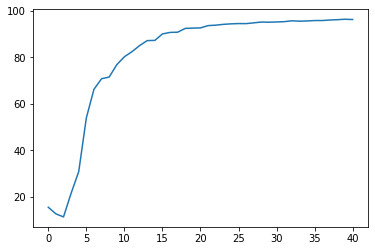

41
Power Allocated= 0
CSI= 0.2151497035292722
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.059508635482277
CSI= 0.4326905058623731
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.811156876493626
CSI= 0.6412424738237681
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.207794


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264826

Power Allocated= 0
CSI= 0.08743938081794722
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.12648879983138
CSI= 0.8037676959270432
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.324312
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.293788

Power Allocated= 1.5887858306929643
CSI= 0.3594738473403529
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.345739
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.368221

Power Allocated= 0
CSI= 0.22100037094762282
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.001222341916341
CSI= 0.42204652382709495
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.478528
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.214166

Power A

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1402, Accuracy: 9621/10000 (96%)

Power in training Round= 98.00163330077397



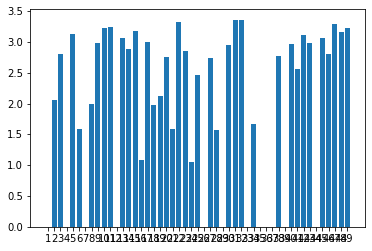

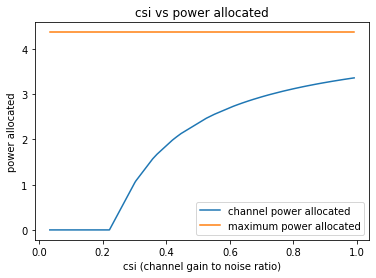

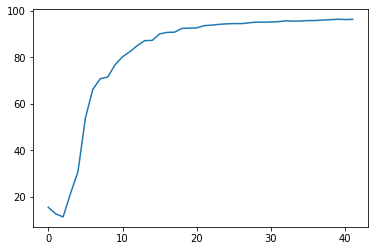

42
Power Allocated= 1.3001648777492685
CSI= 0.31085296435429566
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.200618


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.451938

Power Allocated= 3.4679418266829556
CSI= 0.9531270623520702
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6797647912359395
CSI= 0.5442606079473397
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.373926
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.185981

Power Allocated= 0
CSI= 0.0018532405016976616
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.135904578793546
CSI= 0.7240000859882934
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.005639513248703931
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.461887773160546
CSI= 0.9476588035795376
SNR= 17.40065557253575
Client: client7
Poor Channel, client

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.435067

Power Allocated= 3.041335511848374
CSI= 0.6776057658726025
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.573737
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.330833

Power Allocated= 2.8693211966017356
CSI= 0.606870249034578
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.248599
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174808

Power Allocated= 3.4612765975100945
CSI= 0.9471102505954946
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.380182
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.409544

Power Allocated= 3.1396659003469365
CSI= 0.7259770646457918
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.486102
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.411610

Power Allocated= 2.6397304179706493
CSI= 0.5326545279505032
SNR= 18

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1963, Accuracy: 9624/10000 (96%)

Power in training Round= 98.00411191834995



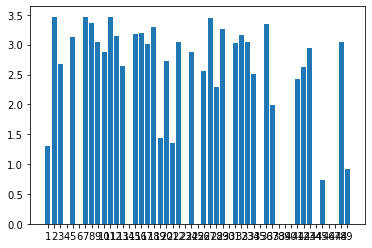

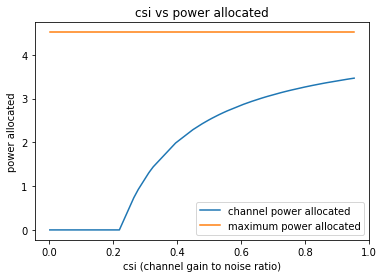

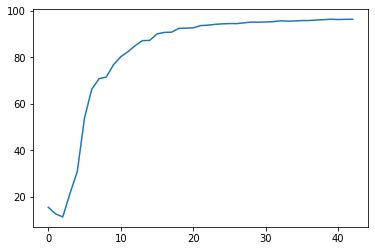

43
Power Allocated= 0.7718074155185204
CSI= 0.26363299216833525
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.730347


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.405608

Power Allocated= 2.9704061285697447
CSI= 0.6271349070384921
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.647767
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.346193

Power Allocated= 3.5284891999513217
CSI= 0.9648131003679293
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.494040
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.261152

Power Allocated= 3.1811224387148425
CSI= 0.7226284947647634
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.658300
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.489427

Power Allocated= 3.388514137315224
CSI= 0.8500183184347452
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.457009
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.246150

Power Allocated= 1.0943427175156022
CSI= 0.2881332338296899
SNR= 17.049681729

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client23 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.239128

Power Allocated= 3.3931779267227062
CSI= 0.8534014633429754
SNR= 20.79815877075119
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.441848
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.322340

Power Allocated= 1.0294671031274518
CSI= 0.28284604348970466
SNR= 20.820926259668504
Client: client25
Model client25 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.527947
Model client25 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.346859

Power Allocated= 3.43027950691703
CSI= 0.8813058474854658
SNR= 20.933480720216465
Client: client26
Model client26 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.284674
Model client26 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.278069

Power Allocated= 0
CSI= 0.21733842049456442
SNR= 21.048123653483067
Client: client27
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.214934399061407
CSI= 0.2985052374591749
SNR= 21.393107502467828
Client: client28
Model client28 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1319, Accuracy: 9614/10000 (96%)

Power in training Round= 97.99473334175454



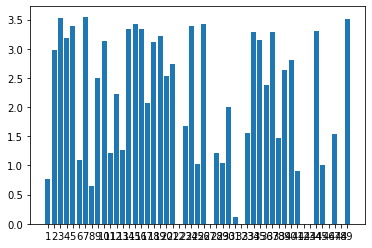

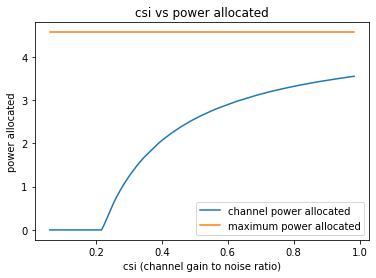

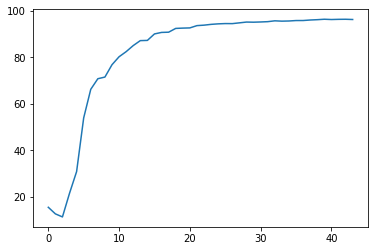

44
Power Allocated= 2.2688760285165364
CSI= 0.4451954714138342
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.302261


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200473

Power Allocated= 3.3097434208302805
CSI= 0.8296435299611322
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.234625
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.228717

Power Allocated= 0.9342933562545364
CSI= 0.27926821578594685
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.393782
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.521459

Power Allocated= 1.5112048660730153
CSI= 0.33290327752100046
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.346273
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.104785

Power Allocated= 0.849938266215295
CSI= 0.27284071725226633
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.288505
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.456760

Power Allocated= 2.7589967894687337
CSI= 0.5694489783857337
SNR= 17.049681

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.267561

Power Allocated= 2.293121111250022
CSI= 0.4500532567229564
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.309360
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.244929

Power Allocated= 2.235331180846823
CSI= 0.4386447445386339
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.201686
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.360957

Power Allocated= 2.203445850400099
CSI= 0.43259433625858834
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.307078
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.625246

Power Allocated= 3.472643729406771
CSI= 0.9592909176101977
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.257324
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.184666

Power Allocated= 2.5863954986462203
CSI= 0.5184880203429046
SNR

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1492, Accuracy: 9635/10000 (96%)

Power in training Round= 98.00821085584793



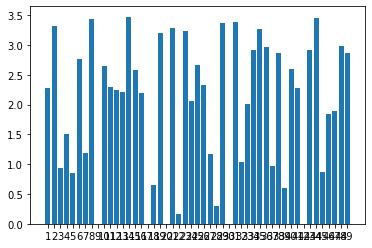

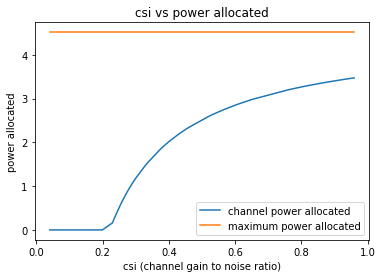

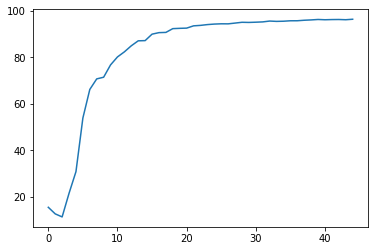

45
Power Allocated= 0
CSI= 0.07630155466111199
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3465096261421996
CSI= 0.31155422112375475
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.422782


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.395541

Power Allocated= 0.7626373685145165
CSI= 0.26360279846233303
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.314355
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.678429

Power Allocated= 3.4442568471059767
CSI= 0.8993073003261428
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.562503
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.215938

Power Allocated= 0
CSI= 0.18696112376727858
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1022031695938095
CSI= 0.2895176683951375
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.441983
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.379485

Power Allocated= 0
CSI= 0.07383224283935641
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Powe

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1198, Accuracy: 9650/10000 (96%)

Power in training Round= 97.9956523933487



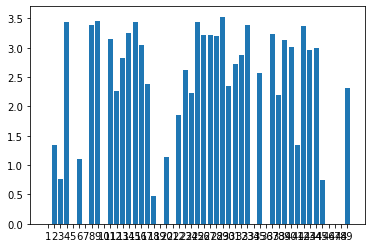

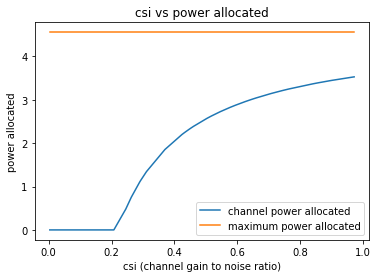

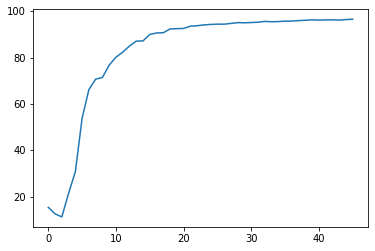

46
Power Allocated= 2.975187150915537
CSI= 0.7930063300895406
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0534365581962017
CSI= 0.8454696452753889
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.398279


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.320865

Power Allocated= 0.9086544521668438
CSI= 0.30052080129278225
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.236674
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.183493

Power Allocated= 3.1964948387251413
CSI= 0.9618008352221626
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.972021322145356
CSI= 0.4416590849894674
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.192500
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.329960

Power Allocated= 2.308878103895715
CSI= 0.5188516904043051
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.241468
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.201823

Power Allocated= 3.026766538018413
CSI= 0.82682580446021
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195879

Power Allocated= 1.4287548278581568
CSI= 0.35619432375592563
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.236367
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.235806

Power Allocated= 0.47629607775002425
CSI= 0.265963455388879
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.472691
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337649

Power Allocated= 2.7600597978555674
CSI= 0.6774373171315121
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.339748
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.088041

Power Allocated= 2.273982754873875
CSI= 0.5096246753273425
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.201601
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.212027

Power Allocated= 2.95488271488002
CSI= 0.7804400386685928
SNR

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1415, Accuracy: 9646/10000 (96%)

Power in training Round= 98.00068108170318



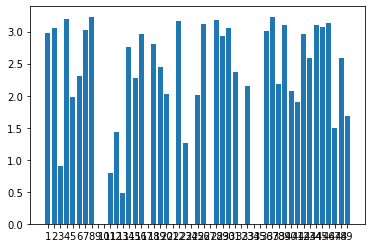

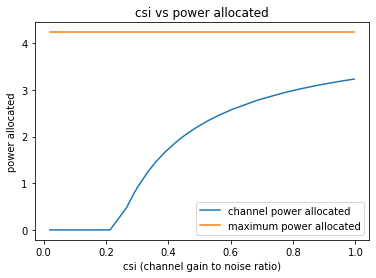

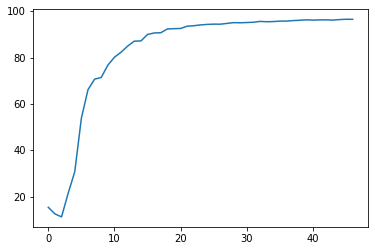

47
Power Allocated= 2.4429319439761974
CSI= 0.4915100630614766
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.527053


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.300210

Power Allocated= 2.021345376947616
CSI= 0.40714409103624827
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.371999
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.265360

Power Allocated= 3.4470814430923733
CSI= 0.9704998696378264
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.404827
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.252524

Power Allocated= 1.8142711408605754
CSI= 0.3754871274243248
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.431039
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.303957

Power Allocated= 0
CSI= 0.029941575702544188
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.1887002085308831
CSI= 0.23316664615172933
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss:

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.217850

Power Allocated= 2.680659164717515
CSI= 0.556539046774456
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1307064228895468
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8646968853555514
CSI= 0.6200468338098667
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.415077
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.293152

Power Allocated= 0
CSI= 0.20532579862773526
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7513415859758878
CSI= 0.26837448032122835
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.605599
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.368543

Power Allocated= 3.136685330088217
CSI= 0.745827308318114
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1394, Accuracy: 9641/10000 (96%)

Power in training Round= 98.00586646193909



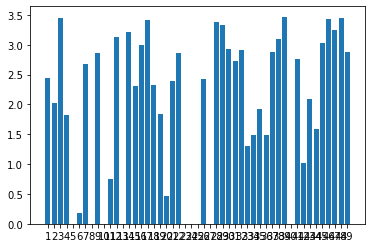

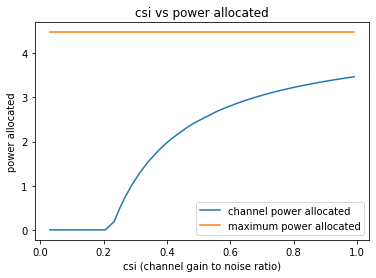

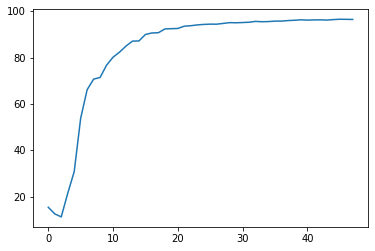

48
Power Allocated= 3.290388751091306
CSI= 0.9166203530681869
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.300562


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.123150

Power Allocated= 3.138261613097246
CSI= 0.8044461101330691
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.37079556671401903
CSI= 0.24934189976348697
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.921195
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.422422

Power Allocated= 0
CSI= 0.013853597090207947
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0145047528288034
CSI= 0.7316101330346856
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.226692


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142124

Power Allocated= 3.271821564830696
CSI= 0.9012813902661903
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.508586
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.477607

Power Allocated= 0
CSI= 0.11677071633714409
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5877231153815456
CSI= 0.5575286350188625
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.344657
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.401391

Power Allocated= 2.8001441541212477
CSI= 0.6324275422366046
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.352406
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.214747

Power Allocated= 0
CSI= 0.21048571350543022
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1184, Accuracy: 9656/10000 (97%)

Power in training Round= 98.00115499641635



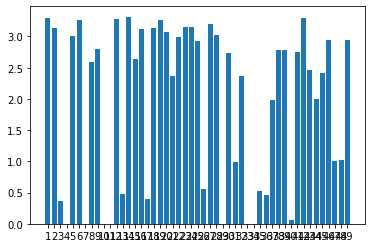

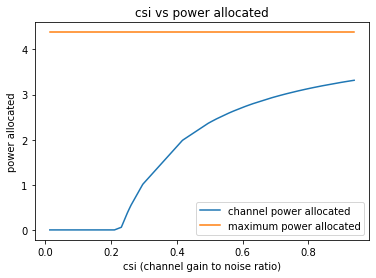

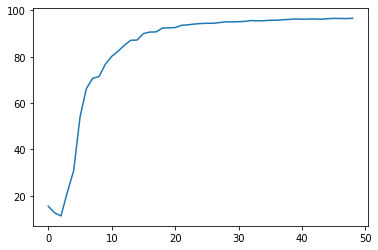

49
Power Allocated= 0.23942504847278645
CSI= 0.24611563873048903
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.469436


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.398896

Power Allocated= 3.1741168158522504
CSI= 0.8861800120598095
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.480597
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249288

Power Allocated= 0.9074468304883045
CSI= 0.29454136320922
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.362285
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.166423

Power Allocated= 2.1381832450287503
CSI= 0.4620276835171486
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18062549512544956
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9425338770789615
CSI= 0.7352823093278142
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.191452


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.108649

Power Allocated= 1.369638950609395
CSI= 0.34095751065470026
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.336731
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.081228

Power Allocated= 3.0997114574334477
CSI= 0.8313628228548534
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1898176441643216
CSI= 0.8986840869619707
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.253895
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136991

Power Allocated= 2.97674448866926
CSI= 0.7542551894296738
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.246405
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.168452

Power Allocated= 0
CSI= 0.1723030467207156
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1159, Accuracy: 9663/10000 (97%)

Power in training Round= 97.99298596789306



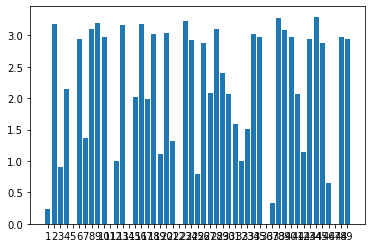

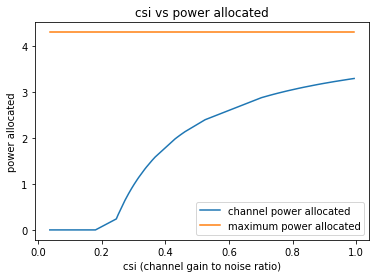

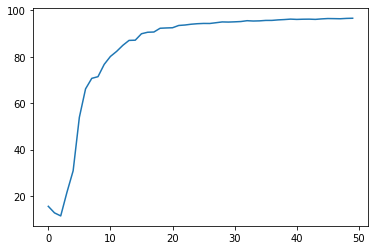

50
Power Allocated= 3.161869063608536
CSI= 0.9142336637985623
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2468890520104523
CSI= 0.9912843479043595
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235975


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.444115

Power Allocated= 0.7508454917264515
CSI= 0.2853200677111377
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.260719
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182414

Power Allocated= 2.160205159908234
CSI= 0.47721850149674483
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.338942
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.181002

Power Allocated= 0
CSI= 0.1251696611248696
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2781672202473855
CSI= 0.2514133127513133
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.980066


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224124

Power Allocated= 3.2396125854411393
CSI= 0.9841853721467567
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.339358
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.173224

Power Allocated= 2.5895171197555045
CSI= 0.600180937209761
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.399110
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.130253

Power Allocated= 2.966400706801605
CSI= 0.7756263287082001
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.326663
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109187

Power Allocated= 1.0723447065935563
CSI= 0.3141358005332493
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.111329
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079327

Power Allocated= 2.1025838001370727
CSI= 0.46444714370905127
SNR= 18.23750

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1141, Accuracy: 9672/10000 (97%)

Power in training Round= 98.00231062943726



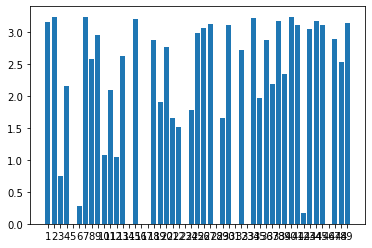

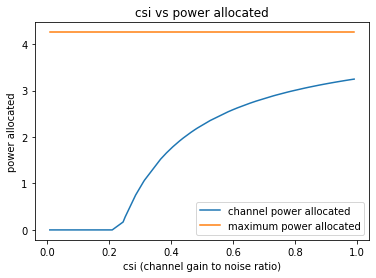

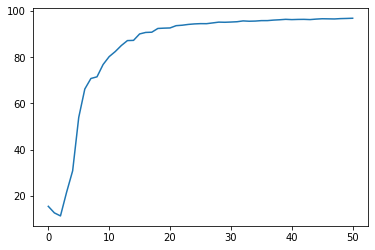

51
Power Allocated= 0
CSI= 0.09844150919836259
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8121439378940609
CSI= 0.27062112414498973
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.821435


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.351930

Power Allocated= 3.212969726717019
CSI= 0.7725722936537307
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.582501
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.325303

Power Allocated= 0.4757273138775462
CSI= 0.24803927054469754
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.520171
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.424275

Power Allocated= 0
CSI= 0.02488427931693815
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.81062773495368
CSI= 0.5893727000092349
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.395278
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.126138

Power Allocated= 0
CSI= 0.08045498500088677
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power A

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1308, Accuracy: 9662/10000 (97%)

Power in training Round= 98.00327855985924



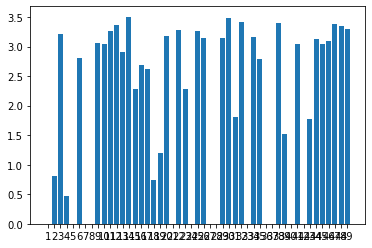

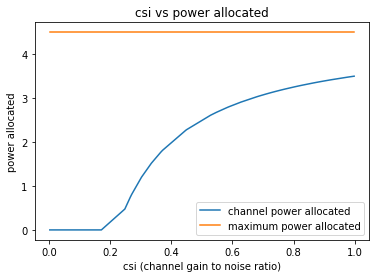

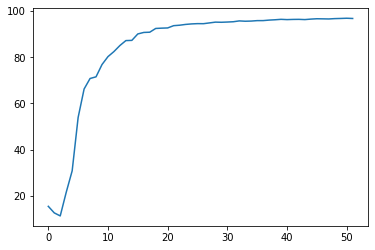

52
Power Allocated= 1.8247524661595818
CSI= 0.46734959966719425
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.282153


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.315059

Power Allocated= 2.9289099933032676
CSI= 0.9656533692692386
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.309286
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.367525

Power Allocated= 0.6092344245491823
CSI= 0.2980409307559333
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.356006
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.367902

Power Allocated= 0
CSI= 0.195576677955555
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.771739003755931
CSI= 0.83840620024395
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.407302


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.323387

Power Allocated= 2.5833369415024734
CSI= 0.7240388626370269
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.206644
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.271844

Power Allocated= 1.8299929693121708
CSI= 0.46849701775636143
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.364976
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.254243

Power Allocated= 2.824327865161149
CSI= 0.8770772624990644
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.425982
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.251663

Power Allocated= 2.434535871857821
CSI= 0.6536193768920768
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.233356
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.226004

Power Allocated= 2.804839175917188
CSI= 0.8623372574144417
SNR= 18.1878203886

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1166, Accuracy: 9662/10000 (97%)

Power in training Round= 97.99646028525265



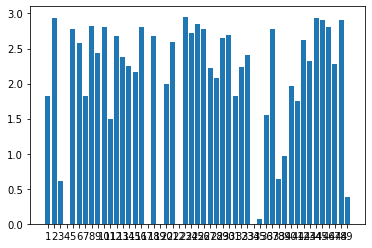

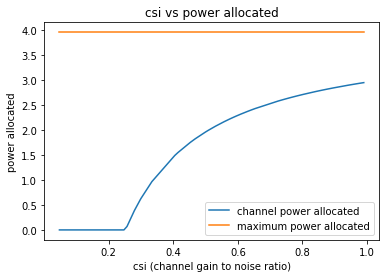

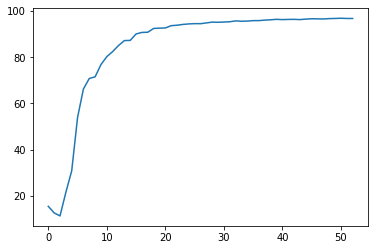

53
Power Allocated= 0
CSI= 0.20357455990397588
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08718959661648329
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03823134161084396
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0132624659785736
CSI= 0.6838953892638527
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.114724


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.232069

Power Allocated= 2.2486595168662045
CSI= 0.4490719042006269
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.230149
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264816

Power Allocated= 0
CSI= 0.10042262437397398
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5990124685975893
CSI= 0.532917818961438
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.279264
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.132320

Power Allocated= 0
CSI= 0.19267828223652872
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1870723819388456
CSI= 0.30409907134845227
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.329055
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095372

Power

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1128, Accuracy: 9674/10000 (97%)

Power in training Round= 97.9975697179682



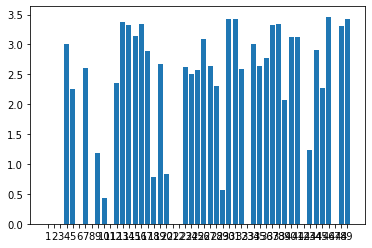

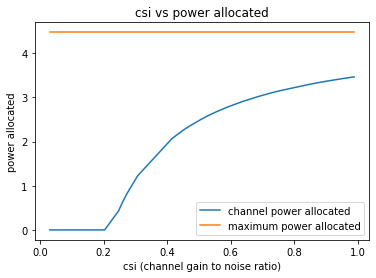

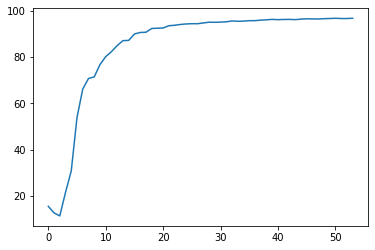

54
Power Allocated= 0
CSI= 0.05900958215624419
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.602882490912103
CSI= 0.39262208714714386
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.693480


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142532

Power Allocated= 0.7197691368622685
CSI= 0.22572895581688346
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.724237
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.192189

Power Allocated= 0
CSI= 0.02625396067500485
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3597270316146135
CSI= 0.5586174238878345
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.228591
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.415729

Power Allocated= 0.9418045673150957
CSI= 0.23763940122630856
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.297530
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.177278

Power Allocated= 0
CSI= 0.018745537457003247
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Po

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2182, Accuracy: 9674/10000 (97%)

Power in training Round= 98.00894093357356



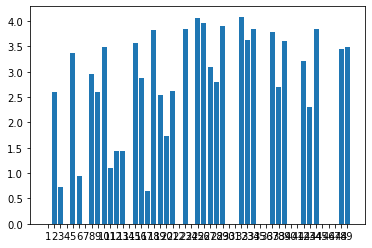

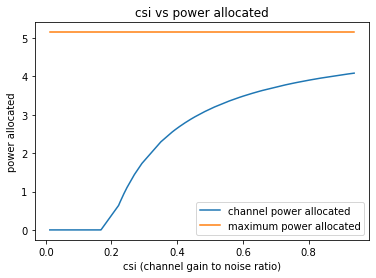

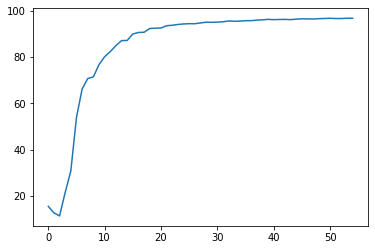

55
Power Allocated= 3.4174474978428595
CSI= 0.9076767933452468
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.580594


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.156082

Power Allocated= 0
CSI= 0.11136464100796972
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3140391659127277
CSI= 0.45348963220006144
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.441478


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182587

Power Allocated= 3.230941372667299
CSI= 0.7762650014231394
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.489473
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.276881

Power Allocated= 3.4470046360748667
CSI= 0.9326995635830552
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.473136
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.260045

Power Allocated= 2.7065006917855206
CSI= 0.5516752703413828
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.517481
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.292944

Power Allocated= 3.3701565647655327
CSI= 0.870318475073883
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.414435
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.291568

Power Allocated= 0
CSI= 0.06617023161094404
SNR= 18.049650368948967
Client: cl

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1303, Accuracy: 9676/10000 (97%)

Power in training Round= 98.00134970341763



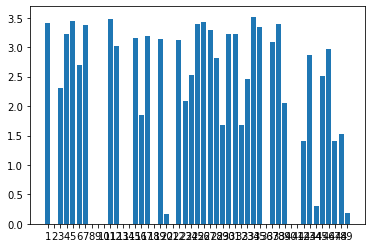

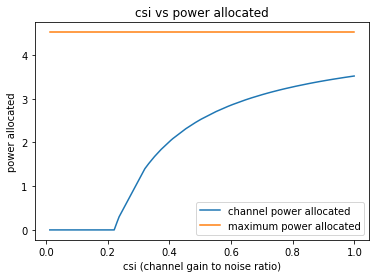

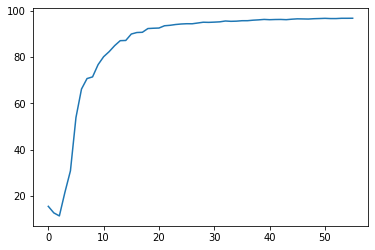

56
Power Allocated= 3.2335460101074425
CSI= 0.7716943925996623
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.430789779853659
CSI= 0.9102444380769122
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.367758637382701
CSI= 0.8608540175885268
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0330029232972278
CSI= 0.6682737066365553
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.304683


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.204132

Power Allocated= 1.9302678238336504
CSI= 0.384744428670707
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.195422
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153728

Power Allocated= 3.469469532327725
CSI= 0.9434618715345882
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.521607
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116313

Power Allocated= 3.1354299427080043
CSI= 0.7173776962457412
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.461594
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.210014

Power Allocated= 0
CSI= 0.15924990931053085
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1812244219458767
CSI= 0.7417454725333817
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.406593

Power Allocated= 3.1240852869349274
CSI= 0.7115865183733496
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.385036
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264965

Power Allocated= 3.172289011054268
CSI= 0.7368617001342171
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.286629
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.221246

Power Allocated= 0.40591776875382735
CSI= 0.242513722059706
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.441164
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224825

Power Allocated= 2.911805368222343
CSI= 0.618203467071958
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.381648
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.242820

Power Allocated= 1.3669699915339768
CSI= 0.31621295402054184
SNR

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1592, Accuracy: 9676/10000 (97%)

Power in training Round= 98.00189965246346



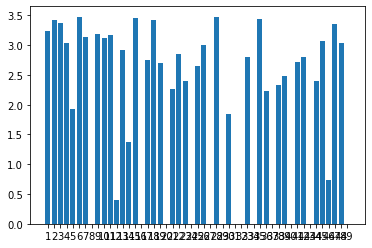

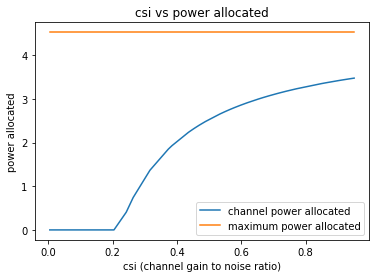

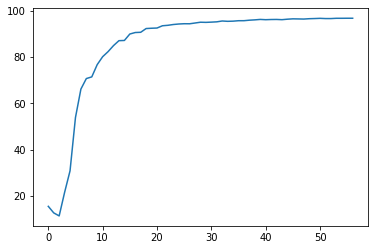

57
Power Allocated= 2.1447394492453196
CSI= 0.43596027767354995
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4829595382180387
CSI= 0.5113606774700677
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.543539


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.375443

Power Allocated= 2.954509645763857
CSI= 0.6738468355725535
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8074407910416923
CSI= 0.6130886011423274
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.398549
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.257019

Power Allocated= 3.395815500733644
CSI= 0.9590385905136538
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.439994
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.281853

Power Allocated= 0
CSI= 0.15673285471568354
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.029461390636216778
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2191374355247655
CSI= 0.8200828624514385
SNR

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.267081

Power Allocated= 3.1487720854103936
CSI= 0.7753414596328124
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.472901
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.262878

Power Allocated= 2.8975053059792057
CSI= 0.6489203800576384
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.461219
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.283748

Power Allocated= 2.3055639052962573
CSI= 0.4688314952346997
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.315764
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.392690

Power Allocated= 2.255724301871383
CSI= 0.4581267338104785
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.476498
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115572

Power Allocated= 3.2095568547391506
CSI= 0.813689807321726
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1528, Accuracy: 9666/10000 (97%)

Power in training Round= 98.00481076696725



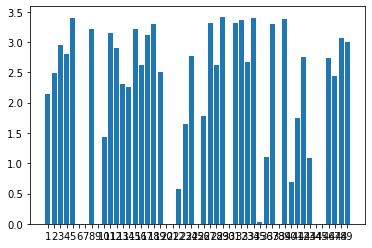

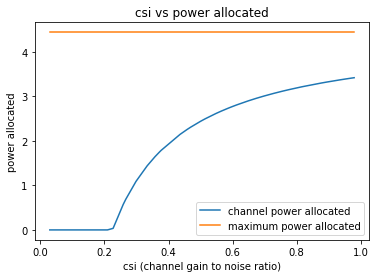

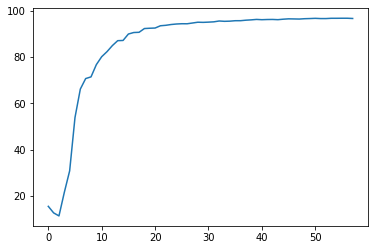

58
Power Allocated= 2.215010841666662
CSI= 0.48321333683503487
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.315033


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.375713

Power Allocated= 3.242773464347019
CSI= 0.9599539087029084
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.013718382918456
CSI= 0.7869233715362862
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.396879
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.171955

Power Allocated= 3.0877885536299745
CSI= 0.8356302077719278
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.236722
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.177094

Power Allocated= 0
CSI= 0.03430818228592081
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4988409810072878
CSI= 0.2641554873424927
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.746547


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.917298

Power Allocated= 3.2756649573758105
CSI= 0.9912520143235204
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.521359
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.176385

Power Allocated= 3.080431642475295
CSI= 0.8305244282932589
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.470256
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.411985

Power Allocated= 2.7009516060096184
CSI= 0.6314971028191748
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.368523
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224000

Power Allocated= 3.1066197224923777
CSI= 0.8489898212229432
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.352721
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.406802

Power Allocated= 2.3838349938992525
CSI= 0.5261343695444773
SNR= 18.23750

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1185, Accuracy: 9657/10000 (97%)

Power in training Round= 98.00223137135806



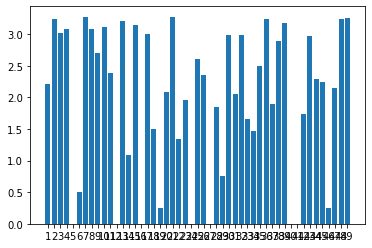

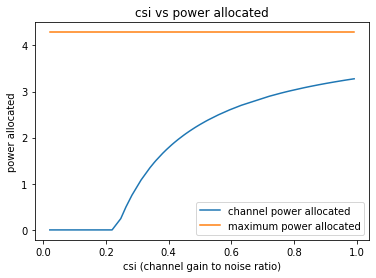

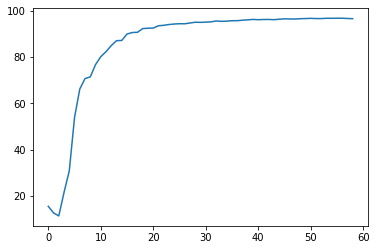

59
Power Allocated= 3.3055648710257683
CSI= 0.8360499765333463
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.221504


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337115

Power Allocated= 2.875094826014789
CSI= 0.614790334356072
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.133168788359784
CSI= 0.7307287672130819
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.237524053902342
CSI= 0.4416684966246368
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.617882
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034671

Power Allocated= 0
CSI= 0.09880740381831443
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2421054322949927
CSI= 0.44256400298091514
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.408892


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.584106

Power Allocated= 0
CSI= 0.020250644716467314
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3373935043884213
CSI= 0.31602844655566165
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.386199
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.132698

Power Allocated= 1.9435700691325035
CSI= 0.39091581278725307
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.698106
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.529589

Power Allocated= 3.4425790106331506
CSI= 0.9442098452285944
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.198462717746363
CSI= 0.7673402208715231
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.287051
Model client11 Train Epoch: 2 [0/1216 (0%)

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1254, Accuracy: 9677/10000 (97%)

Power in training Round= 97.9947462155526



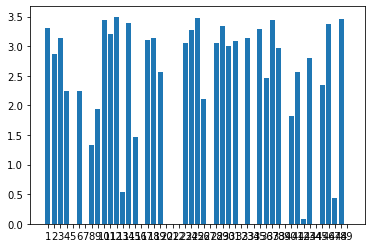

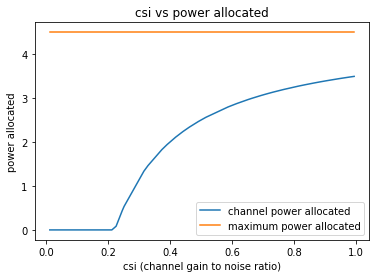

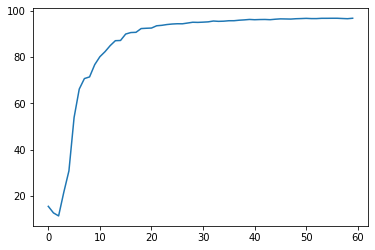

60
Power Allocated= 3.6403745549729836
CSI= 0.8855415730752744
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.354020


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.236726

Power Allocated= 1.8349035373100495
CSI= 0.34074760622080225
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.288364
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142270

Power Allocated= 1.5031288638620945
CSI= 0.30613824152947644
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.374607
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.270780

Power Allocated= 0.17294165543449935
CSI= 0.2175480638200632
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.641239
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200251

Power Allocated= 0.6617133429158732
CSI= 0.24343257424195552
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.414831
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.139099

Power Allocated= 0.14469059001468398
CSI= 0.2162191883463357
SNR= 17.049

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.165071

Power Allocated= 0
CSI= 0.08324965495370318
SNR= 18.866727777656166
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2720855382987604
CSI= 0.6677611374683023
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.355090
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.285743

Power Allocated= 1.1453193706404354
CSI= 0.27591476719974195
SNR= 19.038283273448883
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.551107
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.357000

Power Allocated= 3.679965922671489
CSI= 0.9177165330452768
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.377755
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.370146

Power Allocated= 3.491064314467631
CSI= 0.782128244044985
SNR= 19.30637432921484
Client: client18
Model client18 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1114, Accuracy: 9675/10000 (97%)

Power in training Round= 97.99205299251643



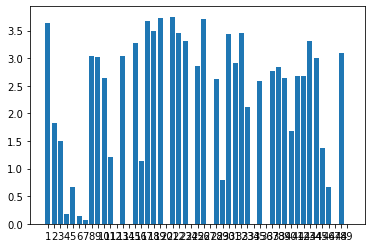

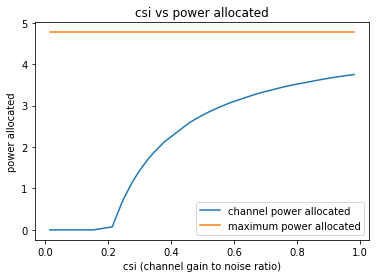

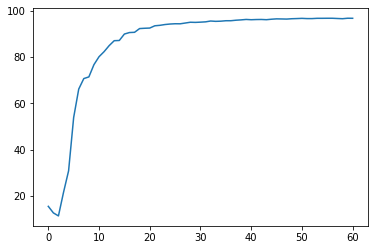

61
Power Allocated= 2.0187741942155326
CSI= 0.37813832739173336
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19724898614960884
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7677615323400278
CSI= 0.25670332262827
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.666804


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.556556

Power Allocated= 3.642583180334986
CSI= 0.9796949369909316
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.339414
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.144709

Power Allocated= 0
CSI= 0.016143047774473396
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.572497336881028
CSI= 0.9167484696834681
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.885095572936355
CSI= 0.5623621650083682
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8637767809627306
CSI= 0.35720252231771277
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.191975
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.731932

Power Allocated= 3.55813261627394
CSI= 0.904832

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1856, Accuracy: 9693/10000 (97%)

Power in training Round= 97.99845251347858



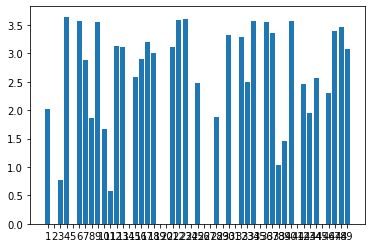

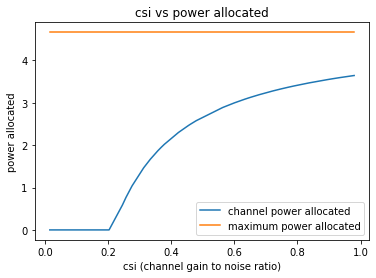

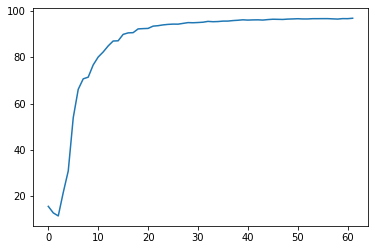

62
Power Allocated= 2.646284553539446
CSI= 0.7061578941729958
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.305530


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.367232

Power Allocated= 0
CSI= 0.23922742160525712
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.700338439177747
CSI= 0.7341820473160742
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.392366


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.355535

Power Allocated= 0
CSI= 0.03461839364746866
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6041098336400759
CSI= 0.2891603662428712
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.534749
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.131635

Power Allocated= 3.017934936288079
CSI= 0.9574293370790841
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.327421
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.350861

Power Allocated= 2.403394670313991
CSI= 0.6027713850014146
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.381531
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.367929

Power Allocated= 2.3736443759028445
CSI= 0.5921525349585135
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1086, Accuracy: 9690/10000 (97%)

Power in training Round= 97.99625111977548



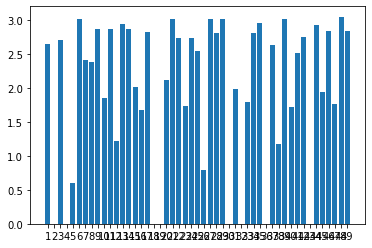

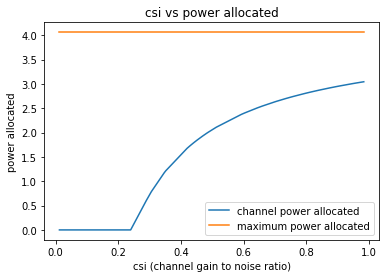

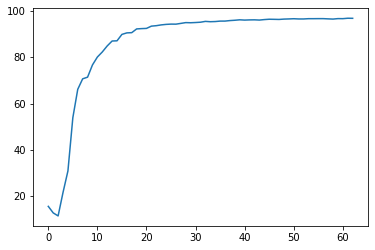

63
Power Allocated= 3.3502254434591006
CSI= 0.7381319838106484
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.375927


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159524

Power Allocated= 3.4956069763769477
CSI= 0.8268633138600024
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.232839
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.321505

Power Allocated= 2.0130213162869914
CSI= 0.3714744212129981
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.352215
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.163502

Power Allocated= 3.477948805640684
CSI= 0.8149641096305377
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.247128
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058262

Power Allocated= 3.510586522124073
CSI= 0.837233316559728
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.150110
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.199643

Power Allocated= 0
CSI= 0.009072075761601184
SNR= 17.04968172980935
Client: cli

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.282811

Power Allocated= 2.198028444408621
CSI= 0.3988881770544286
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.190616
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.118270

Power Allocated= 2.796250898557542
CSI= 0.5239042285450054
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.391730
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157571

Power Allocated= 2.155108687796043
CSI= 0.3921740847691153
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.126150
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052247

Power Allocated= 2.767583269519128
CSI= 0.5161520927391505
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.487125
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.129084

Power Allocated= 3.586228506712034
CSI= 0.893840207638318
SNR= 18.595302

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1235, Accuracy: 9685/10000 (97%)

Power in training Round= 98.00827492686773



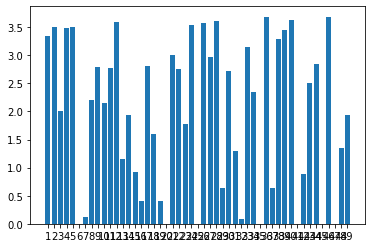

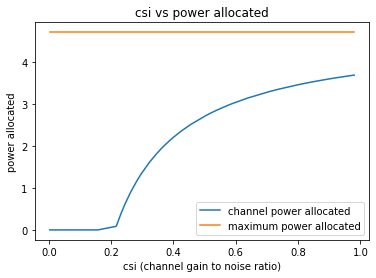

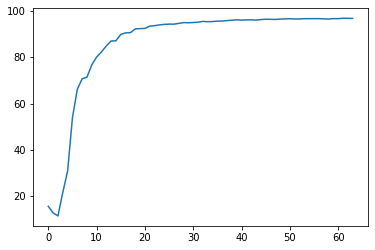

64
Power Allocated= 0
CSI= 0.2154452351547631
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.053320587222685845
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3695698593238546
CSI= 0.9676898716002418
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1208300781695333
CSI= 0.30468031217409874
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.299305


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157446

Power Allocated= 3.2704811132126497
CSI= 0.8830196144197078
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.226561
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.255177

Power Allocated= 1.3655192065282926
CSI= 0.3292246555286811
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.498677
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.231497

Power Allocated= 3.371730104409427
CSI= 0.9697170139035218
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.128261
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058891

Power Allocated= 3.2730109921116175
CSI= 0.884996637338305
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.203480
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.141650

Power Allocated= 0
CSI= 0.2210284439925888
SNR= 18.17035793859231
Client: cli

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1015, Accuracy: 9714/10000 (97%)

Power in training Round= 97.99294769220467



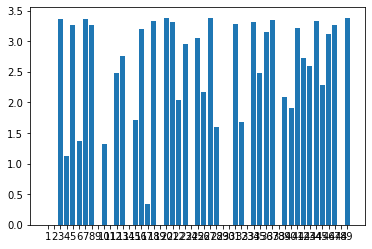

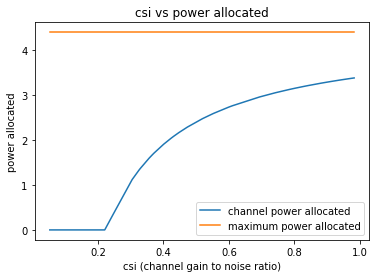

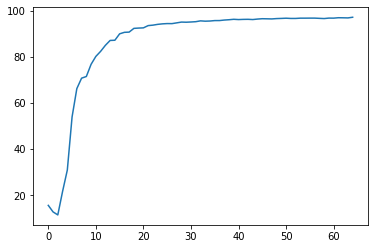

65
Power Allocated= 3.1570092623150527
CSI= 0.8041012839019526
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.229305


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174123

Power Allocated= 2.0549796884506666
CSI= 0.42632033488560184
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.188587671284595
CSI= 0.8250511808346396
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.281745
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264602

Power Allocated= 2.7438021945341218
CSI= 0.6035616790126133
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.377750
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.232142

Power Allocated= 1.2666068166590554
CSI= 0.31907831043404666
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.317613
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.562330

Power Allocated= 2.7045997348915947
CSI= 0.5896108366520961
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.187527

Power Allocated= 2.732391886336062
CSI= 0.5994334856333451
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.124851
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.254777

Power Allocated= 2.8523388294946166
CSI= 0.6458718069147249
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.129756
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.043417

Power Allocated= 2.8998240009139957
CSI= 0.6663069984408294
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7348392874468797
CSI= 0.3751227021005925
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.105331
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188990

Power Allocated= 1.5690751881141058
CSI= 0.3531624011624085
SNR= 18.866727777656166
Client: client14
Model client14 Train

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1065, Accuracy: 9705/10000 (97%)

Power in training Round= 97.99863929341468



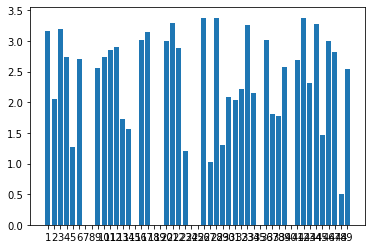

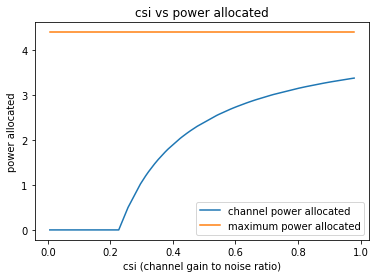

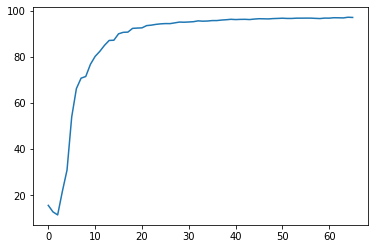

66
Power Allocated= 2.608445985540012
CSI= 0.6308632999393111
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.192721


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.222876

Power Allocated= 0.09119136510774783
CSI= 0.24376069650078136
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.255622
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.220286

Power Allocated= 2.9948752107154073
CSI= 0.83423692892404
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.346900
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046700

Power Allocated= 0
CSI= 0.0030958099716082987
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.732407738452051
CSI= 0.684384138304298
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.964129624458668
CSI= 0.8133745996680286
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.358791


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.241605

Power Allocated= 2.560887049201172
CSI= 0.6124867452673421
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.275731
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.309162

Power Allocated= 3.104351777194581
CSI= 0.9180850838294975
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.204129
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.213601

Power Allocated= 3.1475038949473086
CSI= 0.9559575560710452
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.172051
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124889

Power Allocated= 2.9785488158638205
CSI= 0.8230272309604957
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235779
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.314440

Power Allocated= 1.2784017332394133
CSI= 0.34303273141145696
SNR= 18.23750

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1038, Accuracy: 9702/10000 (97%)

Power in training Round= 98.00146258136597



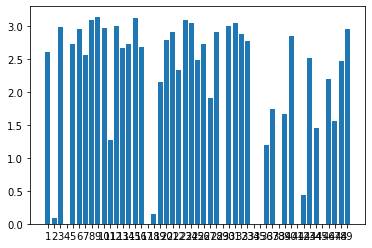

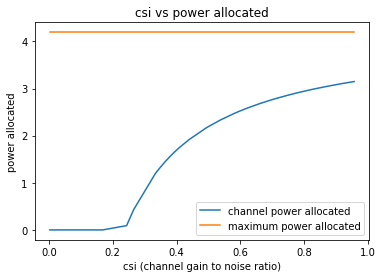

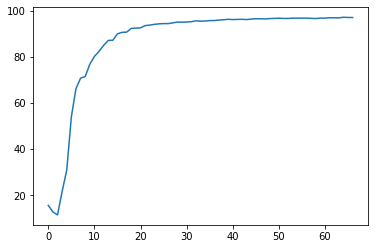

67
Power Allocated= 0
CSI= 0.054539965815515346
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1725187100436183
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.052954799049743
CSI= 0.9887656206832806
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.293093


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114872

Power Allocated= 0
CSI= 0.04067061106389103
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9179864717346864
CSI= 0.8723488812102037
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.092635
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.178574

Power Allocated= 0
CSI= 0.034059398142750386
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05906990043405391
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.280101536441388
CSI= 0.2642555785283557
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.132249
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195595

Power Allocated= 1.170905806689328
CSI= 0.25684419025912986
SNR= 18.1703579385

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1808, Accuracy: 9691/10000 (97%)

Power in training Round= 97.99626613318948



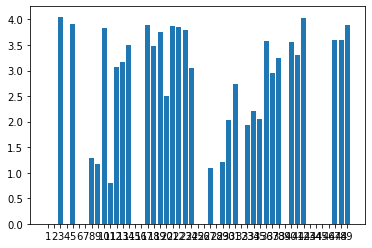

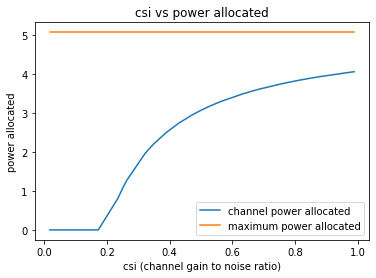

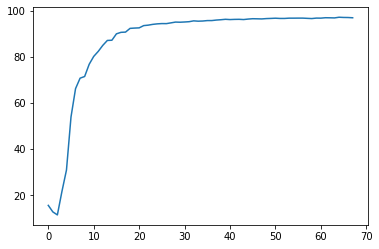

68
Power Allocated= 0
CSI= 0.043061682132895074
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2152962338751615
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5231741975786508
CSI= 0.26783843740633984
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.552564


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.338823

Power Allocated= 2.692881344752915
CSI= 0.6394324226823348
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.651953
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.334048

Power Allocated= 3.1872591340749077
CSI= 0.9350083831202349
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.286249
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.220475

Power Allocated= 3.2299256682435336
CSI= 0.9738590963521677
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.542117
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.263409

Power Allocated= 1.2552758412005764
CSI= 0.3331675913038459
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.420473
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.361434

Power Allocated= 2.617175125455919
CSI= 0.6099074081211457
SNR= 18.0496503689

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1046, Accuracy: 9714/10000 (97%)

Power in training Round= 98.00417148672796



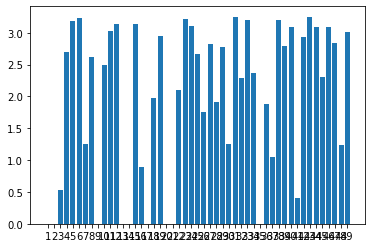

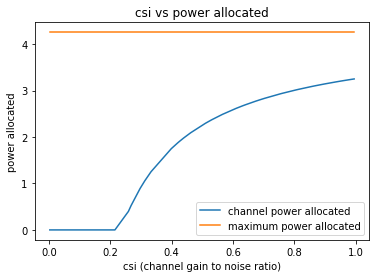

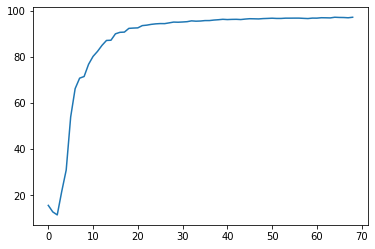

69
Power Allocated= 2.9387291125089736
CSI= 0.6752353835822225
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.044430102169998875
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0228039654347905
CSI= 0.4172072644171706
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.216320


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195394

Power Allocated= 3.1831845507272414
CSI= 0.80872804771901
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.241161
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.164692

Power Allocated= 0.7691221971463755
CSI= 0.27392967758262443
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.195673
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.064327

Power Allocated= 2.2708089417922785
CSI= 0.4653575690531576
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.524584
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.330262

Power Allocated= 2.3825733101337083
CSI= 0.4908888942241366
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.330584
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.351094

Power Allocated= 0
CSI= 0.20178906257707907
SNR= 18.049650368948967
Client: c

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0982, Accuracy: 9714/10000 (97%)

Power in training Round= 97.99962245212876



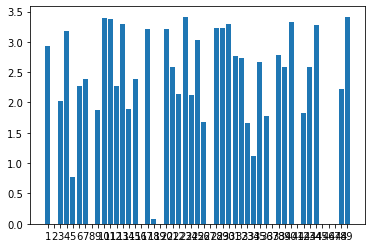

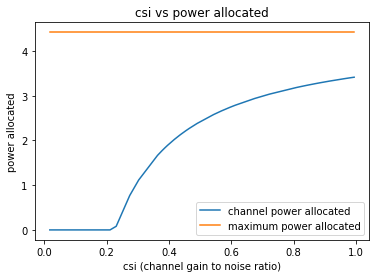

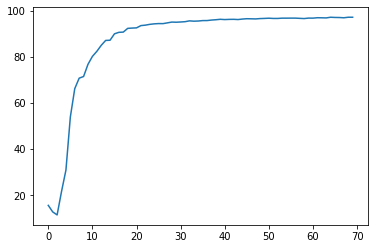

70
Power Allocated= 3.808072372070293
CSI= 0.9173918456510114
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.253556


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.303801

Power Allocated= 2.9722469467674877
CSI= 0.5192452607845776
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08635940565039701
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3569595769356697
CSI= 0.6488620876635246
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6841718985249234
CSI= 0.8237590403027343
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.00463700451872473
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8064294732496555
CSI= 0.9160112500003592
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.192583

Power Allocated= 3.300738324802511
CSI= 0.6260248035993221
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.285563
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.354342

Power Allocated= 3.530700000825406
CSI= 0.7313046777880404
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.358970
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.421406

Power Allocated= 0
CSI= 0.12855124215595448
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.235904297832997
CSI= 0.6016069555548019
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.172285
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.310292

Power Allocated= 3.6346987504714825
CSI= 0.7915021969975637
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1642, Accuracy: 9724/10000 (97%)

Power in training Round= 98.0019808924145



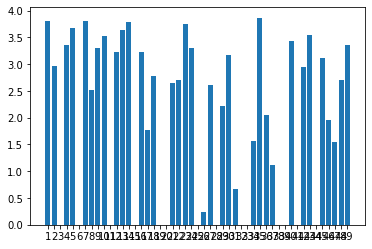

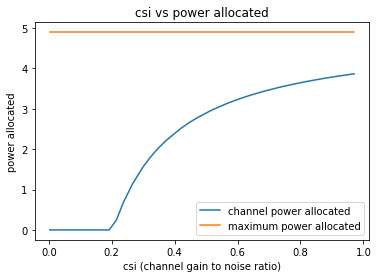

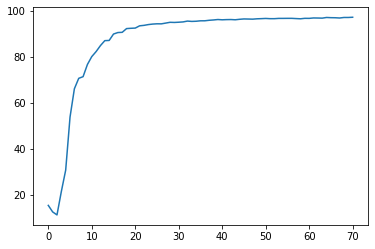

71
Power Allocated= 3.0659924569874857
CSI= 0.7794425813921281
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.365371


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.145606

Power Allocated= 3.081624758277682
CSI= 0.7890568295533626
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3606220640752262
CSI= 0.5029324648334282
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.242851
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157085

Power Allocated= 0.15762285414371835
CSI= 0.23858731054690707
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.340788
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.163065

Power Allocated= 2.8015888363312245
CSI= 0.6462571080215324
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.557345
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.192316

Power Allocated= 3.206956865718663
CSI= 0.8756538804271967
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092147

Power Allocated= 1.112144740885686
CSI= 0.3089455946877878
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.418405
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.287538

Power Allocated= 3.0469856871775023
CSI= 0.7680639552782722
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.590615
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182174

Power Allocated= 0
CSI= 0.0636961792904478
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1477900758203554
CSI= 0.8325212625413899
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.374611
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.144089

Power Allocated= 3.2390494383060853
CSI= 0.9009730111189264
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1005, Accuracy: 9723/10000 (97%)

Power in training Round= 98.00084891736029



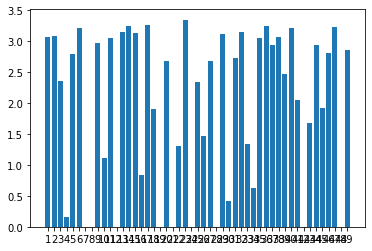

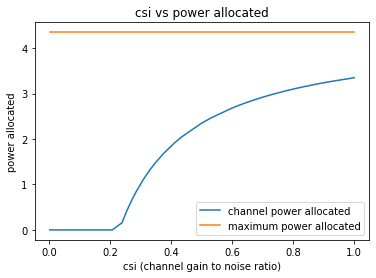

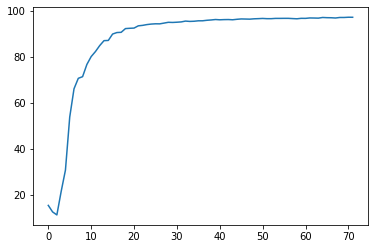

72
Power Allocated= 2.368609090745944
CSI= 0.5488008939163157
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.255733


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069311

Power Allocated= 3.0862187668225127
CSI= 0.9053503386948729
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8427400566499008
CSI= 0.4258901155799967
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.304973
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.211609

Power Allocated= 2.4547778501873463
CSI= 0.5760416091020664
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.314050
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.135405

Power Allocated= 1.1313399225390568
CSI= 0.32685895104447915
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.332233
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055741

Power Allocated= 0.3011487865225799
CSI= 0.25709486902381873
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182337

Power Allocated= 2.8166505854153874
CSI= 0.727742202126998
SNR= 20.497019615829455
Client: client22
Model client22 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.317973
Model client22 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.276631

Power Allocated= 1.3772485215787316
CSI= 0.3554272813073548
SNR= 20.604825091330564
Client: client23
Model client23 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.305312
Model client23 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.219196

Power Allocated= 1.8647340685309728
CSI= 0.42991716352072473
SNR= 20.79815877075119
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.268504
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.170051

Power Allocated= 0
CSI= 0.21326142387898683
SNR= 20.820926259668504
Client: client25
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.622568664517159
CSI= 0.6376758429176299
SNR= 20.933480720216465
Client: client26
Model client26 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1027, Accuracy: 9708/10000 (97%)

Power in training Round= 98.00332355193041



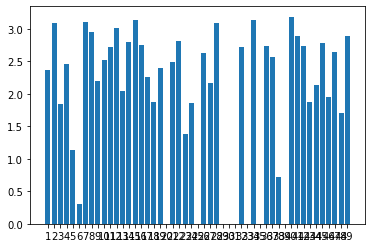

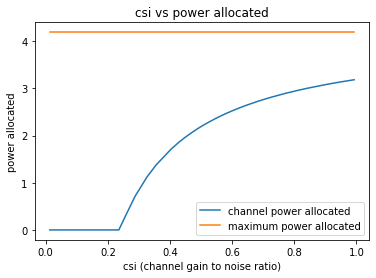

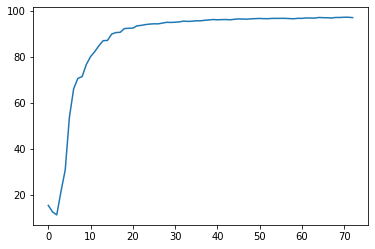

73
Power Allocated= 2.1821943699338884
CSI= 0.4766683575740741
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.383671


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.289358

Power Allocated= 0
CSI= 0.15562895873724836
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21066743823778566
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1339917651646712
CSI= 0.3178541275553166
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.207835


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.377763

Power Allocated= 2.606568806103956
CSI= 0.5975428251177307
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7776377981947453
CSI= 0.6655790095490564
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.401313
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.172236

Power Allocated= 2.2344010331569693
CSI= 0.48883309848365064
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.380722
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.186699

Power Allocated= 2.9877576436356525
CSI= 0.7737953389980059
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.253553
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053547

Power Allocated= 1.5986858231511176
CSI= 0.3729390637680554
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0980, Accuracy: 9726/10000 (97%)

Power in training Round= 98.00129639694167



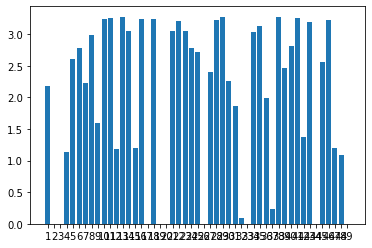

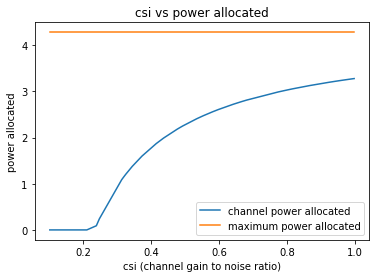

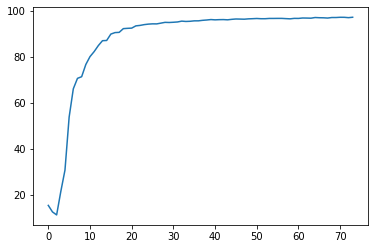

74
Power Allocated= 0.9491881644967797
CSI= 0.2747833516681787
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.545144


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105332

Power Allocated= 0
CSI= 0.19205473218810565
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5128030312522713
CSI= 0.48178473115475606
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.788999


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.278017

Power Allocated= 0.5040092002323115
CSI= 0.24483342525161056
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.448717
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.240990

Power Allocated= 2.3287525978527754
CSI= 0.4425432328845259
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.272695
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.230745

Power Allocated= 3.5105145910272038
CSI= 0.9277261959231836
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.291478739089632
CSI= 0.7710456376024902
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.209012
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.271222

Power Allocated= 2.3772548060387826
CSI= 0.45225048380377875
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0971, Accuracy: 9731/10000 (97%)

Power in training Round= 98.00245622309171



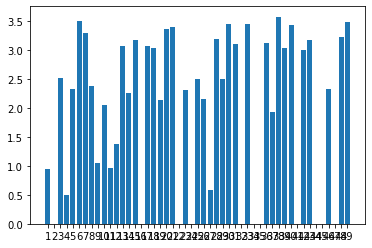

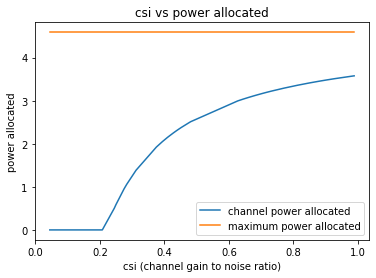

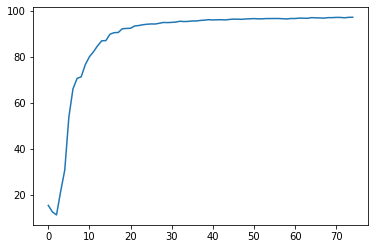

75
Power Allocated= 3.513370882098651
CSI= 0.8495739030384081
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1353393407117216
CSI= 0.28128665858800206
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.260243


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.316059

Power Allocated= 1.9389740019636834
CSI= 0.363443736112146
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.233862
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195515

Power Allocated= 3.591837916313664
CSI= 0.9102547083083469
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263484
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.180080

Power Allocated= 0
CSI= 0.16123463271539473
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.014713996832369958
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7486562645645107
CSI= 0.25369279963313995
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.236810


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.377975

Power Allocated= 3.601239628343788
CSI= 0.9181118661787774
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.391921
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.281579

Power Allocated= 1.9028956779681923
CSI= 0.35873978193538514
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.364365
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.212402

Power Allocated= 3.6869853990386003
CSI= 0.9965657143013338
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.233743
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.133685

Power Allocated= 1.4760832308370504
CSI= 0.31110505462794424
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.445280
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.518040

Power Allocated= 3.2953914163598643
CSI= 0.7168252709048178
SNR= 18

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1801, Accuracy: 9722/10000 (97%)

Power in training Round= 97.99242874625631



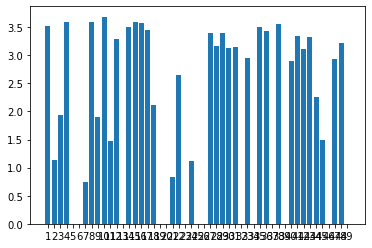

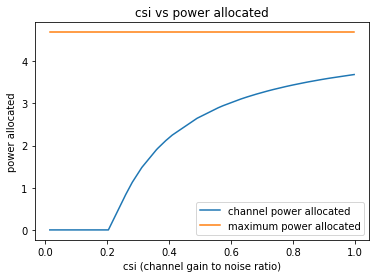

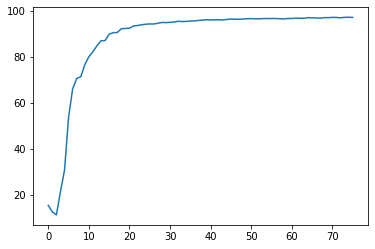

76
Power Allocated= 3.1699527171209683
CSI= 0.9253573261947686
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1586892637845163
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6951444713384896
CSI= 0.6428917298682787
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.778738


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.452853

Power Allocated= 2.0880240760018074
CSI= 0.4624080169614033
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.501500
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116386

Power Allocated= 2.622496087333737
CSI= 0.6142052460495638
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.442570
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.230111

Power Allocated= 2.9809376841720354
CSI= 0.7876008594035575
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.355320855737405
CSI= 0.527622214391364
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.348310
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.213782

Power Allocated= 3.0363529468802923
CSI= 0.8235445507007317
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1067, Accuracy: 9724/10000 (97%)

Power in training Round= 97.9969425355843



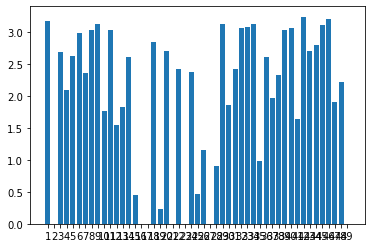

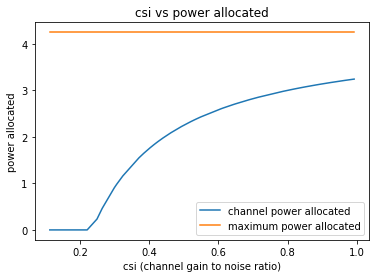

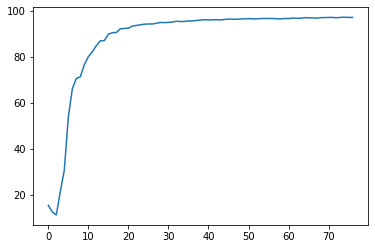

77
Power Allocated= 2.738450369549859
CSI= 0.4892486638304758
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.171416


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.101236

Power Allocated= 3.707508133600136
CSI= 0.9303254768116374
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.188892
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249174

Power Allocated= 3.7736188587285646
CSI= 0.9912945440439686
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1929389133529239
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.496926068854546
CSI= 0.4375458637130535
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263126


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.211921

Power Allocated= 3.5855419550042753
CSI= 0.8355204402509714
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.146620585998761
CSI= 0.6113290848760664
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.280906
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.236008

Power Allocated= 3.5993197077365306
CSI= 0.8452506222668639
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.322507
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264924

Power Allocated= 2.9991626208762763
CSI= 0.5607775961903037
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.215474
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119651

Power Allocated= 0
CSI= 0.09075911068871745
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in t

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1428, Accuracy: 9720/10000 (97%)

Power in training Round= 98.00361406978995



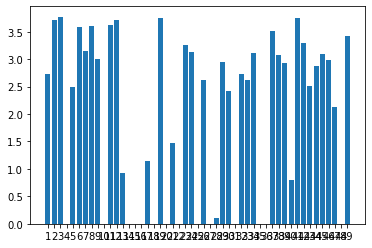

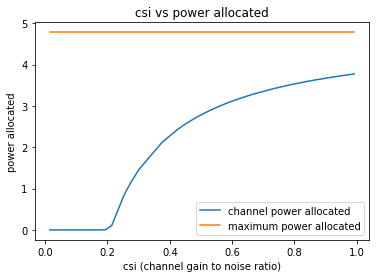

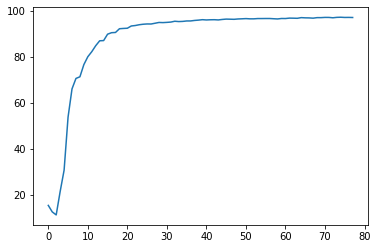

78
Power Allocated= 2.5884705233812095
CSI= 0.620560865053555
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8926658017765083
CSI= 0.7649645034083767
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.191398665228296
CSI= 0.991554595896099
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.381690


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159114

Power Allocated= 0
CSI= 0.20496599516263903
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8859959033966511
CSI= 0.43216704014183416
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.440361


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.412992

Power Allocated= 3.0763290494176254
CSI= 0.8900067751642132
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.583263
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.202353

Power Allocated= 2.985102720357918
CSI= 0.8231717708184345
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.358339
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175595

Power Allocated= 2.5979647360489286
CSI= 0.6242387152806401
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.259989
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.301105

Power Allocated= 1.9679389885836849
CSI= 0.4480332880366711
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.730784
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200016

Power Allocated= 0
CSI= 0.09712316957720346
SNR= 18.187820388691026
Client: c

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1148, Accuracy: 9723/10000 (97%)

Power in training Round= 98.00650362871824



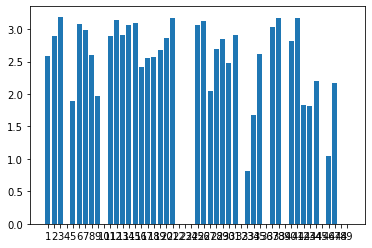

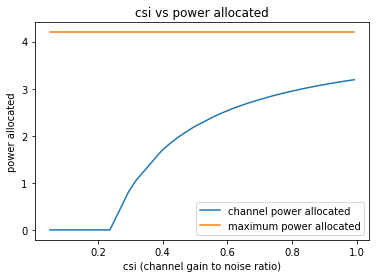

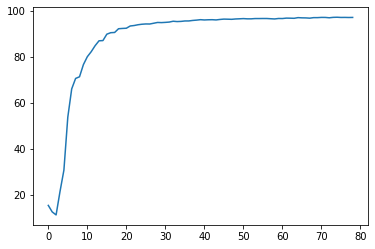

79
Power Allocated= 2.1252528711360292
CSI= 0.4588154765065928
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.285391


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.307793

Power Allocated= 0
CSI= 0.06238612032011326
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1727912510769407
CSI= 0.3192861219183385
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.335945


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143915

Power Allocated= 3.105773680894689
CSI= 0.8340251411864125
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.332785
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111425

Power Allocated= 2.8320102981981075
CSI= 0.6789935659359618
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11663652764939902
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.000583354256266766
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.255513363410551
CSI= 0.4879798508398232
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.509221
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119862

Power Allocated= 2.428511129484144
CSI= 0.5329731360363714
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0971, Accuracy: 9715/10000 (97%)

Power in training Round= 97.99861439034346



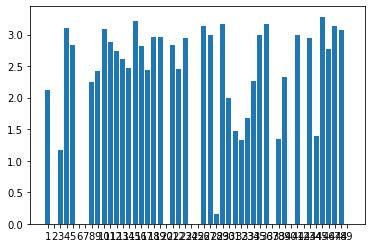

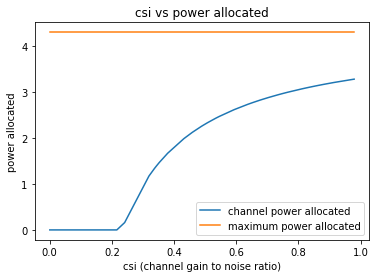

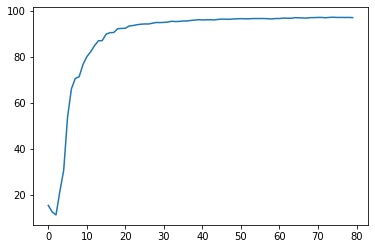

80
Power Allocated= 2.6747431213098913
CSI= 0.6105631023567961
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.302403355515344
CSI= 0.989930315429176
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.534793044199266
CSI= 0.5624985293178152
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.275446


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.247991

Power Allocated= 2.8781300843254636
CSI= 0.6971335471793844
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.209108
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.102113

Power Allocated= 2.931441841492751
CSI= 0.7240429016483297
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.143377
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094959

Power Allocated= 1.0800080669223386
CSI= 0.3093516314697432
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.223438
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.311875

Power Allocated= 2.6362369475013336
CSI= 0.5965382209716201
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.353000
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.173294

Power Allocated= 2.422526277721823
CSI= 0.5290867581901375
SNR= 18.0496503689

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053986

Power Allocated= 2.8432608256228953
CSI= 0.6805894188684842
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.257402
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.192524

Power Allocated= 2.359262083811982
CSI= 0.5119506204353181
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.342288
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.292846

Power Allocated= 0
CSI= 0.0713493210650199
SNR= 18.799405815022368
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3085128749148627
CSI= 0.3328825443292637
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.559023
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.335955

Power Allocated= 2.966800115481961
CSI= 0.7430660671485175
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0992, Accuracy: 9709/10000 (97%)

Power in training Round= 97.99315617230309



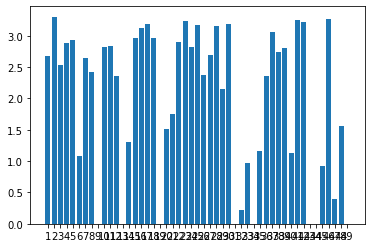

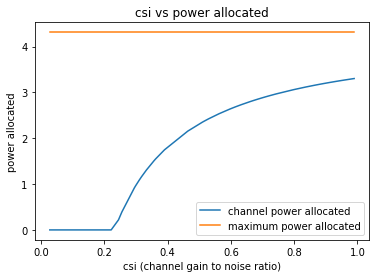

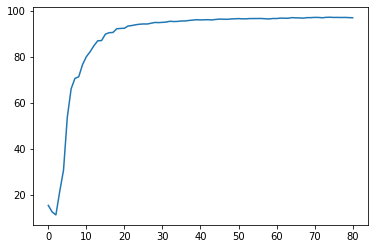

81
Power Allocated= 3.1110773678097416
CSI= 0.6453179978395348
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7722668243333062
CSI= 0.2571729294327856
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.590483


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.516109

Power Allocated= 3.6051921024382465
CSI= 0.9474103262189316
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.213908
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091931

Power Allocated= 2.480301579913973
CSI= 0.45863157218353634
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1583128759334396
CSI= 0.2855194722303771
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.139624
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.207524

Power Allocated= 2.5983509991254423
CSI= 0.48488375610381196
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.084122
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.272116

Power Allocated= 0.4706691074789573
CSI= 0.2386616696359144
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client25 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.163399

Power Allocated= 0
CSI= 0.05426599658338449
SNR= 20.933480720216465
Client: client26
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0011421446159448
CSI= 0.27325698202210436
SNR= 21.048123653483067
Client: client27
Model client27 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.604084
Model client27 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.237387

Power Allocated= 3.5530763161082115
CSI= 0.9028329199828131
SNR= 21.393107502467828
Client: client28
Model client28 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.259587
Model client28 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.123330

Power Allocated= 0
CSI= 0.18031126530999075
SNR= 21.42063444395058
Client: client29
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.442856617065127
CSI= 0.8211229933129766
SNR= 21.625630319019518
Client: client30
Model client30 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.086993
Model client30 Train Epoch: 2 [0/1216 (0%)]	Loss: 0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0959, Accuracy: 9716/10000 (97%)

Power in training Round= 97.99986877714723



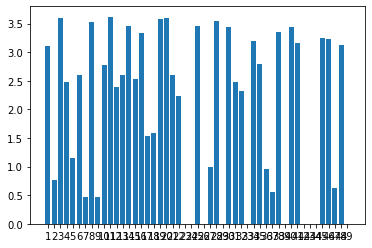

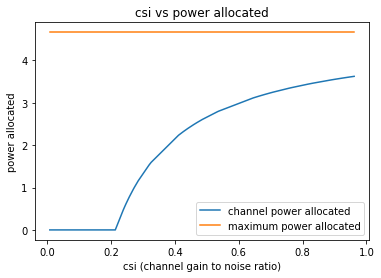

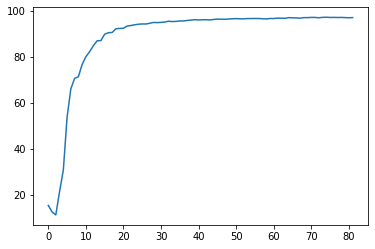

82
Power Allocated= 3.383814427662228
CSI= 0.9872159931401223
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.21432318479156154
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0721410012963366
CSI= 0.7549317917523977
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3279986012265566
CSI= 0.3258639472276963
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.191950


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.151033

Power Allocated= 1.4900823273560349
CSI= 0.34403492329547825
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.142985
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.165594

Power Allocated= 0
CSI= 0.005724932673531802
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6017560640686357
CSI= 0.557100606728277
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8538745534743217
CSI= 0.648134585472916
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.413727
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.123442

Power Allocated= 0
CSI= 0.028302573252640517
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3173575858257154
CSI= 0.926435125651517
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1281, Accuracy: 9730/10000 (97%)

Power in training Round= 97.99514073047592



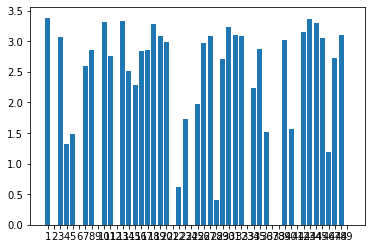

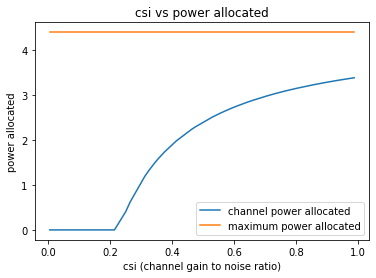

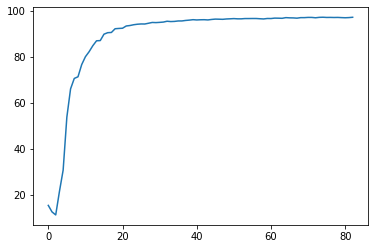

83
Power Allocated= 3.1710628876318827
CSI= 0.8975358222918224
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16566212278703774
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.053357085125345
CSI= 0.8117756430382633
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.284249


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.163394

Power Allocated= 1.5607117039372662
CSI= 0.3670380938004866
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.251299
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.128897

Power Allocated= 1.2893703024255756
CSI= 0.33379461040960745
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.314351
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189083

Power Allocated= 3.0611946739602027
CSI= 0.8169735257556976
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.353906
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.298267

Power Allocated= 2.5731661197830693
CSI= 0.5840922160267421
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.0560714590517053
CSI= 0.23645396122956774
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0978, Accuracy: 9721/10000 (97%)

Power in training Round= 98.00462447835642



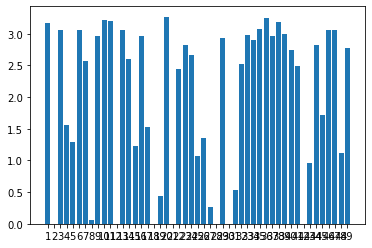

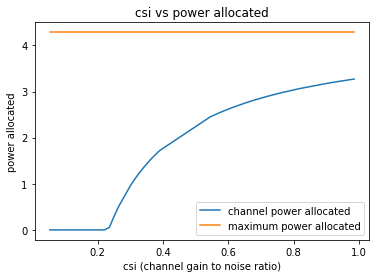

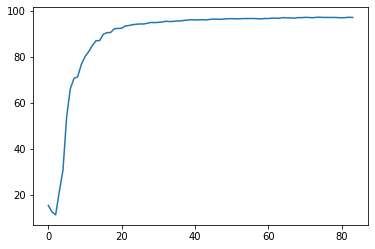

84
Power Allocated= 0
CSI= 0.1188166879281034
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.060882315389626
CSI= 0.7459757580668154
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.237305


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.248555

Power Allocated= 3.240994685517893
CSI= 0.8617615802231234
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.520325978850295
CSI= 0.5316088023584693
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.171956
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143610

Power Allocated= 3.1181960944033227
CSI= 0.7792942415878523
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.144277
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.207796

Power Allocated= 1.8933680516487144
CSI= 0.3987176603600233
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.275731
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.276397

Power Allocated= 3.0272278997585627
CSI= 0.7277064133323161
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0952, Accuracy: 9722/10000 (97%)

Power in training Round= 98.00665645741144



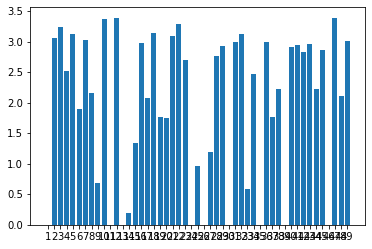

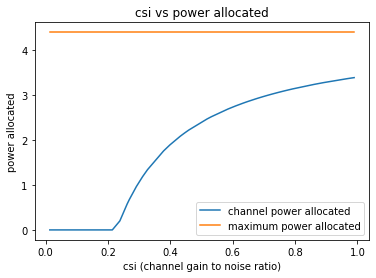

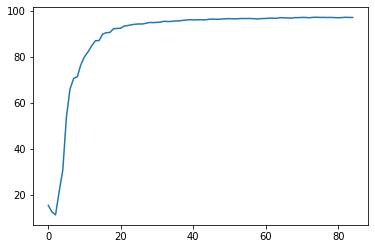

85
Power Allocated= 3.2714577099660005
CSI= 0.7806203186085525
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.13907146267864
CSI= 0.7075044111142145
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.255411779557277
CSI= 0.4353355922953177
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0912632578703994
CSI= 0.6843563876738444
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6849086216675566
CSI= 0.3487259101258924
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.231225


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.216342

Power Allocated= 2.6710551335826382
CSI= 0.5315091715858494
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.184393
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109924

Power Allocated= 0
CSI= 0.0913120527018173
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.321166729938048
CSI= 0.8121342721463375
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.401316


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.141489

Power Allocated= 3.4807193105393246
CSI= 0.9330352209604791
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.168102
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195092

Power Allocated= 0
CSI= 0.06781074164073098
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.054070751854199
CSI= 0.6673698697192388
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.202446
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089027

Power Allocated= 3.5092364509838987
CSI= 0.9585395588563854
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.260260
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071447

Power Allocated= 0
CSI= 0.05489410607907219
SNR= 18.799405815022368
Client: client13
Poor Channel, client not taken for averaging in this rou

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1322, Accuracy: 9739/10000 (97%)

Power in training Round= 97.99905211934504



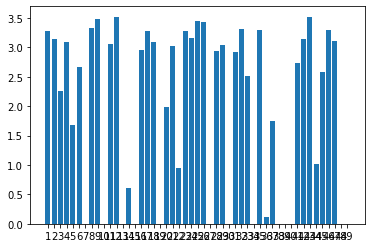

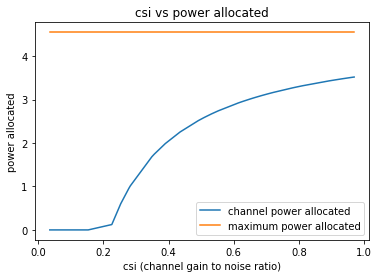

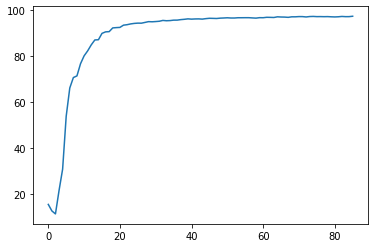

86
Power Allocated= 3.0230069483963353
CSI= 0.9566253604269277
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.354574


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143505

Power Allocated= 0
CSI= 0.1449192645811147
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.964848493189413
CSI= 0.9062077207310146
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1206043082727537
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3854980509861434
CSI= 0.5942299559539413
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.270025


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.278647

Power Allocated= 2.7038325633065936
CSI= 0.732860757339985
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.154449
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077328

Power Allocated= 3.0286615513234567
CSI= 0.9618282129467657
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.477553
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264253

Power Allocated= 2.9330464950309443
CSI= 0.8808230896192977
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.360888
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.178231

Power Allocated= 1.7220291283721152
CSI= 0.42619948434205457
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.257369
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249605

Power Allocated= 2.2569951397794528
CSI= 0.55207347149506
SNR= 18.1878203886

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0922, Accuracy: 9734/10000 (97%)

Power in training Round= 98.0047437673324



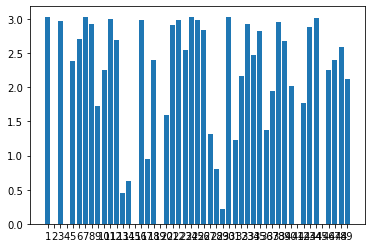

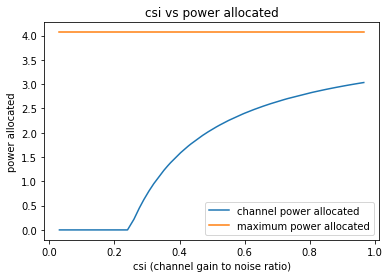

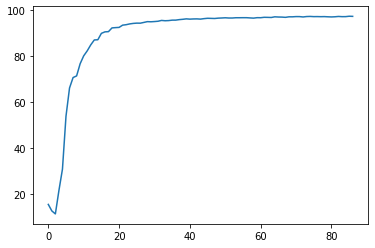

87
Power Allocated= 2.4338966733416814
CSI= 0.5316570543216832
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1912257531671373
CSI= 0.8900101677324681
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1329737021735269
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1576036163796823
CSI= 0.864151267524575
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.328426


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127475

Power Allocated= 0
CSI= 0.05046111527991237
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.119706306155871
CSI= 0.8367485809945894
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.279944
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.245197

Power Allocated= 2.6140437511592216
CSI= 0.5879708209177776
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.230696
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.234439

Power Allocated= 0
CSI= 0.20366326153178504
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.991820952098295
CSI= 0.3009340266567915
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.353660
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069284

Power A

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0929, Accuracy: 9734/10000 (97%)

Power in training Round= 98.00087891032197



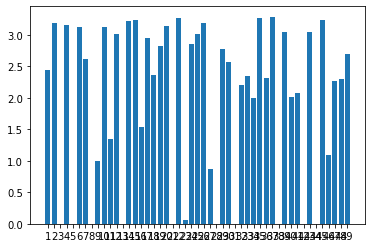

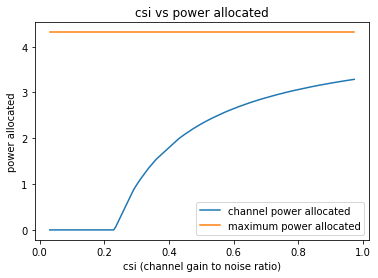

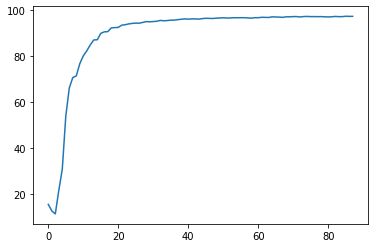

88
Power Allocated= 3.083189984331325
CSI= 0.9850560385222419
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263930


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078904

Power Allocated= 3.037678245074088
CSI= 0.9427892740993996
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.261539
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.382474

Power Allocated= 2.028643741638469
CSI= 0.48315786240505376
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.367096756098973
CSI= 0.5776126910567472
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.222371
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.154992

Power Allocated= 2.391027702824455
CSI= 0.585708838040879
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0887431132828365
CSI= 0.9904740735467484
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.387479
Model client6 Train Epoch: 2 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124117

Power Allocated= 0
CSI= 0.04507430170342708
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.348304544720146
CSI= 0.5714102500509458
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.169209
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.235107

Power Allocated= 2.8024692167110663
CSI= 0.7716695780865312
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.123585
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085132

Power Allocated= 2.7298137250377907
CSI= 0.7307020150841486
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.201383
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189360

Power Allocated= 2.1160439975819303
CSI= 0.50446027171567
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1004, Accuracy: 9750/10000 (98%)

Power in training Round= 98.00278256604282



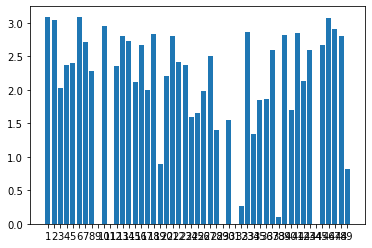

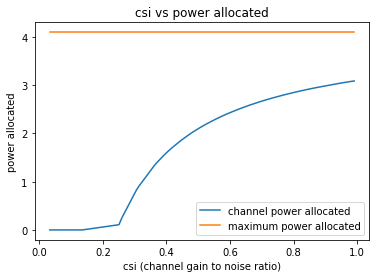

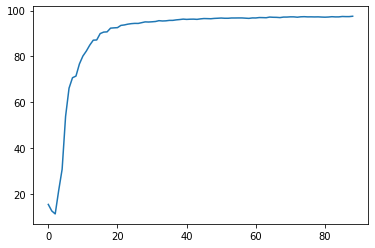

89
Power Allocated= 3.178303436767371
CSI= 0.7358884314777557
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.49781663560727907
CSI= 0.24756222714225484
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.902777


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.389962

Power Allocated= 0.49671512335496626
CSI= 0.2474947371028734
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.323159
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.291715

Power Allocated= 0
CSI= 0.053093773339748185
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.788764333443218
CSI= 0.3638426626606892
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.287099


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.081121

Power Allocated= 3.2461573554636436
CSI= 0.7745647040782583
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.273946
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040345

Power Allocated= 3.2648571076516353
CSI= 0.7859485144159941
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3816305483517377
CSI= 0.8653704033511377
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.323028
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116476

Power Allocated= 2.0634571251201126
CSI= 0.4042449018915639
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.212308
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024976

Power Allocated= 1.6626438282306086
CSI= 0.3478791759276231
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0899, Accuracy: 9754/10000 (98%)

Power in training Round= 97.99489525684172



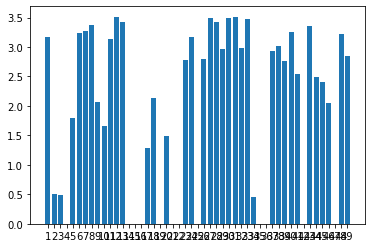

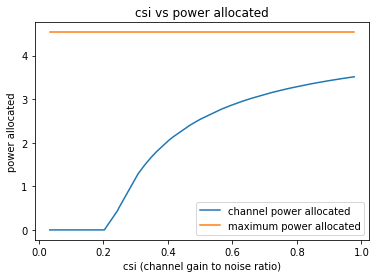

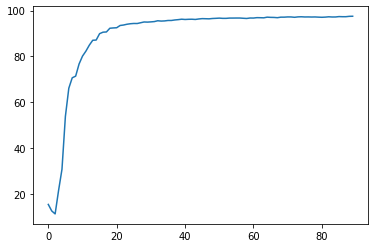

90
Power Allocated= 0
CSI= 0.12027216764293691
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0801197395609008
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4697293018011144
CSI= 0.30145450767279935
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.200563


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055334

Power Allocated= 3.728116805028181
CSI= 0.9444095859544416
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.179324
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109357

Power Allocated= 0
CSI= 0.12618752215959328
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.38748401731698134
CSI= 0.22729879438034728
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.131013
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.272075

Power Allocated= 1.340057249641836
CSI= 0.29011389052041847
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.125969
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.238734

Power Allocated= 2.7692018104795477
CSI= 0.49559475596796243
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0962, Accuracy: 9753/10000 (98%)

Power in training Round= 98.0057546139809



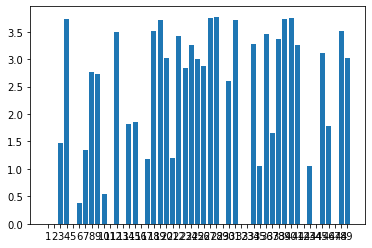

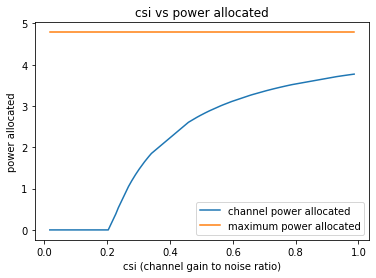

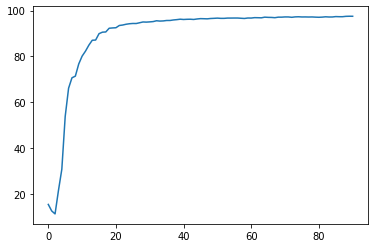

91
Power Allocated= 2.055143381289635
CSI= 0.3540061388237151
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6689408215349246
CSI= 0.45228151196520316
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7648767937460184
CSI= 0.8967995708941637
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4636302784641124
CSI= 0.7060536960655841
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.230596


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175735

Power Allocated= 3.817826509297448
CSI= 0.9415073112485008
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.288853
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.222161

Power Allocated= 2.530392881504329
CSI= 0.42561155479424717
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0948040797081586
CSI= 0.3590472085630707
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.315179
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.264993

Power Allocated= 0.1316719253219194
CSI= 0.2106025216633648
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.288187
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045917

Power Allocated= 2.7010017889610123
CSI= 0.45893635661456655
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.121212

Power Allocated= 2.380423405426942
CSI= 0.40007525463178895
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.276079
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.163473

Power Allocated= 0
CSI= 0.0963507222163924
SNR= 19.038283273448883
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.957052613804695
CSI= 0.5200476987252192
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.432100
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124161

Power Allocated= 2.5358763436316982
CSI= 0.42660718123144636
SNR= 19.30637432921484
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.400345
Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115123

Power Allocated= 1.2821281869972543
CSI= 0.2779457059757625
SNR= 19.748614351489568
Client: client19
Model client19 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1386, Accuracy: 9757/10000 (98%)

Power in training Round= 97.99612207004517



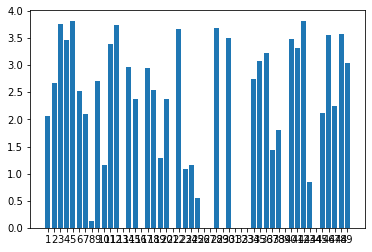

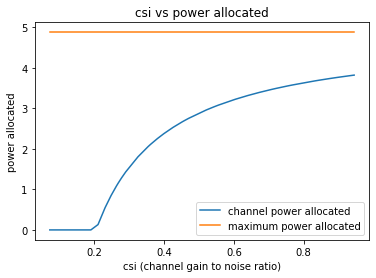

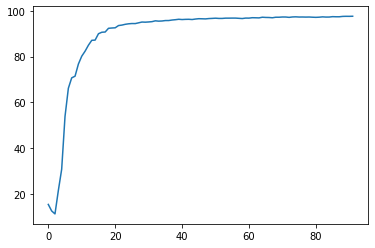

92
Power Allocated= 2.288513297280927
CSI= 0.4540839896966353
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.405697


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182031

Power Allocated= 2.6323238803352695
CSI= 0.5380899982345765
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.649965
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.351863

Power Allocated= 2.8482528420037263
CSI= 0.6088294091057683
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.213434
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.170332

Power Allocated= 2.1215692290995753
CSI= 0.4220869974695928
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.331980
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.303166

Power Allocated= 0.8889940534157112
CSI= 0.27764242682265927
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.354132
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.269125

Power Allocated= 0.7590670802439607
CSI= 0.2679756759134524
SNR= 17.0496817

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.256133

Power Allocated= 2.5817151885638907
CSI= 0.5238251749032672
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.501348
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200407

Power Allocated= 3.081634919146139
CSI= 0.7096657205947994
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.718466
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.365917

Power Allocated= 0
CSI= 0.18223735178293532
SNR= 18.866727777656166
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.329389195617244
CSI= 0.8610595503605221
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.446524
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224340

Power Allocated= 3.418354603811949
CSI= 0.93249270087161
SNR= 19.038283273448883
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0913, Accuracy: 9731/10000 (97%)

Power in training Round= 98.00088055295434



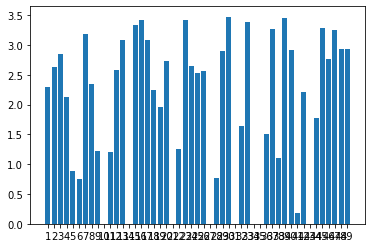

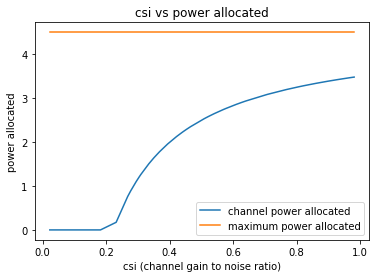

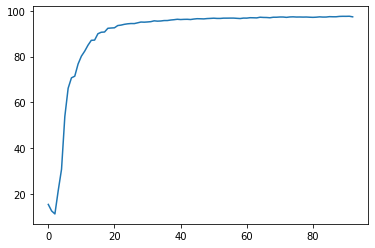

93
Power Allocated= 3.6692175076759996
CSI= 0.7922453137938892
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.05180287273999373
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0949258878646122
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2242996518621583
CSI= 0.5857705253790291
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220986


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200298

Power Allocated= 3.73783102136965
CSI= 0.8377863179769696
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.295315
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063551

Power Allocated= 0
CSI= 0.10812622440626829
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7922297564193435
CSI= 0.31855015849687884
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.698210
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.350189

Power Allocated= 0
CSI= 0.10755142887969293
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.820914010747597
CSI= 0.9004638147517144
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.166150
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.193653

Power A

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1531, Accuracy: 9733/10000 (97%)

Power in training Round= 98.0017498630063



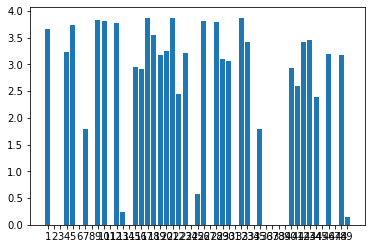

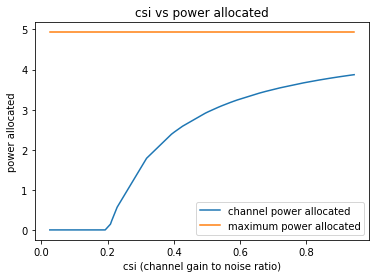

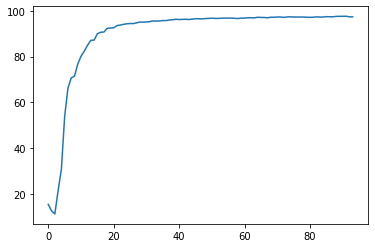

94
Power Allocated= 0
CSI= 0.08933102704665641
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.006853963443941
CSI= 0.8019136487610485
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18449344138680102
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.096680150055522
CSI= 0.8641616726325664
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1458786031786845
CSI= 0.9025332506284349
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.342287


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071841

Power Allocated= 3.2506670435850147
CSI= 0.9968062536503558
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.319073
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.104772

Power Allocated= 2.7209266646410772
CSI= 0.6523393982226633
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.419926
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.206208

Power Allocated= 3.1673468422548523
CSI= 0.9203660793391348
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.331848
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.184316

Power Allocated= 1.506766380291424
CSI= 0.36401962436652335
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.561953
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.179089

Power Allocated= 2.400708560250157
CSI= 0.5396180962543521
SNR= 18.187820388

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1074, Accuracy: 9725/10000 (97%)

Power in training Round= 97.99413996712856



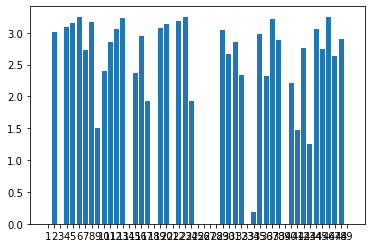

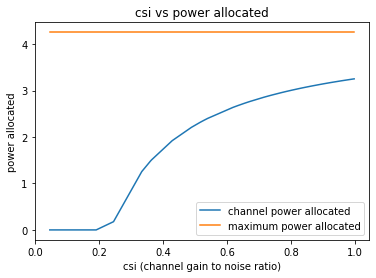

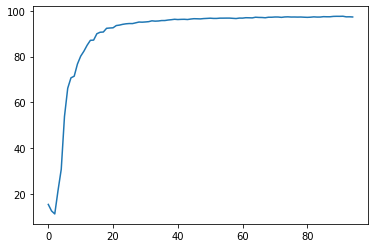

95
Power Allocated= 3.1581440757700676
CSI= 0.7565777403077609
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2975683899482666
CSI= 0.8457969084812735
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.169576545545506
CSI= 0.763178895967323
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06578757915591327
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4483848186289743
CSI= 0.49224698778941334
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.163978


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.168602

Power Allocated= 3.409349270494819
CSI= 0.9341114717175912
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.319048
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053751

Power Allocated= 2.6473540977719785
CSI= 0.5456932960451215
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.196265
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.168220

Power Allocated= 1.972088750336459
CSI= 0.39875642790010324
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.468288
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.260969

Power Allocated= 3.3577230301012198
CSI= 0.8911367041237964
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.295132
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.130603

Power Allocated= 3.3280679900634187
CSI= 0.868193226829894
SNR= 18.1878203886

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1107, Accuracy: 9727/10000 (97%)

Power in training Round= 97.99627879345371



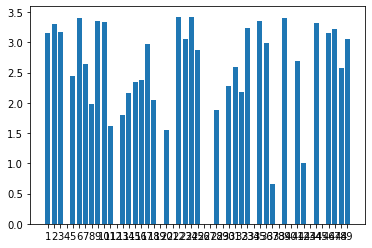

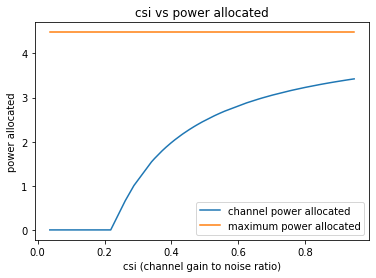

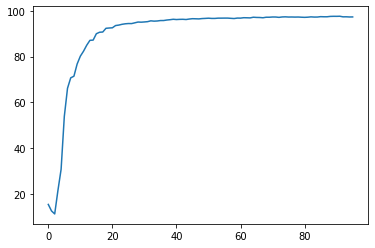

96
Power Allocated= 1.8070103408590676
CSI= 0.3914707798132875
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.765003462487119
CSI= 0.6263796201669166
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19672458314133434
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4151322135914124
CSI= 0.3394033126588859
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.370675


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.147873

Power Allocated= 2.3657230772895668
CSI= 0.5010631717395309
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2955534646215026
CSI= 0.48404445492788706
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.324743529189873
CSI= 0.9645658212738405
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.306757
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.221003

Power Allocated= 0.6596823772578362
CSI= 0.2701390676268258
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.612585
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.172171

Power Allocated= 0.3943861479360251
CSI= 0.25207373080949724
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.321095
Model client9 Train Epoch: 2 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0923, Accuracy: 9720/10000 (97%)

Power in training Round= 97.99828475891361



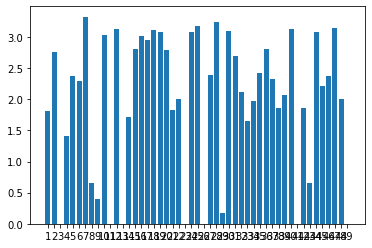

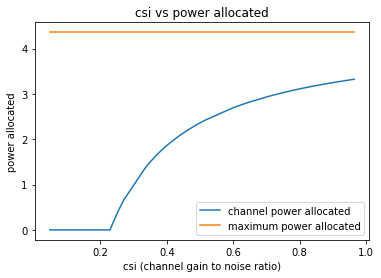

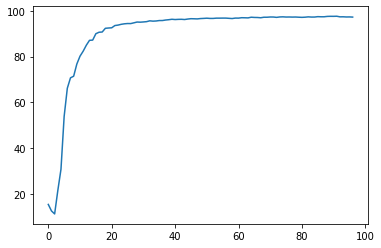

97
Power Allocated= 0
CSI= 0.1847070276565711
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.44329524362752437
CSI= 0.2138827038853921
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.386309


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.632661

Power Allocated= 0
CSI= 0.020836740052991742
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8832139659332836
CSI= 0.4473189852656615
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6760382947177064
CSI= 0.6931367149385222
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.083894
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.131594

Power Allocated= 1.7783851748141828
CSI= 0.2993680391041168
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.410857
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.129348

Power Allocated= 0
CSI= 0.19272156499241822
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2911111535441737
CSI= 0.5471525193280448
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1530, Accuracy: 9739/10000 (97%)

Power in training Round= 98.00384990502569



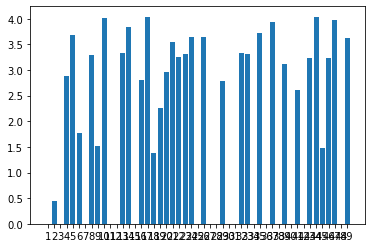

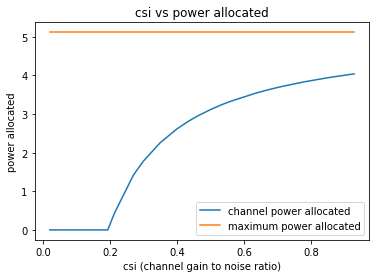

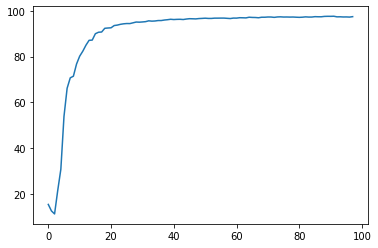

98
Power Allocated= 2.055157421983293
CSI= 0.3678407170440733
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.823982


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.270274

Power Allocated= 0
CSI= 0.15368786007079505
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.764998431156184
CSI= 0.9913485171951181
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6604911908018751
CSI= 0.32120936874146233
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.388613


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127508

Power Allocated= 1.9011176581729683
CSI= 0.348115748665629
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.354132
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.250596

Power Allocated= 2.3598709211082833
CSI= 0.41427517789503954
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.349541
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.147826

Power Allocated= 2.6487091156556506
CSI= 0.47058462570878357
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.442733
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.317249

Power Allocated= 0
CSI= 0.10563561883680883
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5633864993142175
CSI= 0.45241930672313924
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0999, Accuracy: 9718/10000 (97%)

Power in training Round= 97.99588469792928



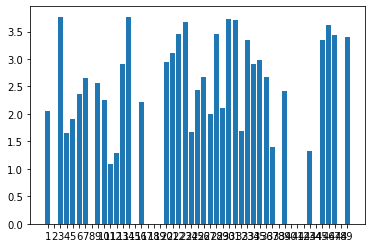

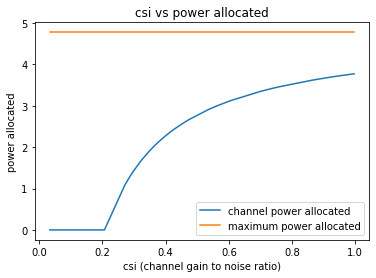

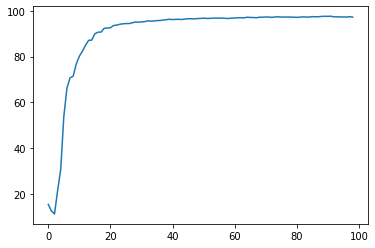

99
Power Allocated= 2.844838547703662
CSI= 0.6375056069807109
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07331359628235412
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2656789032455955
CSI= 0.46559848771478063
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.302268


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224025

Power Allocated= 0
CSI= 0.1869809951694278
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.82405011864725
CSI= 0.6291674147636622
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0739263282127993
CSI= 0.7465327989066876
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.209956
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.221188

Power Allocated= 3.2901231747597
CSI= 0.890211127347096
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8812566581235823
CSI= 0.6526582091902567
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0007320694187753
CSI= 0.7078542853008424
SNR= 18.17035793859231
Client: client9
Model clien

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1086, Accuracy: 9723/10000 (97%)

Power in training Round= 98.00246803162787



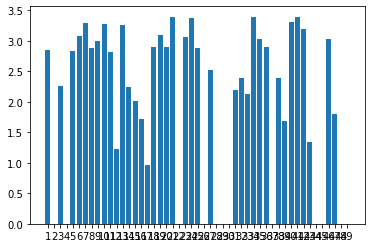

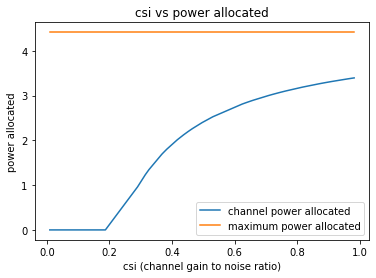

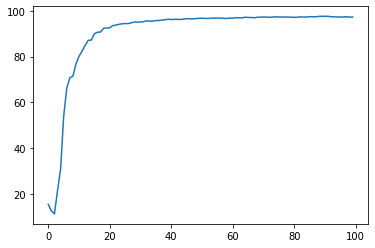

100
Power Allocated= 3.4321233067232813
CSI= 0.9901460360783314
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6793513793304444
CSI= 0.5673038000701732
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.392931


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.345585

Power Allocated= 2.3267051752356807
CSI= 0.4727305025817299
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.296098
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137244

Power Allocated= 3.295369112931815
CSI= 0.8720629386057334
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.452062
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.262346

Power Allocated= 1.9312201324479452
CSI= 0.3982706760425011
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.252759
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146551

Power Allocated= 0.9752046002338717
CSI= 0.2884445587262544
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.376271
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.087564

Power Allocated= 1.0500440247938951
CSI= 0.2948085992677011
SNR= 17.40065557

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.289334

Power Allocated= 2.2402499867016252
CSI= 0.45416862858483853
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.511577
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.277316

Power Allocated= 3.22786770824653
CSI= 0.823582372426703
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.433650
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.145193

Power Allocated= 0
CSI= 0.16276013768317543
SNR= 18.799405815022368
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0139534604282456
CSI= 0.7002203495276602
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.366508
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112583

Power Allocated= 2.997819552729225
CSI= 0.6923981267561716
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1111, Accuracy: 9711/10000 (97%)

Power in training Round= 97.99361690645487



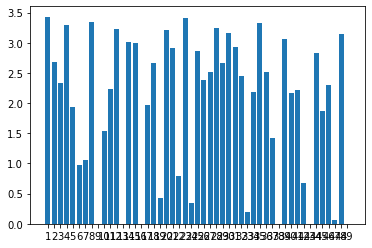

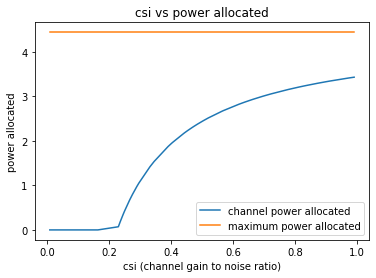

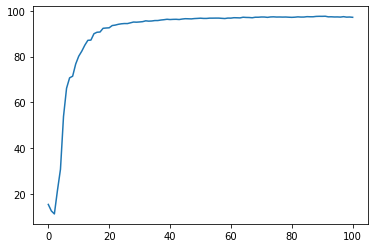

101
Power Allocated= 3.170549614976575
CSI= 0.813208590082638
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.024495


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.329694

Power Allocated= 1.5457516886686387
CSI= 0.3503246971157473
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.300924
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.347744

Power Allocated= 1.4562538991876135
CSI= 0.3396747766975219
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.222570
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.161835

Power Allocated= 3.278375892211722
CSI= 0.8913684607601793
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.194478050335926
CSI= 0.8293466890501414
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1770275940157746
CSI= 0.3102488710546404
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.284453
Model client6 Train Epoch: 2 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.149002

Power Allocated= 0
CSI= 0.17031514288432825
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.004257049611198327
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0038995644291820453
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8683846789000826
CSI= 0.6528004304942049
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.530728
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.064723

Power Allocated= 3.34550496640186
CSI= 0.9480996527321538
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.256970
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038323

Power Allocated= 2.66502774068835
CSI= 0.5762962417912448
SNR= 18.8

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0921, Accuracy: 9735/10000 (97%)

Power in training Round= 97.99692893010427



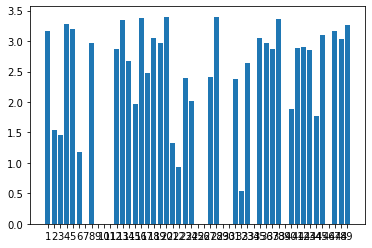

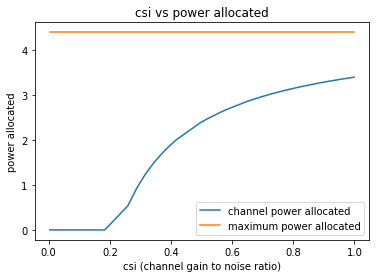

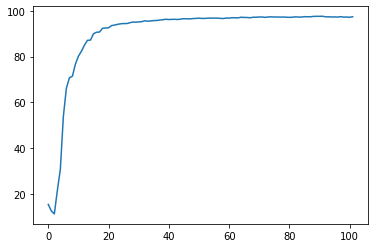

102
Power Allocated= 0
CSI= 0.13045079605976173
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.002780830188480188
CSI= 0.21635008505433373
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.943081


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.869891

Power Allocated= 0
CSI= 0.11336475531966073
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.897594676953887
CSI= 0.26828896446408546
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.408071
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.262749

Power Allocated= 3.6168343715085305
CSI= 0.9919801456473755
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.592771921460721
CSI= 0.9688541089407672
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.342416
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143262

Power Allocated= 0
CSI= 0.2014887921957339
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5891239455231796
CSI= 0.24778264769744907
SNR

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0873, Accuracy: 9748/10000 (97%)

Power in training Round= 97.99888513257824



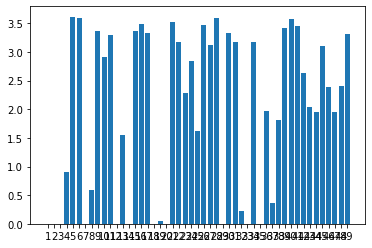

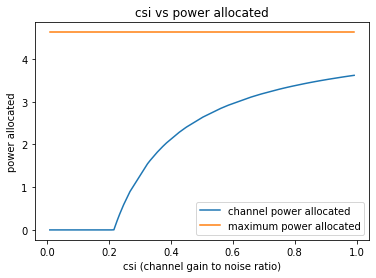

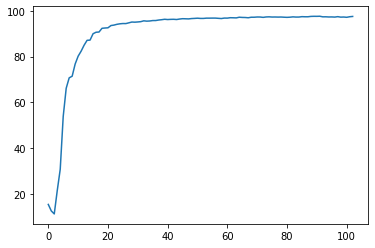

103
Power Allocated= 2.8502933751569692
CSI= 0.8388764898578652
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.185869


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.141649

Power Allocated= 2.234353396678777
CSI= 0.5530941092342538
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.149691
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.242150

Power Allocated= 1.5283586760221408
CSI= 0.39777163581328256
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.175028
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078065

Power Allocated= 0
CSI= 0.04771604472416535
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5777488348831268
CSI= 0.40574286181437047
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.428342


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075317

Power Allocated= 2.4776075979337167
CSI= 0.6390771208899694
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.296299
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082000

Power Allocated= 2.920768689211089
CSI= 0.8915872000875475
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.349330
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057600

Power Allocated= 3.0095864871415
CSI= 0.9682627790458753
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.208255
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.295227

Power Allocated= 0
CSI= 0.17021967989242304
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11450886211339151
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Al

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0927, Accuracy: 9743/10000 (97%)

Power in training Round= 97.9982233239983



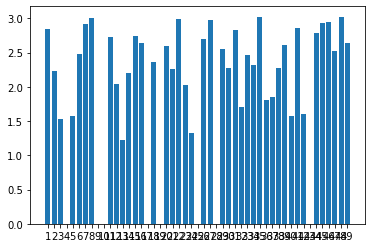

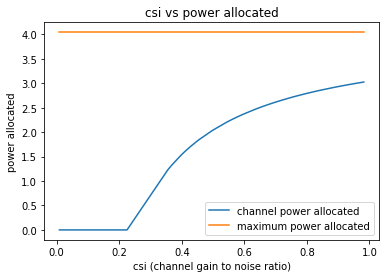

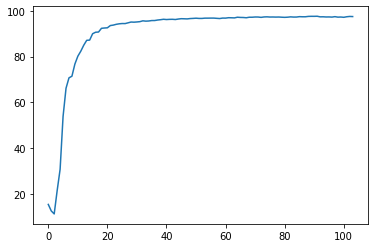

104
Power Allocated= 3.185584991600938
CSI= 0.8615272922256729
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235002


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.164490

Power Allocated= 0
CSI= 0.19627338062981792
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.161773211289372
CSI= 0.8442087725309044
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.163275


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.255535

Power Allocated= 2.8032137050106636
CSI= 0.6480458803222461
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.193748
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.351572

Power Allocated= 3.0304581789863017
CSI= 0.7599614917524175
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0149316093130976
CSI= 0.7510988297187225
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.57353424344192
CSI= 0.564085760071204
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7354174327454865
CSI= 0.6207721949972812
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.193306
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.129345

Power Allocated= 0
CSI= 0.1339577

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0942, Accuracy: 9746/10000 (97%)

Power in training Round= 98.00442733434335



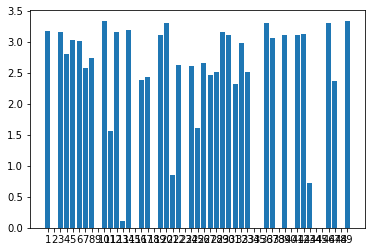

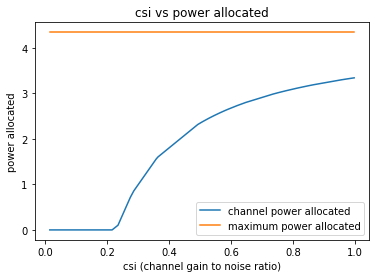

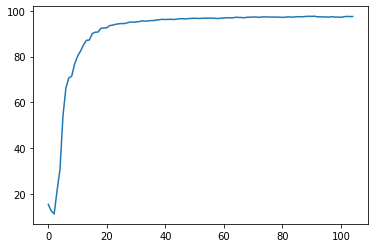

105
Power Allocated= 3.180253950237521
CSI= 0.671129950023464
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.219149


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089367

Power Allocated= 0
CSI= 0.1854925726542822
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5634151952226256
CSI= 0.32186805489523074
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.169159550507178
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.281989776184228
CSI= 0.7203113386341135
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.174262


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157372

Power Allocated= 0
CSI= 0.0366645112384939
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4411379265852275
CSI= 0.8135766931893865
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.315679
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079794

Power Allocated= 1.0575118459927229
CSI= 0.27679618909251413
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.352491
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.656826

Power Allocated= 3.4475352842931715
CSI= 0.8178333038226039
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.167130
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.194198

Power Allocated= 0
CSI= 0.18695152920230218
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Powe

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0955, Accuracy: 9751/10000 (98%)

Power in training Round= 98.00330436185378



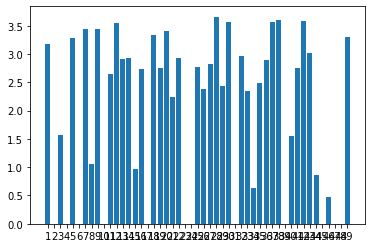

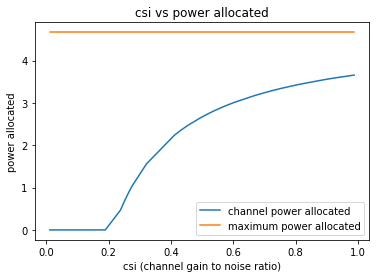

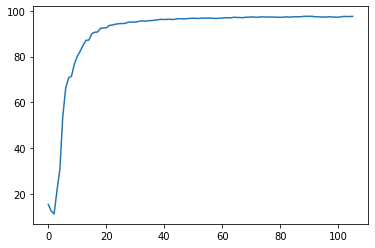

106
Power Allocated= 2.2783706552396943
CSI= 0.4783889445206786
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.270701


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.221905

Power Allocated= 0
CSI= 0.07661361657722576
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.348429577779251
CSI= 0.9801131251214877
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.179971


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076785

Power Allocated= 2.55609368671141
CSI= 0.5516857015425202
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.339196
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.154489

Power Allocated= 2.8873572746580938
CSI= 0.6750541285301253
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.288431
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.164590

Power Allocated= 2.975842885728672
CSI= 0.7179384418377865
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.117968
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078045

Power Allocated= 0
CSI= 0.09946575978968797
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2879084215888597
CSI= 0.9252306806393186
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.2

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0881, Accuracy: 9741/10000 (97%)

Power in training Round= 97.99705189329218



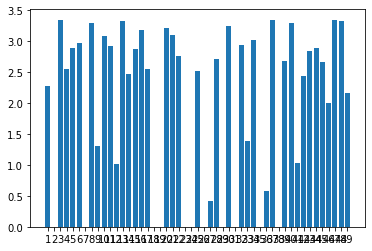

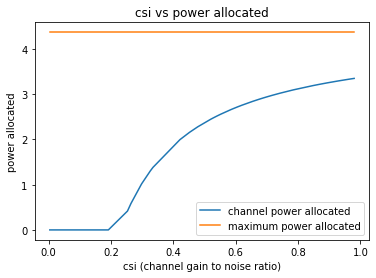

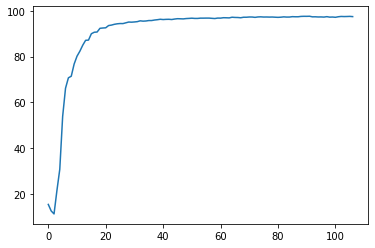

107
Power Allocated= 3.35270880638888
CSI= 0.7799882604528703
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4636534348313597
CSI= 0.4605905061158946
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220264


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.386368

Power Allocated= 2.368030507515146
CSI= 0.44116047002499326
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.163103
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.172488

Power Allocated= 3.1762863688184226
CSI= 0.6856392106420474
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.403618
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.104874

Power Allocated= 3.613880803562237
CSI= 0.9795292291226415
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.212060
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174079

Power Allocated= 0
CSI= 0.20415334313193734
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.30960636726153
CSI= 0.7546184437732081
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.314885

Power Allocated= 2.1873045378327367
CSI= 0.40858438294514954
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.268511
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092295

Power Allocated= 2.7204661650886983
CSI= 0.5223805539548293
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.167513
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.288757

Power Allocated= 0.22539320492728
CSI= 0.22678893598213345
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.172508
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.194358

Power Allocated= 0.8886901289435487
CSI= 0.266945054370044
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.166442
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.141113

Power Allocated= 0.08375070166205667
CSI= 0.219730542189431
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0897, Accuracy: 9752/10000 (98%)

Power in training Round= 98.00677654071096



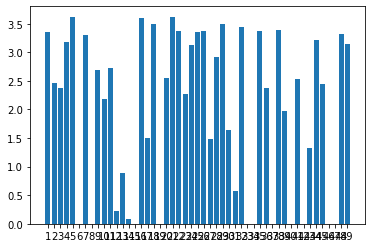

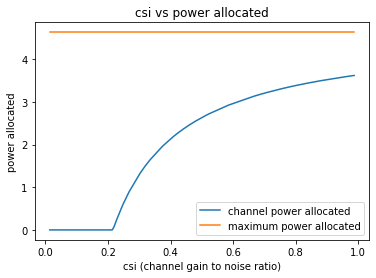

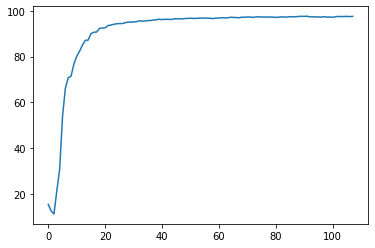

108
Power Allocated= 2.001034357965498
CSI= 0.4811700672736765
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.421166


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.086634

Power Allocated= 2.52464261094551
CSI= 0.6432278666153708
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.291531
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.230784

Power Allocated= 3.018672495830737
CSI= 0.9428366370991108
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.111094
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.302837

Power Allocated= 0
CSI= 0.13530398154943657
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9791129603817845
CSI= 0.476147699266931
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.379371


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107335

Power Allocated= 2.2190423484838533
CSI= 0.5375594753896392
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.216657
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.117639

Power Allocated= 0.8667100861564556
CSI= 0.31127517717594033
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.674854
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.179873

Power Allocated= 2.751020768039
CSI= 0.7528528291600382
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.162280
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.103943

Power Allocated= 2.1668946464178838
CSI= 0.5229012505973346
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.182323
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.287523

Power Allocated= 2.558308688166121
CSI= 0.6574652496590193
SNR= 18.187820388691

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0968, Accuracy: 9751/10000 (98%)

Power in training Round= 97.9950496744815



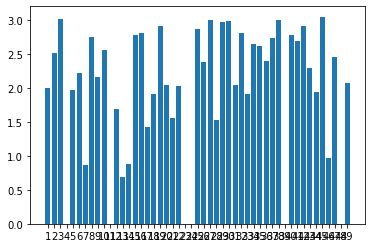

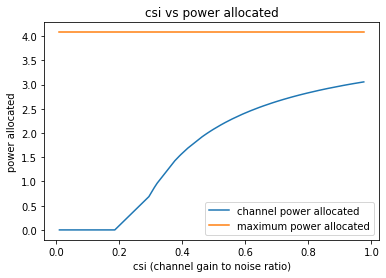

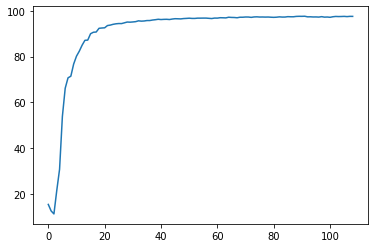

109
Power Allocated= 3.4010042509751575
CSI= 0.9749123432869993
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.300864


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119096

Power Allocated= 3.154317240382662
CSI= 0.7859038684664975
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.458320
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.216109

Power Allocated= 1.102835435004168
CSI= 0.300851223083754
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.224368
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.177344

Power Allocated= 3.4101116251606616
CSI= 0.9836460296670632
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.341656
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.161247

Power Allocated= 2.811546857978729
CSI= 0.6191219645590519
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.343806
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.521888

Power Allocated= 0
CSI= 0.0805686396797074
SNR= 17.04968172980935
Client: client

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337951

Power Allocated= 3.1551532954951194
CSI= 0.7864205931534373
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.563174
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195671

Power Allocated= 1.4431334961503608
CSI= 0.335165122638328
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.294184
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.384294

Power Allocated= 0
CSI= 0.1404779559979381
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.278852166970381
CSI= 0.8711671593371345
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4469281166486923
CSI= 0.3355919366668214
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.621818
Model client12 Train Epoch: 2 [0/1216 (0%)]	L

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0932, Accuracy: 9756/10000 (98%)

Power in training Round= 98.00244041317427



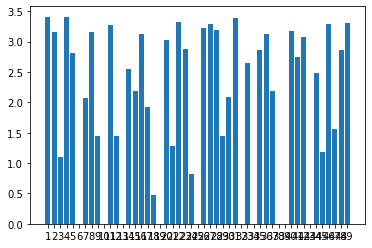

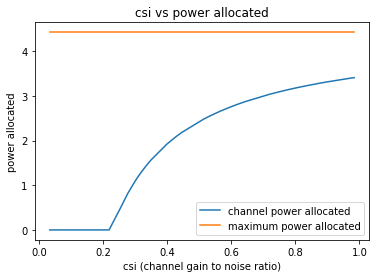

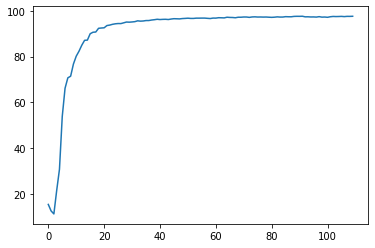

110
Power Allocated= 0
CSI= 0.028651328306407042
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1364870071993488
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3674496295996055
CSI= 0.380292892328543
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.212785


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.151767

Power Allocated= 1.9530752907617375
CSI= 0.3285230432862023
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.249067
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.096577

Power Allocated= 0
CSI= 0.10291296044164044
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.430393723288828
CSI= 0.38961928371308585
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.134035
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.240494

Power Allocated= 3.0870509863169726
CSI= 0.5235736927887886
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.229724
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.294492

Power Allocated= 3.7239271939749523
CSI= 0.7854999197336412
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0869, Accuracy: 9775/10000 (98%)

Power in training Round= 97.99718823187979



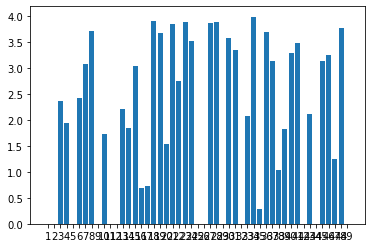

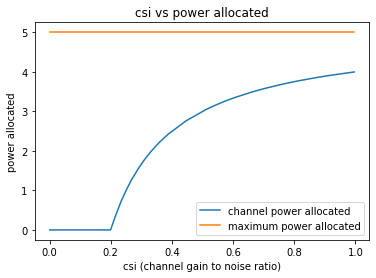

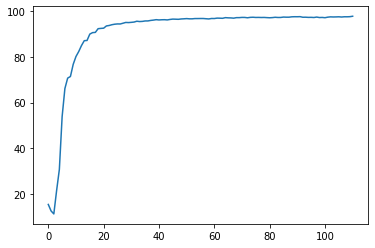

111
Power Allocated= 3.5292841697085873
CSI= 0.8088969105480424
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.717074949360451
CSI= 0.3280344079995682
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.233839


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.209187

Power Allocated= 0
CSI= 0.17373812871053196
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.021245495730208397
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06754157780843428
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3961969308046616
CSI= 0.7302795055394312
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.245436


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.284302

Power Allocated= 3.4366679242505924
CSI= 0.7525203475691197
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.153201
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.093935

Power Allocated= 3.314549991707407
CSI= 0.6891866896815684
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.331434
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.179425

Power Allocated= 3.5232029007210217
CSI= 0.8049373274861557
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.169574
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100046

Power Allocated= 3.301231835851558
CSI= 0.6829183895637617
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.236153
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092359

Power Allocated= 3.4541656078123384
CSI= 0.7625612685372845
SNR= 18.237505

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1140, Accuracy: 9770/10000 (98%)

Power in training Round= 97.99607148973227



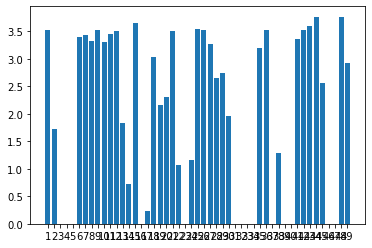

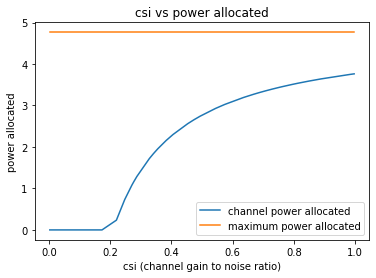

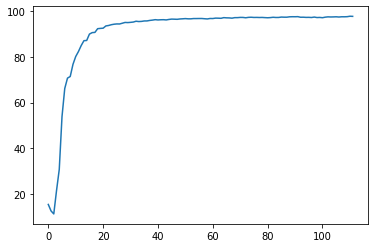

112
Power Allocated= 3.07343308538578
CSI= 0.6650506344043678
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.301088


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.148774

Power Allocated= 3.3074625664388924
CSI= 0.7876400827817258
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.400392704017213
CSI= 0.8498449067180522
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.373653
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083039

Power Allocated= 3.3703578587346317
CSI= 0.8286925619829194
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.242520
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.223334

Power Allocated= 0
CSI= 0.13175407154050622
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6518913361187293
CSI= 0.254764954462126
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.554884


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.220823

Power Allocated= 0
CSI= 0.005492680692443019
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.907010784582267
CSI= 0.5987782974927652
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.360699
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.148290

Power Allocated= 2.2151445241981036
CSI= 0.4233819508616077
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.280532
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062257

Power Allocated= 3.19562625977861
CSI= 0.7238761772528701
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.878536497992351
CSI= 0.5887404003365083
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263274
Model client11 Train Epoch: 2 [0/1216 (0%)]	Los

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0970, Accuracy: 9753/10000 (98%)

Power in training Round= 97.99318798680223



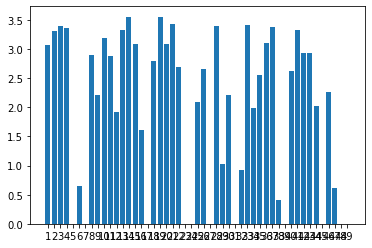

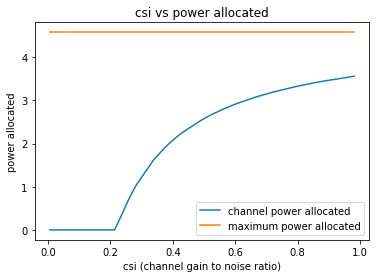

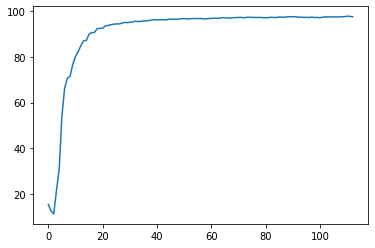

113
Power Allocated= 3.74729999193754
CSI= 0.994478932327373
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0554806538427264
CSI= 0.3707313450022309
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.254458


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.232208

Power Allocated= 0
CSI= 0.07136275340244669
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5956726622829511
CSI= 0.31673845054743444
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.159639


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.210729

Power Allocated= 3.214234925430214
CSI= 0.6499344147036294
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.208998
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.132511

Power Allocated= 3.654115167803439
CSI= 0.9101362889652853
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.169175
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153235

Power Allocated= 2.4507840814585413
CSI= 0.43439210349674917
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.427260
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136639

Power Allocated= 2.462156861971646
CSI= 0.4365487617926944
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.293979
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109769

Power Allocated= 0
CSI= 0.024327453491616358
SNR= 18.17035793859231
Client: c

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1104, Accuracy: 9743/10000 (97%)

Power in training Round= 97.99973466796978



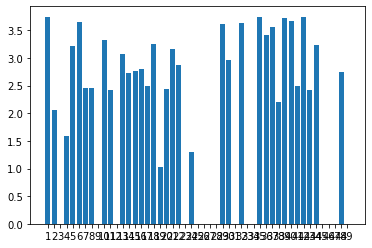

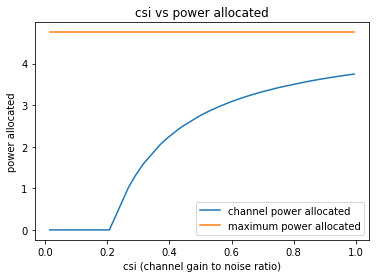

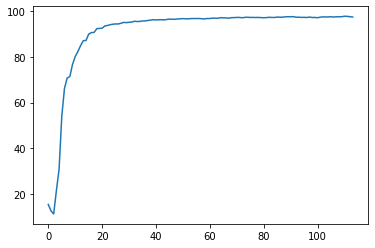

114
Power Allocated= 1.3884787469148887
CSI= 0.3237714329410094
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.810617525350878
CSI= 0.600074467364472
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.226039


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.208081

Power Allocated= 3.2243105701942048
CSI= 0.7982331628092598
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.280285
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.120751

Power Allocated= 0.2716456394227995
CSI= 0.23778771491646755
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.403916
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.181070

Power Allocated= 1.3527771864944613
CSI= 0.32007167788573143
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.232935
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067828

Power Allocated= 3.2556210077821195
CSI= 0.8186948268708673
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.271531
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.216068

Power Allocated= 0
CSI= 0.17803937821805427
SNR= 17.40065557253575
Client

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.301877

Power Allocated= 1.899211138963365
CSI= 0.3879177244838009
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.346578
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119908

Power Allocated= 0.4664579082307503
CSI= 0.24933804143076332
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.309559
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.134603

Power Allocated= 3.14239267949195
CSI= 0.7492406346489028
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.345301
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100634

Power Allocated= 1.719033223116209
CSI= 0.3625757779630069
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.252887
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114008

Power Allocated= 3.4219587147306836
CSI= 0.9477607099352218
SNR= 18.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0854, Accuracy: 9736/10000 (97%)

Power in training Round= 98.00007069146646



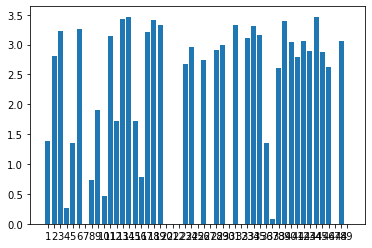

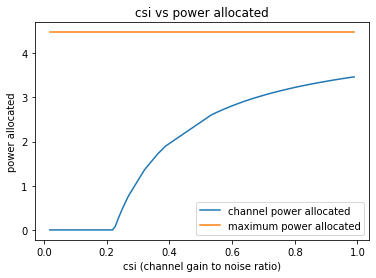

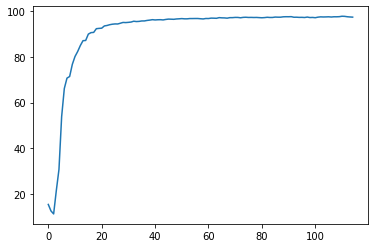

115
Power Allocated= 0
CSI= 0.05807493867782798
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9216480113031285
CSI= 0.3326234647516121
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.392011


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112285

Power Allocated= 3.8036558323340954
CSI= 0.8893674627358805
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.301233
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111892

Power Allocated= 2.536940428863995
CSI= 0.4182158017091011
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15176879309178593
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6714914364347653
CSI= 0.795824134537337
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.281371
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.145404

Power Allocated= 0
CSI= 0.17810351552842085
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.9144781342125645
CSI= 0.986609412435776
SNR= 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1015, Accuracy: 9751/10000 (98%)

Power in training Round= 97.99921043182002



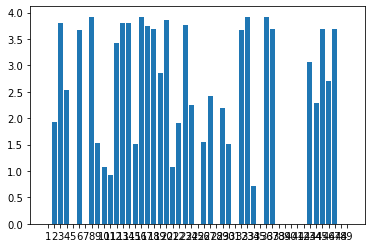

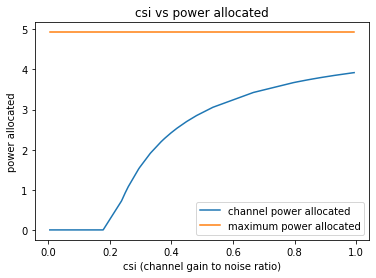

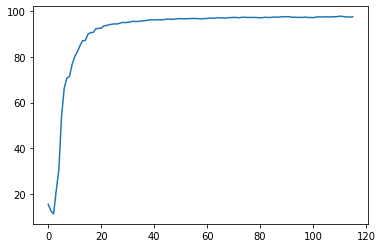

116
Power Allocated= 0
CSI= 0.019089484714106097
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.191954900347355
CSI= 0.6993146276017644
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235400


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.128275

Power Allocated= 0
CSI= 0.08762091031757546
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9183983540099545
CSI= 0.5870170386925132
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.243053
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063368

Power Allocated= 2.7687695326737733
CSI= 0.5396197199575752
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9456661280750343
CSI= 0.5965660616400402
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2638037832798927
CSI= 0.7363105317216108
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.378328
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.217073

Power Allocated= 3.1538296622186346
CSI= 0.681

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1319, Accuracy: 9753/10000 (98%)

Power in training Round= 98.00098859722716



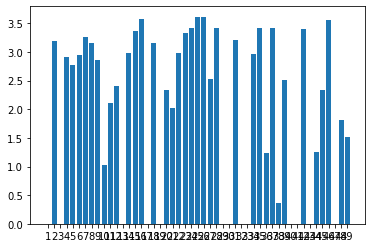

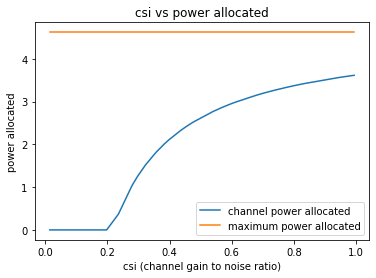

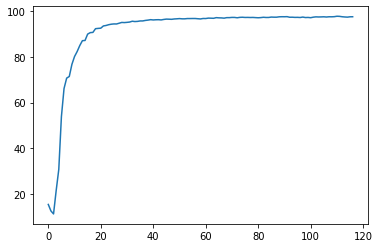

117
Power Allocated= 3.3710649050991437
CSI= 0.8032852260848801
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.431135


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.211718

Power Allocated= 0
CSI= 0.013664480709950189
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5822626591783129
CSI= 0.3296315628107227
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.227691


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068727

Power Allocated= 1.5932940106436702
CSI= 0.33083457047975695
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.187800
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174776

Power Allocated= 1.3242228838263843
CSI= 0.303791637202269
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.605418
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.267387

Power Allocated= 3.5666360071492607
CSI= 0.9530011060560755
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1336930350780188
CSI= 0.4028587343139026
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.028099835272125562
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.375531987409465
CSI= 0.806

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0857, Accuracy: 9745/10000 (97%)

Power in training Round= 98.00517410687611



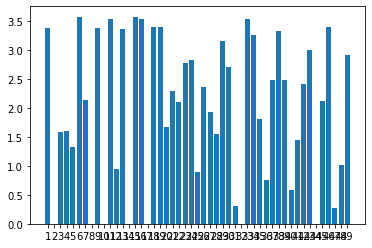

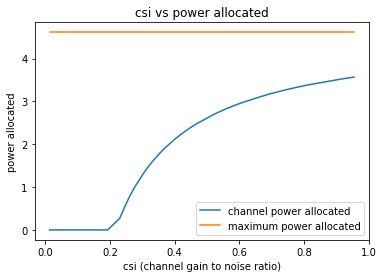

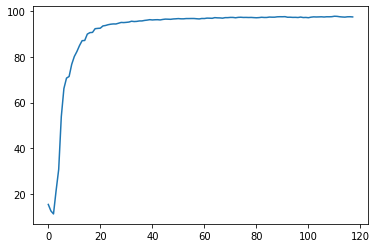

118
Power Allocated= 2.0466343911256835
CSI= 0.37485779833757427
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.358526526579543
CSI= 0.42448675144716386
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.306371


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111141

Power Allocated= 1.7274705008011941
CSI= 0.33480175682925917
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.342933
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.087298

Power Allocated= 3.0867520849425185
CSI= 0.614416458283393
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.071104
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.212935

Power Allocated= 2.7997189979766315
CSI= 0.5223040394308792
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.138076
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027846

Power Allocated= 2.943368921705389
CSI= 0.5646706793712057
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.145927
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.241782

Power Allocated= 2.596476132469658
CSI= 0.47217997716264803
SNR= 17.40065557

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.316275

Power Allocated= 2.4989127067212764
CSI= 0.45138576516734663
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.286137
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.268004

Power Allocated= 0
CSI= 0.011528616454640872
SNR= 19.038283273448883
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6577334792939578
CSI= 0.9464506065252462
SNR= 19.130844735393737
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8290793549768027
CSI= 0.5304383287385468
SNR= 19.30637432921484
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.708838
Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.138034

Power Allocated= 1.601239616176072
CSI= 0.3212260001940104
SNR= 19.748614351489568
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.355053
Model client19 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0857, Accuracy: 9741/10000 (97%)

Power in training Round= 98.00031260047776



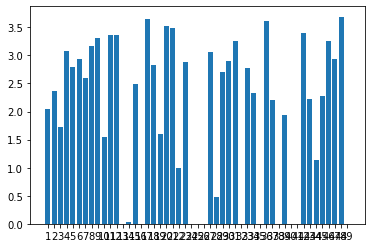

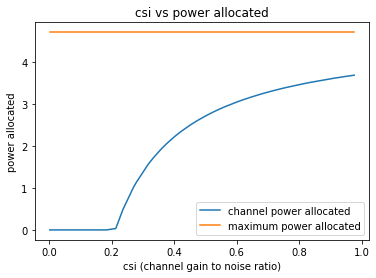

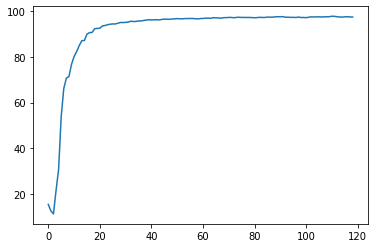

119
Power Allocated= 3.3340118488060386
CSI= 0.9757944051654327
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.108382


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112089

Power Allocated= 2.501150001739072
CSI= 0.5383093539371507
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.175158
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337326

Power Allocated= 2.056220550140011
CSI= 0.434292172279489
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.431468
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112176

Power Allocated= 0
CSI= 0.031017704931536993
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.082045744255536
CSI= 0.7832251075010832
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.237279


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.329581

Power Allocated= 2.5495725617708933
CSI= 0.5527166411194558
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.187168
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136750

Power Allocated= 0
CSI= 0.021500509646891985
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.76803313277336
CSI= 0.6286205574601729
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.135989
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.235140

Power Allocated= 1.4045352753752516
CSI= 0.3384916512480024
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.215747
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100610

Power Allocated= 3.217855194195267
CSI= 0.8764528454029132
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0839, Accuracy: 9746/10000 (97%)

Power in training Round= 97.9991581432922



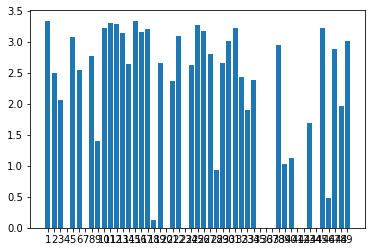

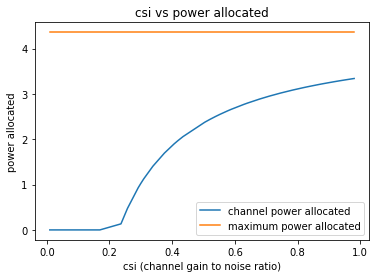

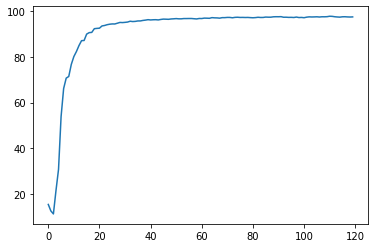

120
Power Allocated= 0
CSI= 0.16130797918142992
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5081449911298663
CSI= 0.45063448871741596
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.231318


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146336

Power Allocated= 3.2261373727952973
CSI= 0.6661777035295281
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.03194489382241
CSI= 0.5898683781940947
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.231393
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.320075

Power Allocated= 1.5536966867541588
CSI= 0.31510536395787603
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263184
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.239688

Power Allocated= 0.3672159741963572
CSI= 0.2293566212310275
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.173461
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189012

Power Allocated= 0
CSI= 0.008925649033635352
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in t

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0852, Accuracy: 9748/10000 (97%)

Power in training Round= 97.99684200417549



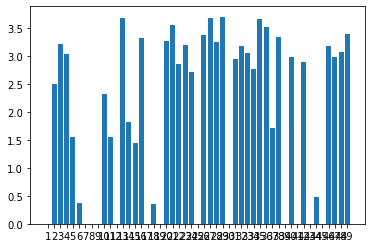

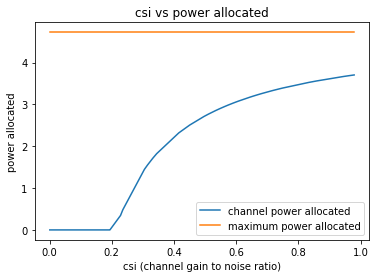

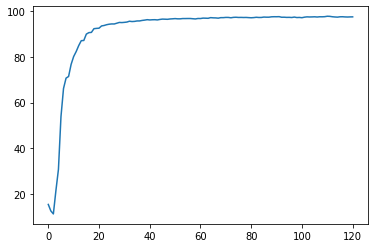

121
Power Allocated= 1.946461573478722
CSI= 0.39547383904865996
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.210610


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224452

Power Allocated= 3.3081256474681413
CSI= 0.8569360726531597
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1453113453222762
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6168316650773153
CSI= 0.34986538552329527
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.160450


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050019

Power Allocated= 2.121094271167368
CSI= 0.4248125233475183
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.258749
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124107

Power Allocated= 2.305452254014424
CSI= 0.4609098688222544
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.588134
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.296721

Power Allocated= 3.4684008804653876
CSI= 0.9933712749521605
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.010499765743279
CSI= 0.6827923684108206
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.254754
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.140411

Power Allocated= 3.2079478340219776
CSI= 0.7891874969761258
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0879, Accuracy: 9755/10000 (98%)

Power in training Round= 97.99779699639448



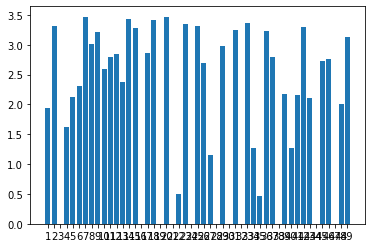

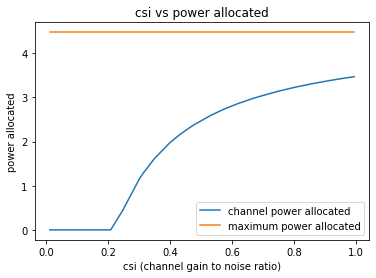

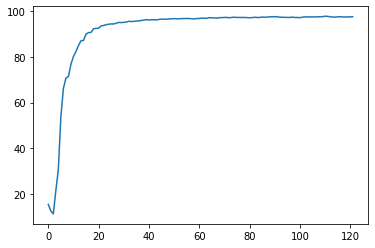

122
Power Allocated= 3.3015147890978724
CSI= 0.872831269096178
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2218011324742739
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9204649686104704
CSI= 0.28354744612884775
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.222774


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.051073

Power Allocated= 0
CSI= 0.0713305883345563
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5721768651551944
CSI= 0.533323453858228
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.013253694833363583
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9178839015617695
CSI= 0.6538820961095091
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.386170
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.154705

Power Allocated= 3.4436285188949807
CSI= 0.9964297131879688
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.170644
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.130176

Power Allocated= 1.8841247995812687
CSI= 0.39015455913895203
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0844, Accuracy: 9760/10000 (98%)

Power in training Round= 97.9941525611167



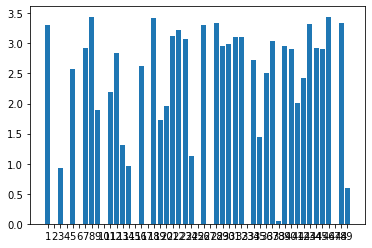

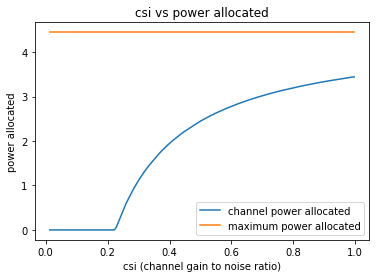

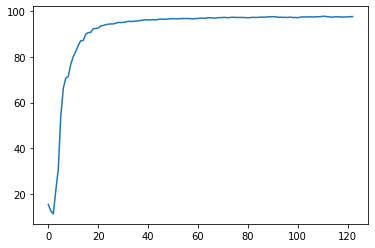

123
Power Allocated= 0.7909547036599776
CSI= 0.2690193256420196
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220666


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159034

Power Allocated= 2.98947646462746
CSI= 0.6584651302879192
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.471692
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189604

Power Allocated= 3.083602414860466
CSI= 0.7019724386427605
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.186595
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189603

Power Allocated= 3.299887192445352
CSI= 0.827627821116597
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7031026712150688
CSI= 0.2628081456475764
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.389056
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.183246

Power Allocated= 3.0936442673391387
CSI= 0.7069558436770339
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038385

Power Allocated= 1.1993596617304934
CSI= 0.30222436155867693
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.449874
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.287957

Power Allocated= 2.8355307351926022
CSI= 0.5978611991533619
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.209198
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.180258

Power Allocated= 0
CSI= 0.07914500323139273
SNR= 19.038283273448883
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.983631239775537
CSI= 0.6559404961669819
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.262621
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.064566

Power Allocated= 2.984211396195032
CSI= 0.6561902080971256
SNR= 19.30637432921484
Client: client18
Model client18 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0858, Accuracy: 9752/10000 (98%)

Power in training Round= 98.00621882157664



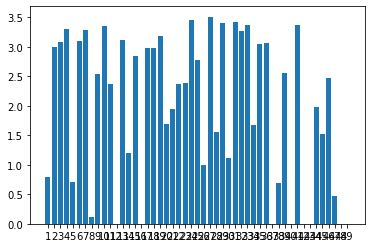

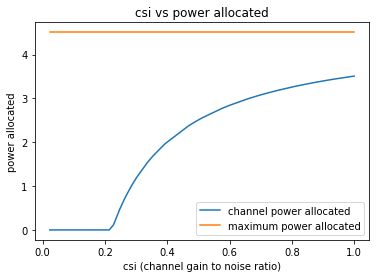

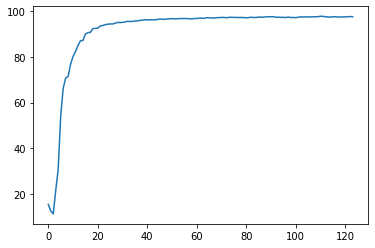

124
Power Allocated= 3.0269906337900823
CSI= 0.8590148694029245
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.231700


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070742

Power Allocated= 0
CSI= 0.120784848586455
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4472207040504346
CSI= 0.5734293047757479
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.115558


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.253118

Power Allocated= 0
CSI= 0.015873165962116964
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9720183161000384
CSI= 0.8202795949523201
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.215253
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.631167

Power Allocated= 2.289935235277161
CSI= 0.5259892328594779
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5972653099668257
CSI= 0.3855273753363959
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.298794
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.271268

Power Allocated= 2.087965839933832
CSI= 0.47547748714445426
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.160387
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0975, Accuracy: 9758/10000 (98%)

Power in training Round= 97.99762077521119



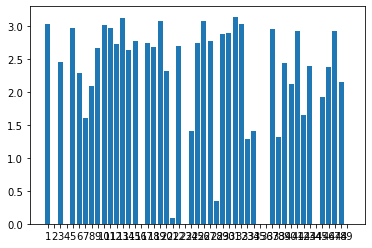

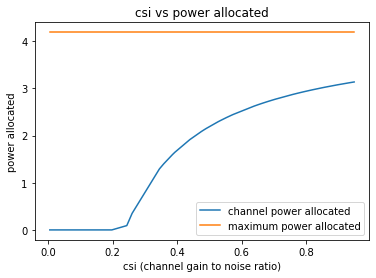

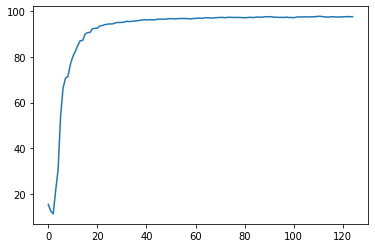

125
Power Allocated= 0
CSI= 0.22423295937065224
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09018591713743263
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4824107757130944
CSI= 0.5350968347706476
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.225153


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053895

Power Allocated= 2.62887812828341
CSI= 0.5806009819822033
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.192396
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153232

Power Allocated= 3.2200072501127366
CSI= 0.8839981019127409
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.319705
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200124

Power Allocated= 3.0556240998296764
CSI= 0.7718388133788271
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.189211479892135
CSI= 0.8605704463395986
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.241873
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.182792

Power Allocated= 2.870351470460851
CSI= 0.6752741941295873
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0953, Accuracy: 9762/10000 (98%)

Power in training Round= 98.0058106154137



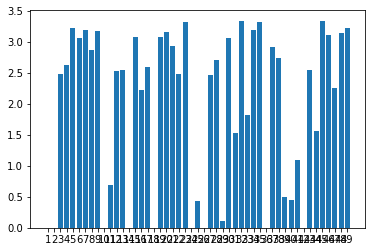

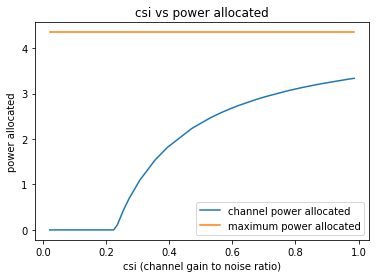

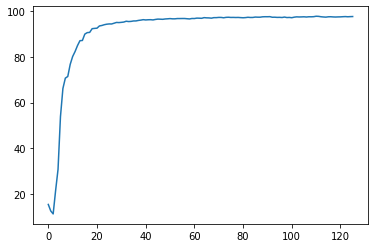

126
Power Allocated= 0
CSI= 0.09138873530659508
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0111880636367983
CSI= 0.7479341341017183
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.125154


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.333281

Power Allocated= 2.195739345589748
CSI= 0.46458366175939614
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.572258
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042917

Power Allocated= 2.8006640094308066
CSI= 0.6461867752949286
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.141884
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016416

Power Allocated= 3.040176929109661
CSI= 0.7645100592499519
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5674884129119997
CSI= 0.5615719318766755
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2839995105487385
CSI= 0.48444808266647277
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.348795
Model client7 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0934, Accuracy: 9775/10000 (98%)

Power in training Round= 98.00529819998704



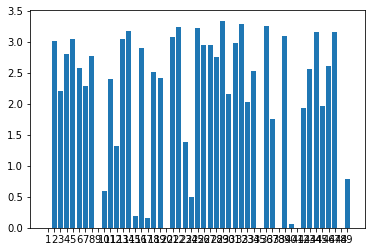

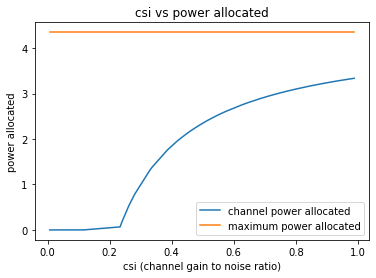

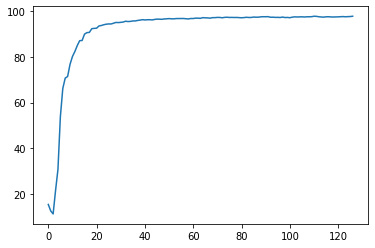

127
Power Allocated= 3.299211432505561
CSI= 0.7812728983028449
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.37077574273005
CSI= 0.8275417997737675
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.080503


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.205639

Power Allocated= 2.121885861923522
CSI= 0.4069526964588599
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1056079815802127
CSI= 0.6786258937898462
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.222934701590225
CSI= 0.7373330520301107
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.145943093434205
CSI= 0.6977243187486649
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5215407852501865
CSI= 0.24644909175473273
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263237
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.523148

Power Allocated= 3.2041196140080688
CSI= 0.7272440061497266
SNR= 18.049650368948967
Clien

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036221

Power Allocated= 2.2033307701349742
CSI= 0.42090320706090445
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.079912
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195351

Power Allocated= 3.4694384182552813
CSI= 0.9011156271994072
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.419867
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.140314

Power Allocated= 3.4665364157937715
CSI= 0.8987653201449155
SNR= 19.00770332812949
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.352445692284244
CSI= 0.44908938095311834
SNR= 19.038283273448883
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.175836
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.244673

Power Allocated= 3.454217652181462
CSI= 0.888923446404749
SNR= 19.130844735393737
Client: client17
Model client17 Train

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0996, Accuracy: 9778/10000 (98%)

Power in training Round= 98.00718215260991



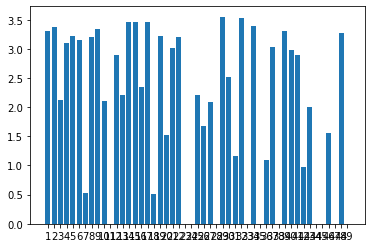

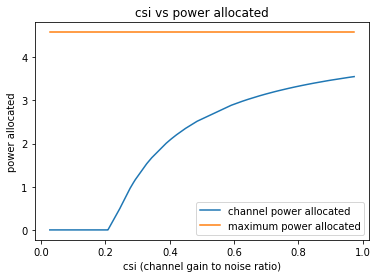

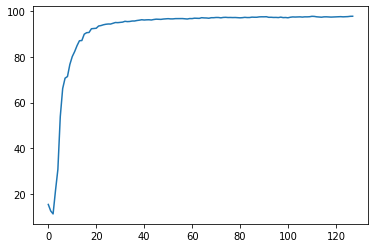

128
Power Allocated= 0
CSI= 0.09335102881759128
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6935260791693136
CSI= 0.5201758923766209
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1686289651608686
CSI= 0.6909304071878195
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.093377762248083
CSI= 0.6567821088899887
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5149648325116676
CSI= 0.9082751952854792
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.239831


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.158353

Power Allocated= 1.2330279000902782
CSI= 0.2956021932195869
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.269196
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.131215

Power Allocated= 3.528699722744695
CSI= 0.9197491208529769
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.164085
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107792

Power Allocated= 2.434253406888918
CSI= 0.45835830272061995
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.350749
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.162482

Power Allocated= 3.0743221771972418
CSI= 0.6486638426221057
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.210323
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136434

Power Allocated= 2.5089944347752007
CSI= 0.4746178417538305
SNR= 18.187820388

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2017, Accuracy: 9750/10000 (98%)

Power in training Round= 98.00509313661634



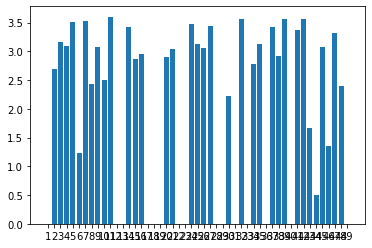

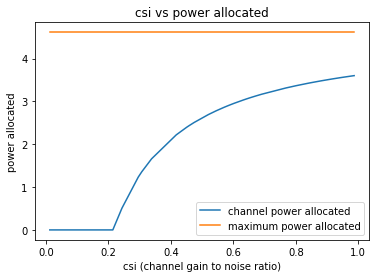

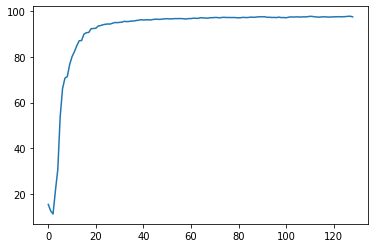

129
Power Allocated= 3.141244631952971
CSI= 0.8668891104595086
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.759093


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.181879

Power Allocated= 0
CSI= 0.18409919287906296
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0121039140682226
CSI= 0.7796111144609047
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.578706


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.319870

Power Allocated= 3.169346319059237
CSI= 0.8885347467763229
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.194064019062422
CSI= 0.908487434130023
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.448856
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.181470

Power Allocated= 2.531747352104512
CSI= 0.5671997386767539
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.394691
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107458

Power Allocated= 0
CSI= 0.043309493959438394
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.718944701054852
CSI= 0.3882213626523212
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.671392
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.2

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0919, Accuracy: 9759/10000 (98%)

Power in training Round= 98.0048820144091



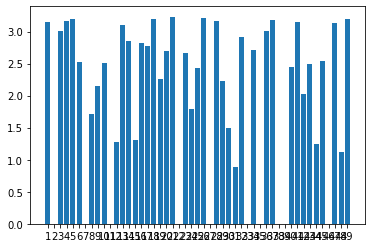

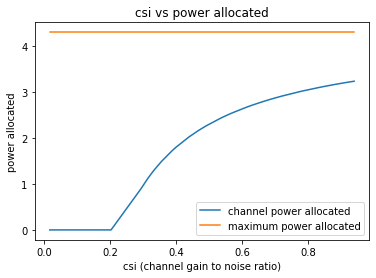

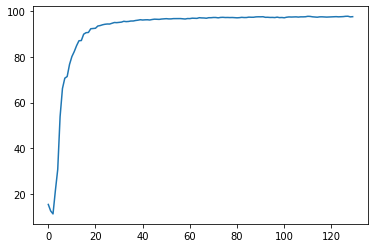

130
Power Allocated= 3.4809644719223827
CSI= 0.837438637577259
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.267876


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.304649

Power Allocated= 3.2524910759231545
CSI= 0.7029428586042911
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8842153379896365
CSI= 0.5583889214709521
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.339739
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.360808

Power Allocated= 2.2105599346804166
CSI= 0.4057582155868843
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.471287
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.225780

Power Allocated= 1.6631661132370454
CSI= 0.332014604448999
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263885
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200015

Power Allocated= 0
CSI= 0.048129094603967415
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in th

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.260541

Power Allocated= 2.6590433863018257
CSI= 0.49602229118987284
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.287213
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.121629

Power Allocated= 0.7099236559275068
CSI= 0.2521967498273092
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263830
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107030

Power Allocated= 0
CSI= 0.17862565163752886
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1771524897877743
CSI= 0.667588239232338
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.194230
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079115

Power Allocated= 3.6254802375814457
CSI= 0.9527424715546648
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0821, Accuracy: 9750/10000 (98%)

Power in training Round= 98.00485102342893



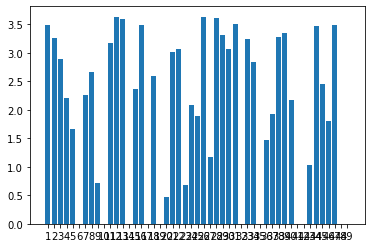

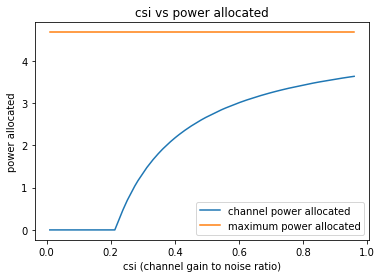

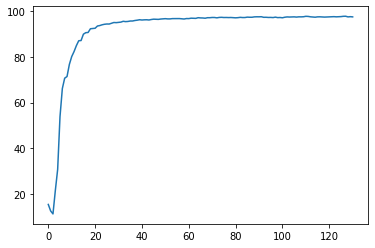

131
Power Allocated= 3.0607978986465034
CSI= 0.7612347044395327
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9389150132419317
CSI= 0.6966028586741204
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2863576615603023
CSI= 0.9190369510607643
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.274324


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009929

Power Allocated= 3.3696041675926605
CSI= 0.9951743738270178
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.084547
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.138744

Power Allocated= 3.0482104851179503
CSI= 0.7540098006134219
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.219483
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095138

Power Allocated= 3.0415275257256322
CSI= 0.7502293820939964
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4716975141208053
CSI= 0.2562292088438344
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.395181
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.254107

Power Allocated= 2.6997633904376777
CSI= 0.5971255084136942
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.164616

Power Allocated= 3.0607807831055647
CSI= 0.7612247864846102
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.177825
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.228367

Power Allocated= 3.339761588470762
CSI= 0.9664715508303544
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.197817
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067382

Power Allocated= 2.4178661401862023
CSI= 0.5110940493970659
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.155650
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.354344

Power Allocated= 0
CSI= 0.17874906117933687
SNR= 19.038283273448883
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9291711924038815
CSI= 0.6919064925353703
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0791, Accuracy: 9763/10000 (98%)

Power in training Round= 97.99828651307574



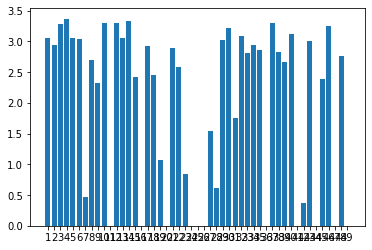

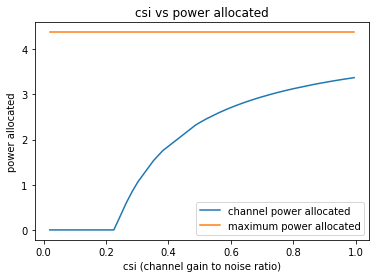

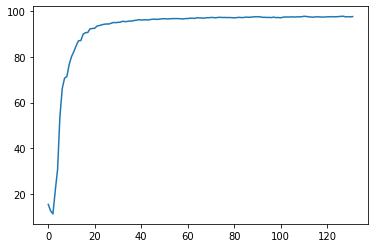

132
Power Allocated= 2.8660629806646827
CSI= 0.7975049887327462
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.175871


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.202686

Power Allocated= 1.2375654513855112
CSI= 0.34693212663867223
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.074415
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.156365

Power Allocated= 2.8285805409570512
CSI= 0.7743575575902644
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9917925026843726
CSI= 0.8863824911312055
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.075522
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036929

Power Allocated= 1.9819758587827527
CSI= 0.46772733463424265
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.199967
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.229650

Power Allocated= 0.08281529942377386
CSI= 0.24769897972268895
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.312570

Power Allocated= 1.2334849718222043
CSI= 0.3464416866546005
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.327190
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071329

Power Allocated= 3.0913307167557083
CSI= 0.9721546564076594
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.232940
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.240114

Power Allocated= 2.1979146932612026
CSI= 0.520275408707357
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.255729
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.266114

Power Allocated= 2.9782716270609404
CSI= 0.8758852971491066
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235492
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157288

Power Allocated= 1.0243595230446725
CSI= 0.32303768000424404
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0900, Accuracy: 9767/10000 (98%)

Power in training Round= 97.99304500073961



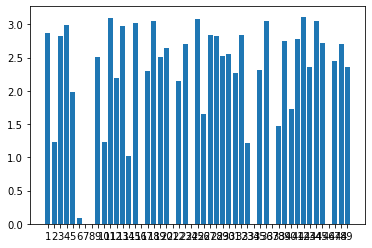

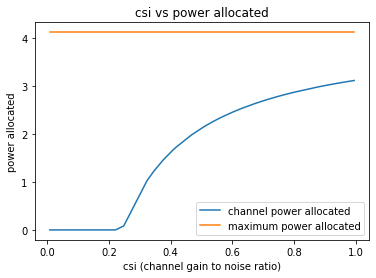

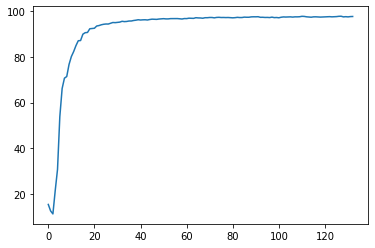

133
Power Allocated= 1.9911247891065837
CSI= 0.36458732485061385
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6548100362665688
CSI= 0.9266622218833821
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.050644293996075
CSI= 0.5940684843470885
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.285720


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.314958

Power Allocated= 3.42821951344198
CSI= 0.7658537139458992
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.294112
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.216309

Power Allocated= 1.6421713103437643
CSI= 0.32343821626909797
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.480733
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.378714

Power Allocated= 2.8708155266580886
CSI= 0.5367293627410662
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3103703970257694
CSI= 0.22606116754905015
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.455929
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.283721

Power Allocated= 0
CSI= 0.07223185157748835
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in t

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077665

Power Allocated= 0
CSI= 0.08638242912361005
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8995573769751983
CSI= 0.5451390013359432
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.197559
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249419

Power Allocated= 1.823652412786755
CSI= 0.3436072484450342
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.435233
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146983

Power Allocated= 2.94402618664573
CSI= 0.5586824027588266
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.158308
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.051478

Power Allocated= 0.6477042345153103
CSI= 0.24472329655897662
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0804, Accuracy: 9765/10000 (98%)

Power in training Round= 97.99204547218757



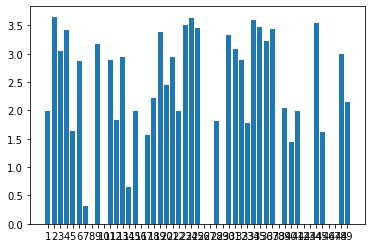

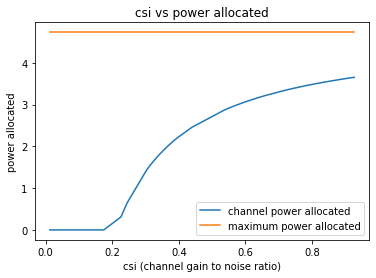

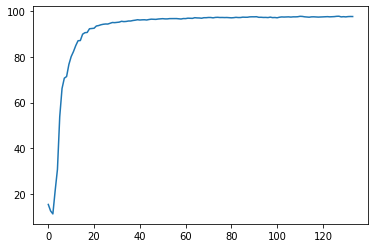

134
Power Allocated= 3.1299861458283225
CSI= 0.9789922393002185
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4606731671281583
CSI= 0.5914459635305248
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.154227


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.120056

Power Allocated= 2.1996694487087325
CSI= 0.5123540724916155
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.357107
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119982

Power Allocated= 0
CSI= 0.035096253095582064
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.136860598078787
CSI= 0.9856255340380452
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.141964


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112394

Power Allocated= 1.6880408360232826
CSI= 0.4059423684050283
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.059367
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.513071

Power Allocated= 2.47067208430453
CSI= 0.5949644758734295
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.206010
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.246387

Power Allocated= 1.3866531838799832
CSI= 0.36169092431467087
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.316280
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112892

Power Allocated= 2.181798121109401
CSI= 0.5077052956188174
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.130581
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048640

Power Allocated= 2.7515428609423704
CSI= 0.7143357985040775
SNR= 18.1878203886

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0859, Accuracy: 9765/10000 (98%)

Power in training Round= 97.99992645449116



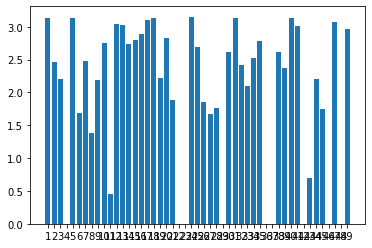

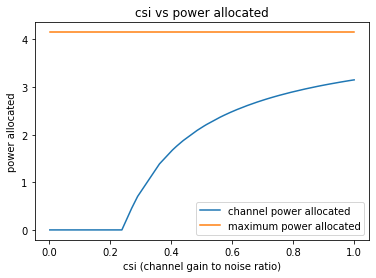

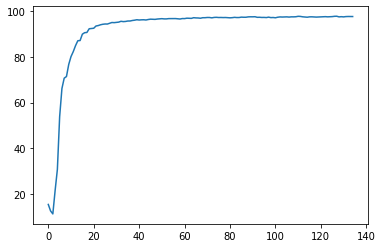

135
Power Allocated= 2.6429834884702568
CSI= 0.6621703624312307
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.102881


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.244733

Power Allocated= 2.3557652178674937
CSI= 0.5563580556941712
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.373767
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069658

Power Allocated= 2.6365083501612037
CSI= 0.6593433324987569
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.077626
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.312916

Power Allocated= 0
CSI= 0.04303788520504637
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0840694190045586
CSI= 0.9353666780794675
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.269246


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078428

Power Allocated= 2.846671111628211
CSI= 0.7654050649841448
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.202911
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.219703

Power Allocated= 0.3905039630611502
CSI= 0.2657690826329411
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.320771
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.140866

Power Allocated= 2.2067121459950405
CSI= 0.5137540376694004
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.128569
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006595

Power Allocated= 2.2113234435669744
CSI= 0.5149740486532072
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.251645
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049819

Power Allocated= 2.2205292963881
CSI= 0.5174270540498744
SNR= 18.187820388691

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0930, Accuracy: 9773/10000 (98%)

Power in training Round= 97.99955908251201



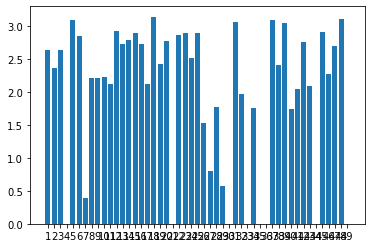

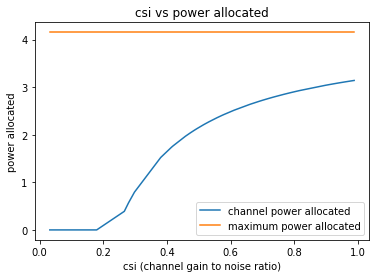

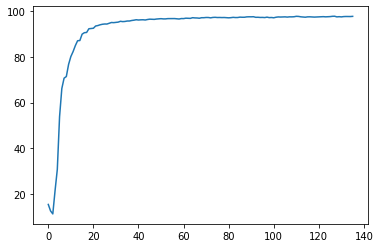

136
Power Allocated= 3.3781459960345335
CSI= 0.868930889370186
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.251595


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.209282

Power Allocated= 3.207017951560616
CSI= 0.7564482166742429
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.105386
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.265201

Power Allocated= 2.3377124416246797
CSI= 0.4563557211050303
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.158693
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.373751

Power Allocated= 0.7007316917481452
CSI= 0.26121569994954763
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.238028
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.574068

Power Allocated= 2.8056162646569653
CSI= 0.5802587021323663
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1827102418235217
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in thi

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026642

Power Allocated= 0
CSI= 0.16040414801081626
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0371762817046393
CSI= 0.286384488787397
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.305921
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.152323

Power Allocated= 3.1596379615457173
CSI= 0.730274796299458
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.096322
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075857

Power Allocated= 3.4759289319415267
CSI= 0.9496165955852227
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.077924
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057424

Power Allocated= 0
CSI= 0.005390947499855359
SNR= 18.799405815022368
Client: client13
Poor Channel, client not taken for averaging in this r

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0815, Accuracy: 9784/10000 (98%)

Power in training Round= 98.00775880007691



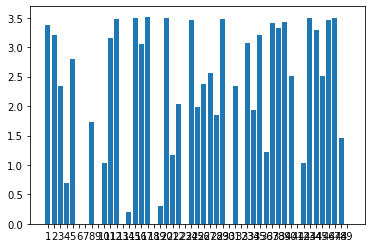

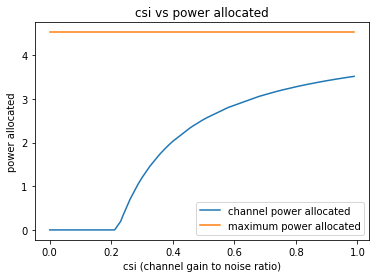

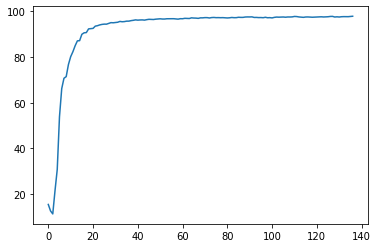

137
Power Allocated= 2.8502844150327253
CSI= 0.43687392046198636
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.678250250448702
CSI= 0.2889318235658711
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.149396


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249361

Power Allocated= 0.557084364298821
CSI= 0.21823625962934612
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.216335
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.140874

Power Allocated= 1.207563968372305
CSI= 0.25434223452069615
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.135320
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.205574

Power Allocated= 2.141953040255975
CSI= 0.33363123330565625
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.216350
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099207

Power Allocated= 4.131766721960416
CSI= 0.9925483317340515
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.142584
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068264

Power Allocated= 2.5732045652687328
CSI= 0.38970101748773667
SNR= 17.4006555

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157958

Power Allocated= 4.130271594578479
CSI= 0.991077586284104
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.105582
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075344

Power Allocated= 1.3276806525317202
CSI= 0.262357450307504
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.290331
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.190087

Power Allocated= 2.285856134282933
CSI= 0.35045686606206883
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.135191
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.072640

Power Allocated= 0
CSI= 0.15385415838079475
SNR= 18.866727777656166
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3607937786205384
CSI= 0.5622777244959088
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0810, Accuracy: 9769/10000 (98%)

Power in training Round= 97.99284839728628



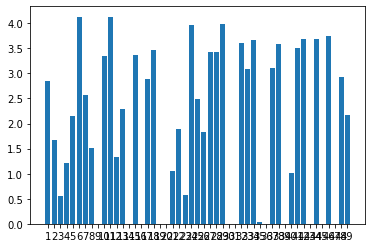

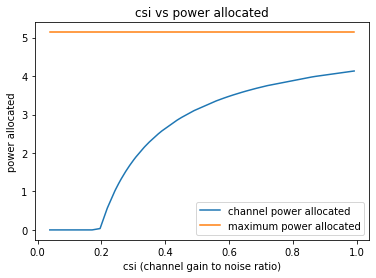

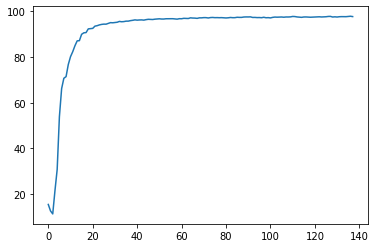

138
Power Allocated= 2.592912159956483
CSI= 0.5939948897072352
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.079624491213584
CSI= 0.45520677981424773
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.179681


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.208495

Power Allocated= 0
CSI= 0.10825991649658762
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7357096248704464
CSI= 0.3935894198509866
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.156810


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077446

Power Allocated= 2.7810052970829853
CSI= 0.6687071015712831
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.260134
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092464

Power Allocated= 3.182380909684164
CSI= 0.9140371652236485
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0010275298947047
CSI= 0.7840672533851949
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.317836
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.155681

Power Allocated= 2.668725786657337
CSI= 0.6220056104088106
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.163264
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069982

Power Allocated= 2.0062803479238815
CSI= 0.4404999185911215
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1211, Accuracy: 9770/10000 (98%)

Power in training Round= 97.99686176725233



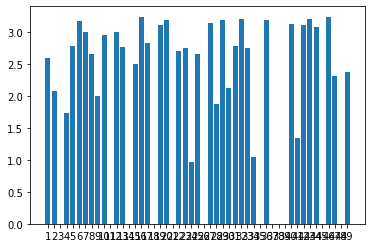

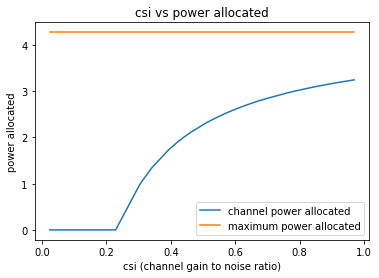

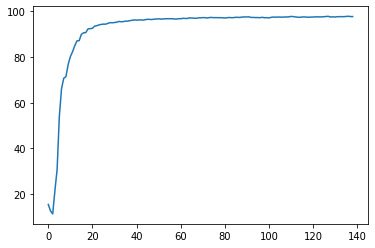

139
Power Allocated= 1.897441862348086
CSI= 0.42888944042195565
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.322623


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.101797

Power Allocated= 2.116657943125912
CSI= 0.47339807262432587
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.400742
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.297161

Power Allocated= 1.0167464038199574
CSI= 0.311303555584855
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.646972
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.477947

Power Allocated= 3.0299863918968337
CSI= 0.8339875341965316
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.317875
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.206718

Power Allocated= 0
CSI= 0.20948273073333767
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.177302552822865
CSI= 0.9508030460104295
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.197140

Power Allocated= 3.069879934852432
CSI= 0.8626898443139916
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.212506
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094072

Power Allocated= 2.813420572023338
CSI= 0.7064020107169497
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.702055
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.218714

Power Allocated= 2.526040860979049
CSI= 0.5871976051962073
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.191056
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.181859

Power Allocated= 0
CSI= 0.05669191616795055
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5516589135614498
CSI= 0.3734986054420185
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	L

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0803, Accuracy: 9768/10000 (98%)

Power in training Round= 98.00381454084891



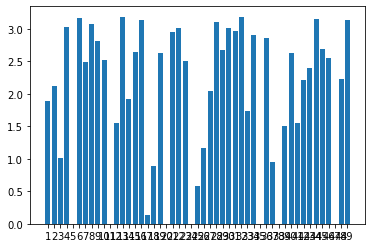

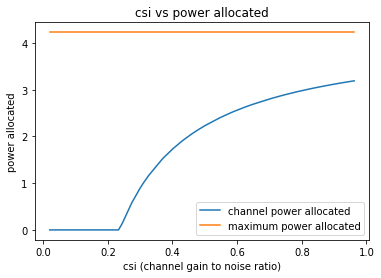

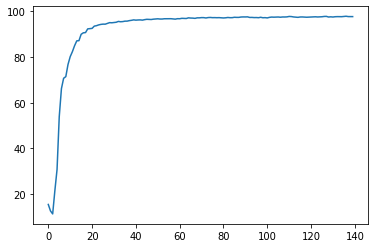

140
Power Allocated= 2.5209947323024595
CSI= 0.518406685739896
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.303956


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143607

Power Allocated= 3.2123126197352603
CSI= 0.807970088210651
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.725055723955147
CSI= 0.5797348547002547
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.041577036151004
CSI= 0.7100229576099251
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.093088
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034319

Power Allocated= 2.4854631896604555
CSI= 0.5090304520854241
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.134679
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111003

Power Allocated= 3.4243110827211103
CSI= 0.9749713949079377
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.346137393558227

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client20 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.228566

Power Allocated= 0.1759337502353331
CSI= 0.23397020687453984
SNR= 19.812066026300165
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.237191
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074516

Power Allocated= 2.407701256684251
CSI= 0.48964859768087754
SNR= 20.497019615829455
Client: client22
Model client22 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.184365
Model client22 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.140289

Power Allocated= 0
CSI= 0.0019597647802036544
SNR= 20.604825091330564
Client: client23
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.007216006584726098
SNR= 20.79815877075119
Client: client24
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.766642792611818
CSI= 0.5940572623491472
SNR= 20.820926259668504
Client: client25
Model client25 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.430382
Model client25 Train Epoch: 2 [0/1216 (0%)]	Loss

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0810, Accuracy: 9772/10000 (98%)

Power in training Round= 97.99383353763358



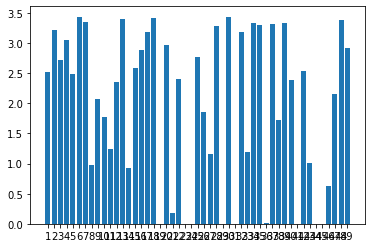

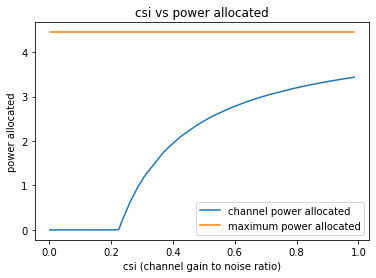

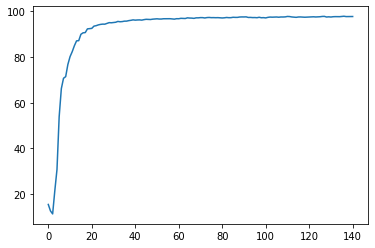

141
Power Allocated= 3.530667751135323
CSI= 0.8360339299666945
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.109002


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091376

Power Allocated= 0
CSI= 0.060788960927864344
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7048462796336659
CSI= 0.33091268779304084
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18701409764093602
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.466779420030213
CSI= 0.7936432137715699
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.353355


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.125923

Power Allocated= 2.209192746162005
CSI= 0.39720388992179323
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.342791
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073389

Power Allocated= 2.0208645406699537
CSI= 0.36955913150795927
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.079579
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094301

Power Allocated= 2.82461330613828
CSI= 0.5257131153275071
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.396864
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.243149

Power Allocated= 3.6005429862473353
CSI= 0.8879035387543655
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.125583
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.126658

Power Allocated= 3.2734837996194956
CSI= 0.688085552300229
SNR= 18.1878203886

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0778, Accuracy: 9781/10000 (98%)

Power in training Round= 98.00563479936679



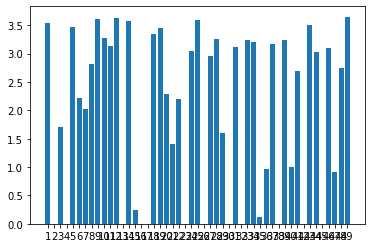

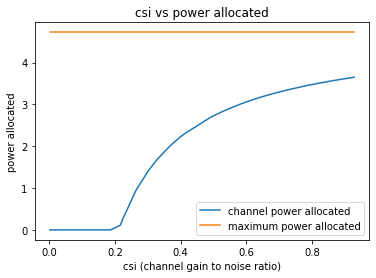

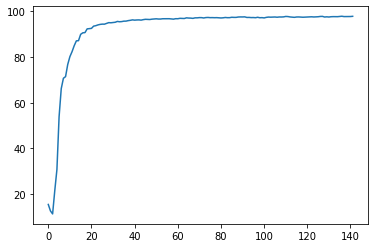

142
Power Allocated= 3.0154161896955616
CSI= 0.7292252875740756
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.145585


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.087796

Power Allocated= 2.2769544832426463
CSI= 0.47398306222889297
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.257991
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.064674

Power Allocated= 1.5751146451525448
CSI= 0.3556668562438269
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.431458
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.167805

Power Allocated= 0
CSI= 0.04903424849790616
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.11683339624159
CSI= 0.3058196452229205
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.164157


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105083

Power Allocated= 2.2764023415529655
CSI= 0.4738590505627802
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.408815
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.117521

Power Allocated= 2.91844595794032
CSI= 0.6810650367799463
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235215
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039730

Power Allocated= 2.7372900995212612
CSI= 0.6062647463111307
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.191920
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188379

Power Allocated= 0
CSI= 0.04747027070678045
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.207460814593988
CSI= 0.847979565559644
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0778, Accuracy: 9774/10000 (98%)

Power in training Round= 98.00178243631021



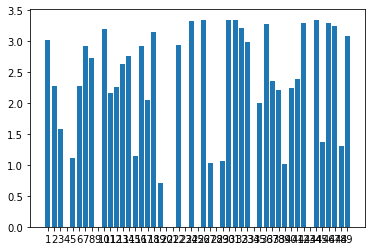

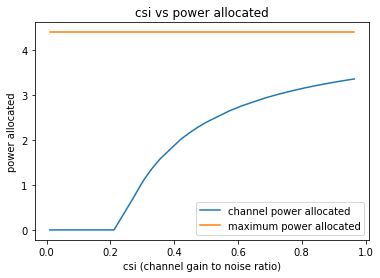

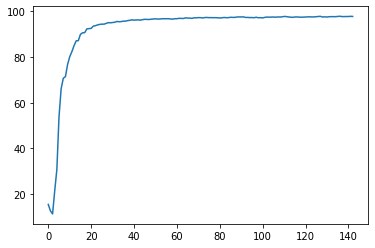

143
Power Allocated= 2.1870329232560897
CSI= 0.5150801775725761
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.190180


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028702

Power Allocated= 2.431629323830472
CSI= 0.5893276583141475
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.241936
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.147393

Power Allocated= 2.798772231923867
CSI= 0.7520459347632529
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.129287
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.267484

Power Allocated= 3.119498440291949
CSI= 0.9911001165684493
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.157965
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153243

Power Allocated= 2.0772864117216536
CSI= 0.4875214423098193
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.305925
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.149382

Power Allocated= 2.9322018445210896
CSI= 0.8359272166016872
SNR= 17.04968172980

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114457

Power Allocated= 1.734637283751789
CSI= 0.4177386957015794
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.149109
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057069

Power Allocated= 2.2685631491673006
CSI= 0.5376589519375631
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.156374
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137519

Power Allocated= 0.768446815239419
CSI= 0.29761626387234674
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.397471
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021412

Power Allocated= 3.1072419396352773
CSI= 0.9792052992862239
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.200872
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109264

Power Allocated= 0
CSI= 0.09622772661556644
SNR= 19.007703328

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1014, Accuracy: 9774/10000 (98%)

Power in training Round= 97.99313156417537



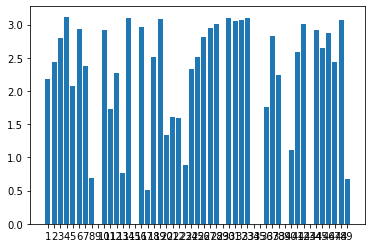

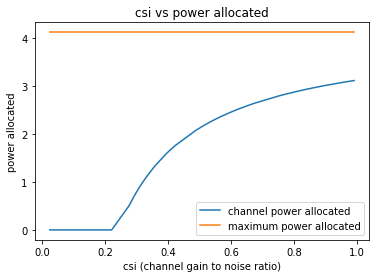

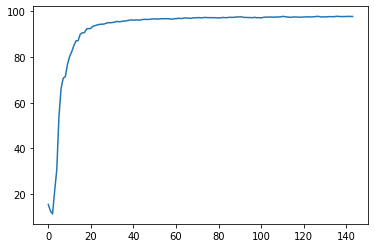

144
Power Allocated= 3.7595816323791906
CSI= 0.9048315801817466
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1500568950663648
CSI= 0.583191447682937
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.212267


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.364226

Power Allocated= 3.3032688929825342
CSI= 0.6404136404490506
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.171010
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124926

Power Allocated= 3.41210278152238
CSI= 0.6883937979075876
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.14629322566400393
CSI= 0.21193326465132234
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.389686
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091802

Power Allocated= 3.586140592508498
CSI= 0.7820937518458546
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08023827755810486
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04447424092344521
SNR

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.128375

Power Allocated= 2.6802943647516284
CSI= 0.45777792516109694
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.121316
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044082

Power Allocated= 3.0006240847545906
CSI= 0.5364416634083596
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.151979
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040639

Power Allocated= 0
CSI= 0.0869868160710614
SNR= 18.799405815022368
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8189216819821294
CSI= 0.4887972559619037
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.101388
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.173392

Power Allocated= 3.143190713482647
CSI= 0.5808654889477871
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0900, Accuracy: 9783/10000 (98%)

Power in training Round= 98.00690112279233



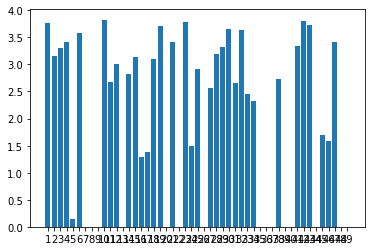

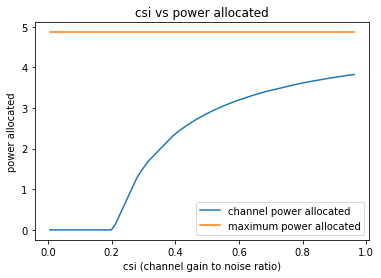

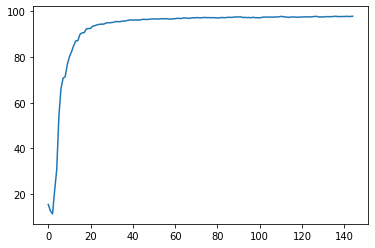

145
Power Allocated= 3.1293963923356705
CSI= 0.955732702630191
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.251643


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.121965

Power Allocated= 3.0778255874936598
CSI= 0.9108393400512376
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.373930
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.278612

Power Allocated= 0
CSI= 0.19339403816418932
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1349878227697827
CSI= 0.9608674948506797
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6963584393929523
CSI= 0.6759699931433433
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.314458


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.339084

Power Allocated= 2.7277226929071476
CSI= 0.6906118583530412
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.232601
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085925

Power Allocated= 2.578176218108678
CSI= 0.6259632678806865
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.434228
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.379947

Power Allocated= 2.2958471939446046
CSI= 0.531952567981153
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.486252
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.377372

Power Allocated= 2.671328078129311
CSI= 0.6647230302756244
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.416643
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.246722

Power Allocated= 0.5598616266078906
CSI= 0.2765599597848649
SNR= 18.18782038869

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0798, Accuracy: 9777/10000 (98%)

Power in training Round= 98.00042782984437



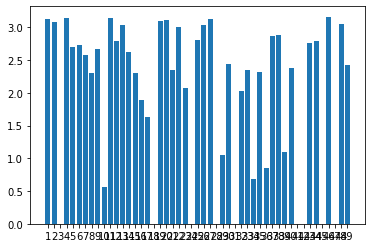

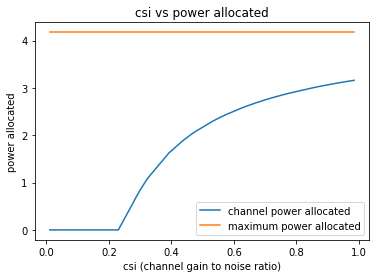

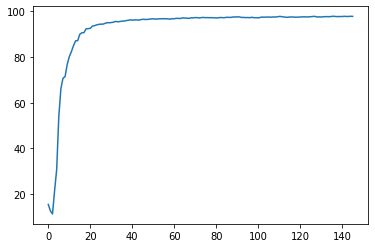

146
Power Allocated= 0
CSI= 0.18722790684744728
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6013489737462536
CSI= 0.33167166507562085
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.324112642305736
CSI= 0.43624949381074596
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.539672756812669
CSI= 0.9287585055847394
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.336096


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052825

Power Allocated= 3.4596240708314934
CSI= 0.8644874126137533
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.749264653478543
CSI= 0.34878275147033333
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.463189
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.187879

Power Allocated= 2.447752326378889
CSI= 0.46112134124634163
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7220493680086024
CSI= 0.5278912547030145
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.207773
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.205324

Power Allocated= 3.6090621494664497
CSI= 0.9927363832466372
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.243622
Model client9 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1219, Accuracy: 9770/10000 (98%)

Power in training Round= 98.00044129019507



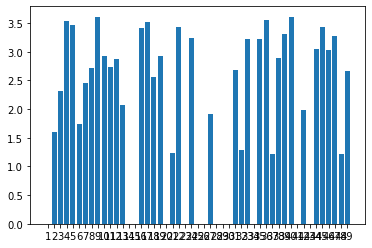

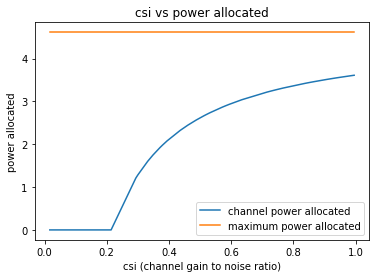

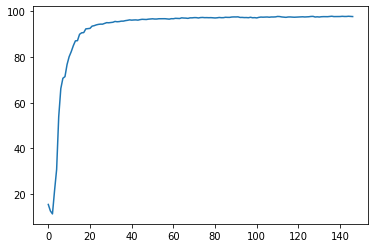

147
Power Allocated= 1.3934598986593314
CSI= 0.25782650291206344
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.460670


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.126782

Power Allocated= 0
CSI= 0.18453958389411573
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4281003956743659
CSI= 0.26014996421133274
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.367269


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175188

Power Allocated= 4.225000211071599
CSI= 0.9550761736410096
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.149471
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089481

Power Allocated= 3.9529407588380163
CSI= 0.7580947329748661
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.286161
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.165326

Power Allocated= 0
CSI= 0.14500268451886766
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.028327927655853
CSI= 0.44569055810687663
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.386856
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.132367

Power Allocated= 0
CSI= 0.17620023505790394
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1227, Accuracy: 9762/10000 (98%)

Power in training Round= 97.99289158645425



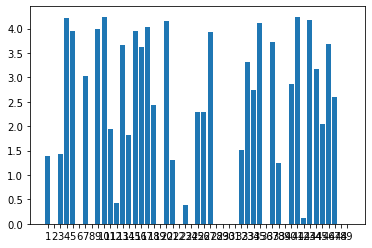

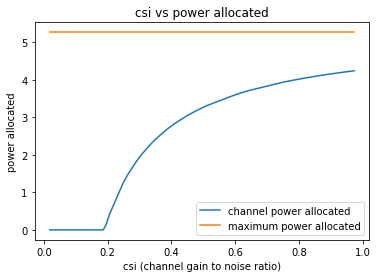

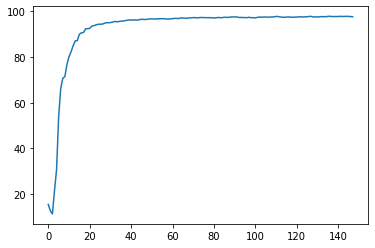

148
Power Allocated= 1.2137843848824126
CSI= 0.29334144142943575
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.268577


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.093257

Power Allocated= 3.599190001414791
CSI= 0.9769526478771159
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0956477999455344
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5653333597737564
CSI= 0.9456732422543376
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.207492


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.166140

Power Allocated= 3.2288355953463093
CSI= 0.7173881774474985
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.441564
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.185786

Power Allocated= 3.5204258091981817
CSI= 0.9071485754306824
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.302599
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.243356

Power Allocated= 3.5263189874864938
CSI= 0.9120242463710672
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.891005226949575
CSI= 0.366062246410759
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.200189
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.087235

Power Allocated= 0
CSI= 0.08122177815038567
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in thi

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0825, Accuracy: 9750/10000 (98%)

Power in training Round= 98.00322663312957



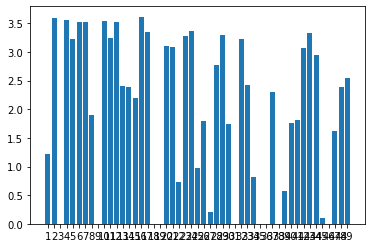

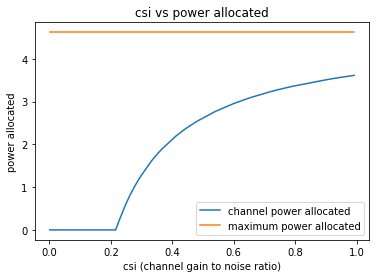

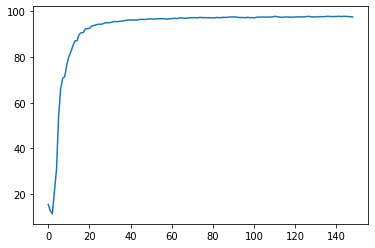

149
Power Allocated= 0
CSI= 0.041293500548030715
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1521038417861016
CSI= 0.5613892411483248
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.439642


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.198023

Power Allocated= 1.4803325047401854
CSI= 0.2895976573115959
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.118599
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032536

Power Allocated= 0.5136933007557039
CSI= 0.2262594033880002
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.297208
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100295

Power Allocated= 3.7874496895220675
CSI= 0.8726388620605376
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.223686
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069845

Power Allocated= 0
CSI= 0.18600632594357958
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.8478919723015
CSI= 0.9212283949494653
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0847, Accuracy: 9760/10000 (98%)

Power in training Round= 97.99204446458687



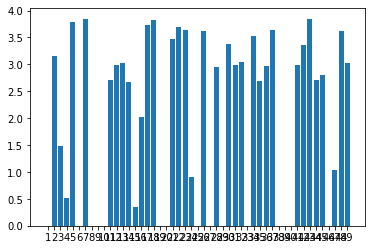

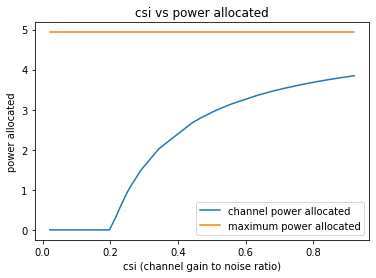

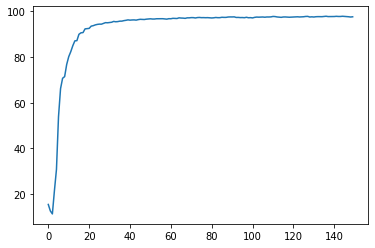

150
Power Allocated= 3.259073902028848
CSI= 0.9752137302273156
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.483468034109495
CSI= 0.5552402680563535
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.77658931951743
CSI= 0.6631735871844127
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.365414


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109976

Power Allocated= 2.848859585950715
CSI= 0.6965580338394092
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.241825
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.583854

Power Allocated= 0
CSI= 0.18823868840824598
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6104525444259856
CSI= 0.5973581473050674
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.318624


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.205225

Power Allocated= 3.271896805518596
CSI= 0.9875632796947
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4088337531631017
CSI= 0.347746692756694
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.564787
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.211541

Power Allocated= 0
CSI= 0.20509528534255494
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9417145789299957
CSI= 0.42684413060965276
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.266413
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.190796

Power Allocated= 3.2610109775522065
CSI= 0.9770594567508312
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1139735236586406
CSI= 0.85

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0842, Accuracy: 9763/10000 (98%)

Power in training Round= 97.99514717801478



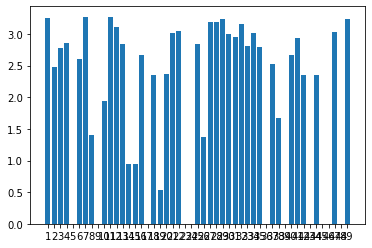

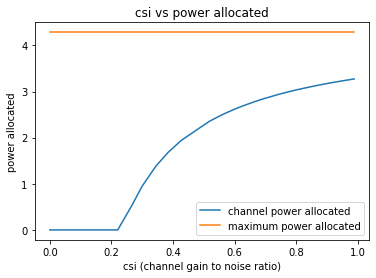

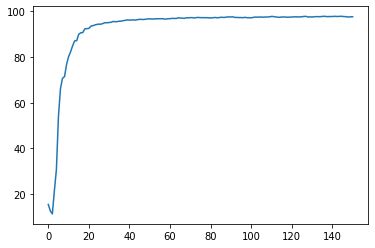

151
Power Allocated= 3.1221324689082315
CSI= 0.7017664167631379
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.414410228423342
CSI= 0.8828480027141267
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.655977839888572
CSI= 0.5287843218398651
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.381820


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052225

Power Allocated= 2.835365413965152
CSI= 0.5841999756311149
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.121261
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091405

Power Allocated= 2.124327345846938
CSI= 0.4127488726930343
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.548642
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.310463

Power Allocated= 0.6509716771804568
CSI= 0.25666452789635463
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.198293
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040332

Power Allocated= 1.8674434669485054
CSI= 0.37318103553802917
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263124
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249110

Power Allocated= 2.4327670012784894
CSI= 0.4729605971899904
SNR= 18.04965036

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.169069

Power Allocated= 0
CSI= 0.03740434009838034
SNR= 19.00770332812949
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19332057494050503
SNR= 19.038283273448883
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09177945962264633
SNR= 19.130844735393737
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15029640579792647
SNR= 19.30637432921484
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.343216877843667
CSI= 0.8306398717976923
SNR= 19.748614351489568
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.265143
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.206232

Power Allocated= 3.452564508161625
CSI= 0.9136228679470273
SNR= 19.786175810637378
Client: client20
Model client20 Train Epoch: 1 [0/1216 (0%)]

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0905, Accuracy: 9767/10000 (98%)

Power in training Round= 98.00219104351078



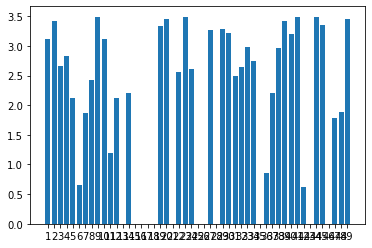

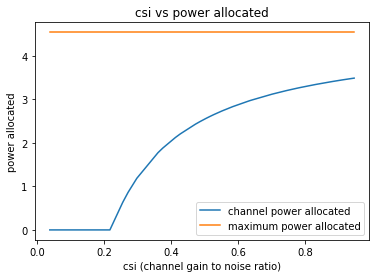

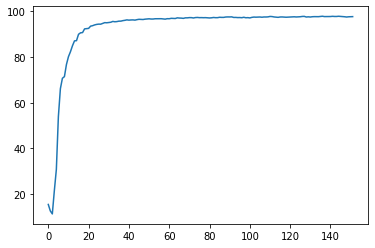

152
Power Allocated= 0.5184263847649015
CSI= 0.2560959388868326
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.284537


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.506748

Power Allocated= 1.768166586217423
CSI= 0.3766412468518714
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.290335
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.103790

Power Allocated= 3.2170330276101886
CSI= 0.8290636594051616
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.071687071656849
CSI= 0.739904401976763
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04940820900061782
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.920488007526108
CSI= 0.39956447242142046
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.174223


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057639

Power Allocated= 2.5151816118736514
CSI= 0.5241003867779415
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.157590
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137431

Power Allocated= 2.6333828335373877
CSI= 0.558712221125698
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.503151
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.065553

Power Allocated= 1.553769542523764
CSI= 0.34849963317750987
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.178804
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113809

Power Allocated= 2.9207161822570873
CSI= 0.6655588042443656
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.268886
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.167761

Power Allocated= 2.931063200078594
CSI= 0.6701739901378226
SNR= 18.237505

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0810, Accuracy: 9769/10000 (98%)

Power in training Round= 97.99841307888683



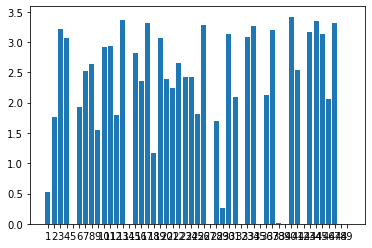

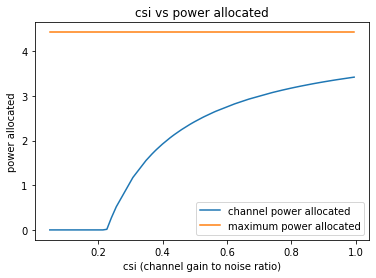

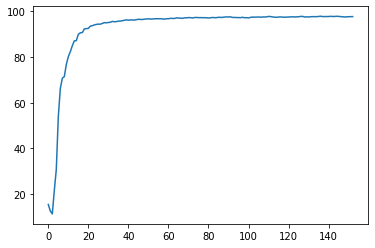

153
Power Allocated= 2.6697018305339437
CSI= 0.7309450382243734
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.079365


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174992

Power Allocated= 2.7674457606748435
CSI= 0.7871858804044385
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.147851
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.126692

Power Allocated= 2.043352804972175
CSI= 0.501393637523257
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.137264
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048293

Power Allocated= 2.970179704670063
CSI= 0.9366680822967869
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.192535
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077285

Power Allocated= 2.9351588888825226
CSI= 0.9069185418678355
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.288133
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029171

Power Allocated= 2.1625446696281667
CSI= 0.53326249335934
SNR= 17.0496817298093

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.210478

Power Allocated= 0
CSI= 0.012073640059846902
SNR= 19.748614351489568
Client: client19
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4737546928633485
CSI= 0.6393702227316092
SNR= 19.786175810637378
Client: client20
Model client20 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.367866
Model client20 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.123926

Power Allocated= 2.497141699700707
CSI= 0.6490758248321076
SNR= 19.812066026300165
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.180314
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.215977

Power Allocated= 0
CSI= 0.06128362182895186
SNR= 20.497019615829455
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8242384627880055
CSI= 0.8240250864160414
SNR= 20.604825091330564
Client: client23
Model client23 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.207257
Model client23 Train Epoch: 2 [0/1216 (0%)]	Loss: 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1109, Accuracy: 9768/10000 (98%)

Power in training Round= 98.0056666882638



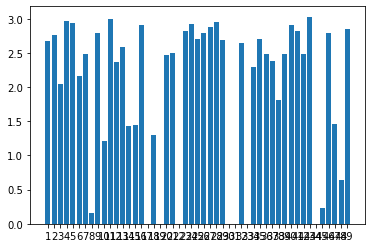

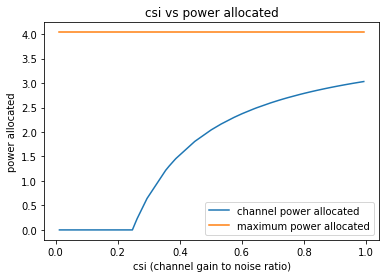

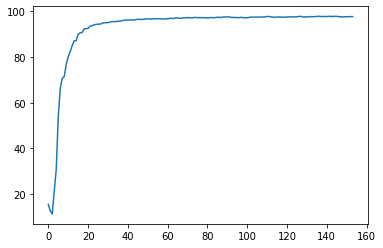

154
Power Allocated= 2.573514771226046
CSI= 0.624006255701623
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.276947


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.276490

Power Allocated= 2.989580042772035
CSI= 0.8428272447939256
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.224000
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035740

Power Allocated= 1.4243805979802358
CSI= 0.36341405863078746
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.042975234364580506
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1586114478215905
CSI= 0.9828479661566346
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1440595776632136
CSI= 0.968989214973777
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.238062


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031681

Power Allocated= 2.9838025105844483
CSI= 0.8387430179300537
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.736911
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075545

Power Allocated= 0
CSI= 0.08282358734213868
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02968212348970045
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6877368088512936
CSI= 0.671895808164338
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220440
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.221683

Power Allocated= 0
CSI= 0.2098312550355954
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0766158308453853
CSI= 0.9095481826705037
SNR= 18.5953027

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0980, Accuracy: 9776/10000 (98%)

Power in training Round= 98.00039442561166



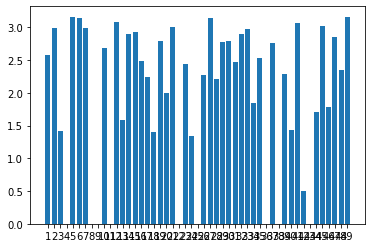

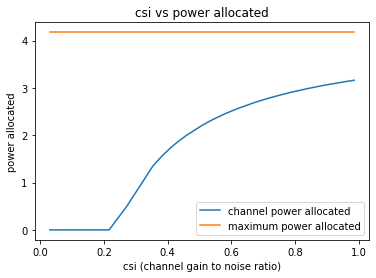

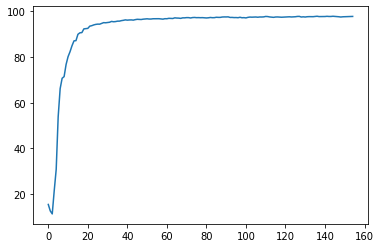

155
Power Allocated= 1.3614973122590284
CSI= 0.33206864443491857
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.188584


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.500191

Power Allocated= 2.873330759438071
CSI= 0.6668480038877792
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.705904
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.230150

Power Allocated= 2.462373976139261
CSI= 0.5234097947393311
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03861709303844718
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03137250628925292
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1315889142538724
CSI= 0.8055849935505045
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.384103


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073072

Power Allocated= 2.746117703523186
CSI= 0.6147017637667763
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.136891
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037420

Power Allocated= 0
CSI= 0.1190018261525908
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3212642930105956
CSI= 0.9508789542809319
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.345081815551751
CSI= 0.9729130820418952
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0402810225168504
CSI= 0.7503891673227958
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.375290
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.133595

Power Allocated= 2.954239826888561
CSI= 0.70

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0783, Accuracy: 9786/10000 (98%)

Power in training Round= 98.00554376142549



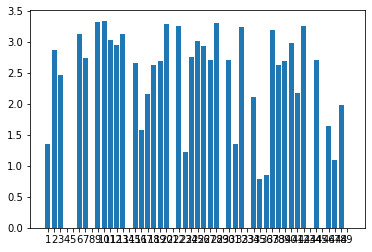

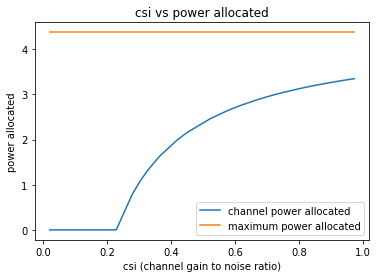

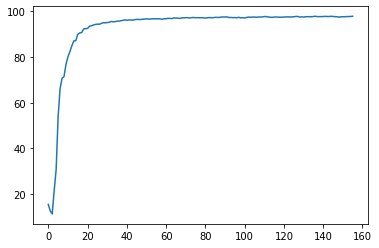

156
Power Allocated= 2.266163648165102
CSI= 0.4491960734980035
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.720344


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083715

Power Allocated= 0
CSI= 0.2191808927261215
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1447999149785595
CSI= 0.7420802957449881
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.239690


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.208432

Power Allocated= 1.8486047346298884
CSI= 0.37824941090706776
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.762120
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.102325

Power Allocated= 3.148521177691766
CSI= 0.7441352070626732
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4991104789841208
CSI= 0.334084745166649
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.099236
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074790

Power Allocated= 3.0132826711863956
CSI= 0.6760958090379466
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.118179
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.261446

Power Allocated= 3.081195353908128
CSI= 0.7086330351083401
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0766, Accuracy: 9787/10000 (98%)

Power in training Round= 97.9943312265915



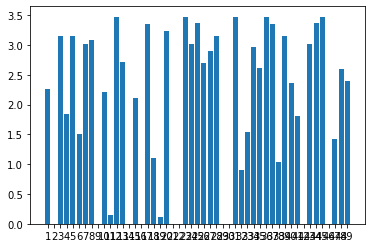

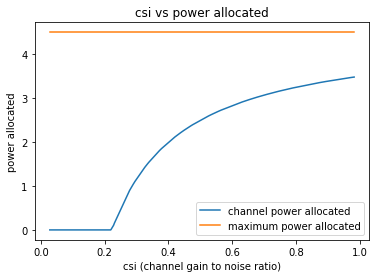

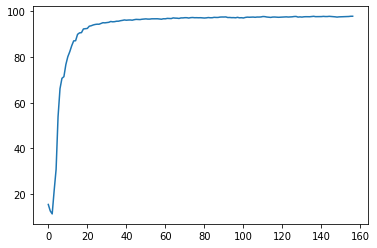

157
Power Allocated= 0
CSI= 0.21526875420869918
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.01652573659634
CSI= 0.7526405693706294
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.971942213314594
CSI= 0.7282053699494766
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07493830548405656
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.194849381485205
CSI= 0.46504450808657394
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.112443


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153148

Power Allocated= 2.7803041478707904
CSI= 0.6390278408374734
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5265432313616776
CSI= 0.5498620508935004
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.116287
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119997

Power Allocated= 2.8678869541291405
CSI= 0.6769132194337661
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.090930
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188000

Power Allocated= 2.2740819176525924
CSI= 0.48283537703535606
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.157511
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.197524

Power Allocated= 3.2845436019115937
CSI= 0.9428291127961826
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0853, Accuracy: 9784/10000 (98%)

Power in training Round= 97.99569948819966



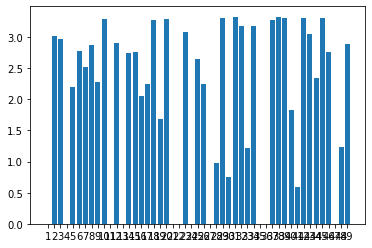

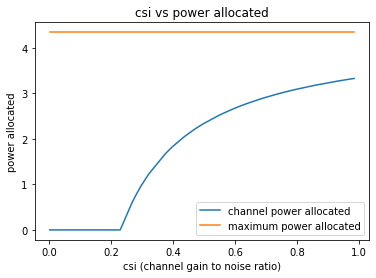

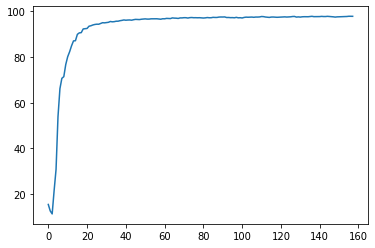

158
Power Allocated= 2.7469373023515855
CSI= 0.5358958087438503
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.200501


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.374978

Power Allocated= 0
CSI= 0.14227141585924774
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.865837473787357
CSI= 0.5723658769491085
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.327591


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.230499

Power Allocated= 2.689101252018907
CSI= 0.5197855257562172
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4104607036552794
CSI= 0.45402724998667265
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.181729
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.180972

Power Allocated= 3.5874471570670075
CSI= 0.9751107664349024
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.911713309042843
CSI= 0.3701978352390257
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.395267
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.098275

Power Allocated= 2.1500104212155122
CSI= 0.4060153191259426
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.264687
Model client8 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1382, Accuracy: 9782/10000 (98%)

Power in training Round= 98.00091565612124



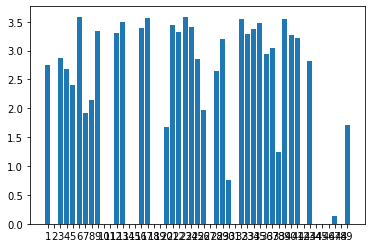

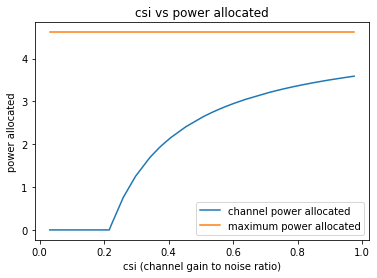

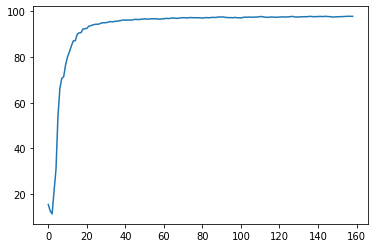

159
Power Allocated= 2.3697798354049
CSI= 0.5117750303752148
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.410260


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.186093

Power Allocated= 3.142111694798994
CSI= 0.8462730536377655
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.295782
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.280067

Power Allocated= 0
CSI= 0.005687612107767692
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1888387635388188
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.067375424400793
CSI= 0.795932479857106
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7245279442531443
CSI= 0.6252987914403321
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.234841


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.061143

Power Allocated= 2.7799168262887544
CSI= 0.6477327570322466
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.264537
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.181477

Power Allocated= 0
CSI= 0.12221601261659598
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.299107046424372
CSI= 0.9759369499165889
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.282153
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076182

Power Allocated= 3.0660476498415905
CSI= 0.7950922113827844
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.507196
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.219570

Power Allocated= 3.096515814026327
CSI= 0.8148315046133453
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Lo

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1265, Accuracy: 9782/10000 (98%)

Power in training Round= 97.99578750386415



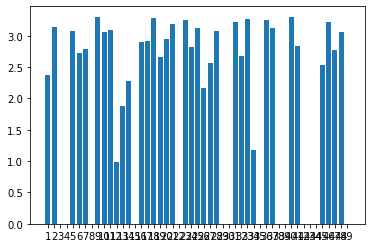

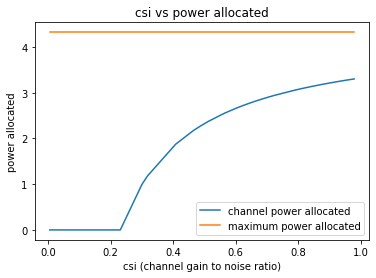

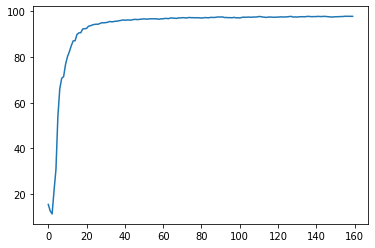

160
Power Allocated= 1.879462579604593
CSI= 0.41725777803564057
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.459290


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159894

Power Allocated= 0
CSI= 0.09101047057489464
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.857850307972428
CSI= 0.7051130529072768
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.296400


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.138129

Power Allocated= 0.8614180564189398
CSI= 0.29285625100389134
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.024178
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.218571

Power Allocated= 3.1431596293588946
CSI= 0.882688124703053
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.239785
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.117040

Power Allocated= 3.244166159715008
CSI= 0.969089493336184
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.393912
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.244648

Power Allocated= 2.9786347933774415
CSI= 0.7707557936523414
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.261352
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062449

Power Allocated= 2.0930812101270826
CSI= 0.45808910874178455
SNR= 18.049650368

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0811, Accuracy: 9746/10000 (97%)

Power in training Round= 97.99708592541596



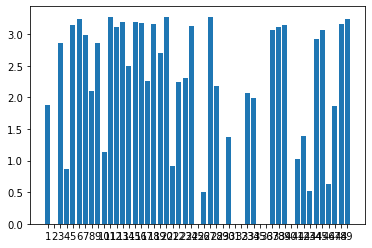

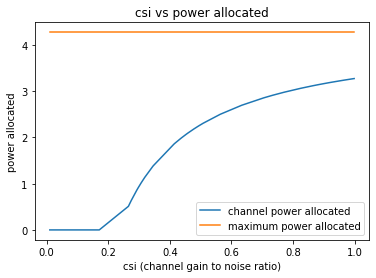

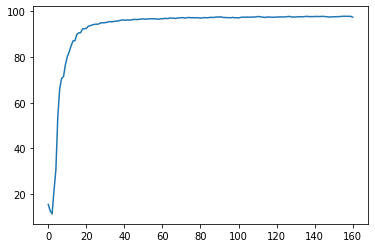

161
Power Allocated= 1.4135077824622342
CSI= 0.3278709078035891
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.829009640073062
CSI= 0.6118157444252861
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.48816641611922496
CSI= 0.2515519341482947
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.223654


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040570

Power Allocated= 3.0460107626394333
CSI= 0.7054783710769765
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.323201
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.399558

Power Allocated= 3.3589408145049964
CSI= 0.9053478322362003
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15047884837396264
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9552443078120536
CSI= 0.6630225379151513
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.255569


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095130

Power Allocated= 3.2887280952259497
CSI= 0.8512372883921445
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.131105
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027137

Power Allocated= 2.974081508683876
CSI= 0.6714080815828093
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.140062
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067173

Power Allocated= 2.1974843454053863
CSI= 0.4413054257445548
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.145100
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033144

Power Allocated= 2.8840654268888932
CSI= 0.6331425151293483
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.057249
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159214

Power Allocated= 1.5121311577314067
CSI= 0.33882713236306417
SNR= 18.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0812, Accuracy: 9762/10000 (98%)

Power in training Round= 98.00545529038824



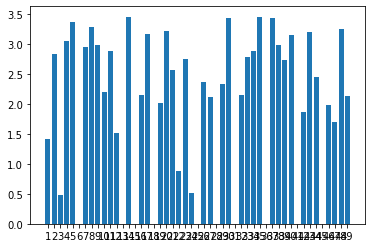

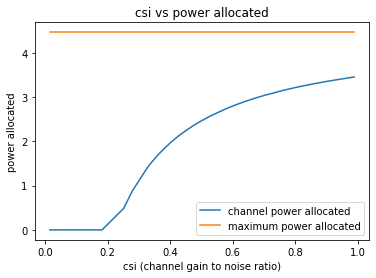

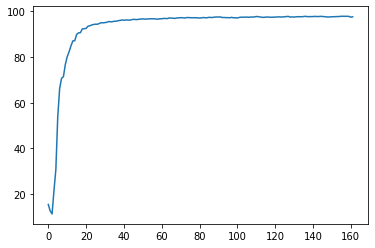

162
Power Allocated= 2.1006197499585326
CSI= 0.45414581280736
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.167578


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.326144

Power Allocated= 2.630983557713578
CSI= 0.5982392048038351
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2729446956688046
CSI= 0.9712405735921996
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.182889
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107017

Power Allocated= 1.8438414900055227
CSI= 0.40671664424223586
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.201419
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114404

Power Allocated= 2.3510638934462866
CSI= 0.5124284854121747
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.224129
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136484

Power Allocated= 2.9111100824546456
CSI= 0.718677017904737
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024669

Power Allocated= 0
CSI= 0.026378278217197404
SNR= 18.866727777656166
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0574985329868607
CSI= 0.8031759600757202
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.172531
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.104393

Power Allocated= 1.8847777664467
CSI= 0.4136029114325557
SNR= 19.038283273448883
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.244678
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.084613

Power Allocated= 3.1949028623702036
CSI= 0.9028099325793293
SNR= 19.130844735393737
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.174285
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028324

Power Allocated= 2.5279697668664474
CSI= 0.5635117303315604
SNR= 19.30637432921484
Client: client18
Model client18 Train Epoch: 1 [0/1216 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0767, Accuracy: 9772/10000 (98%)

Power in training Round= 98.00064174412591



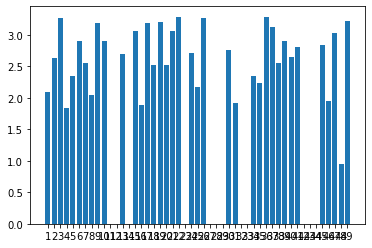

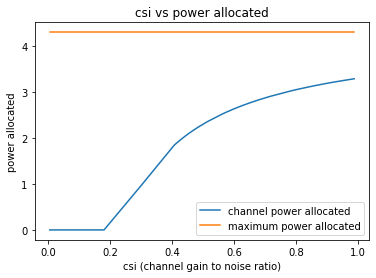

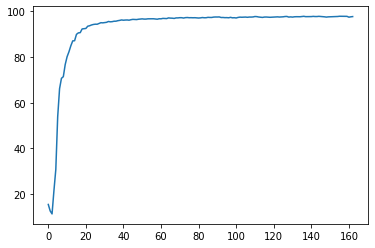

163
Power Allocated= 2.8885871206873386
CSI= 0.5163325869602053
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.123742


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.108595

Power Allocated= 1.5644192523375162
CSI= 0.30666342413255554
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.287815
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146193

Power Allocated= 0
CSI= 0.1493145958713017
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4935543326029284
CSI= 0.7508809913640876
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4109304640988292
CSI= 0.2928778406700022
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.131000


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074928

Power Allocated= 0.2063773210241191
CSI= 0.21649960949414915
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.199878
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112032

Power Allocated= 0.9875681351526437
CSI= 0.2605689935693857
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.253840
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.262288

Power Allocated= 0.29003506897027087
CSI= 0.22049315276024561
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.264861
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.166417

Power Allocated= 0
CSI= 0.1542817254209945
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16646330916580565
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Po

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0793, Accuracy: 9776/10000 (98%)

Power in training Round= 98.0032434506302



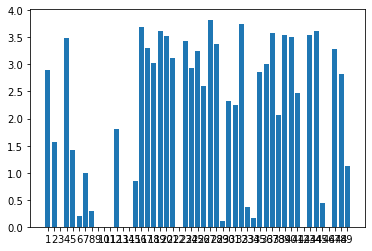

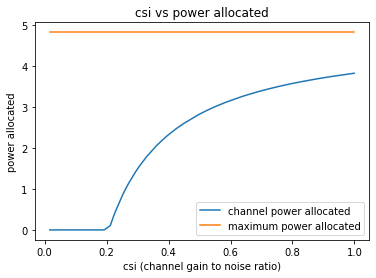

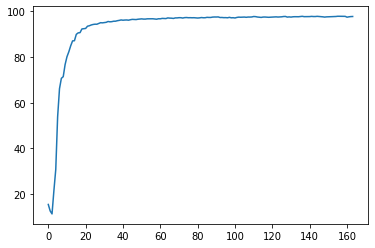

164
Power Allocated= 2.256367737999156
CSI= 0.4243394419080809
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.141442


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050349

Power Allocated= 3.3117321007882703
CSI= 0.7684979912826742
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.198091979341866
CSI= 0.7067738706771649
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0905511716083145
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0423567354697414
CSI= 0.2800638031700702
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.115769


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189800

Power Allocated= 3.4522196302499424
CSI= 0.861510434856567
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.053867
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036081

Power Allocated= 2.715692604988938
CSI= 0.5270705902428823
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.153845
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.080797

Power Allocated= 3.14207893411342
CSI= 0.6798592251373332
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.192344
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070072

Power Allocated= 2.204015679391305
CSI= 0.4151175867308168
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.121173
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112679

Power Allocated= 3.108608336700799
CSI= 0.6647330293427257
SNR= 18.18782038869102

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0748, Accuracy: 9784/10000 (98%)

Power in training Round= 98.0066454745537



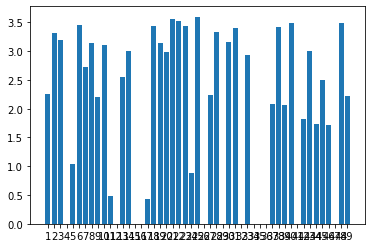

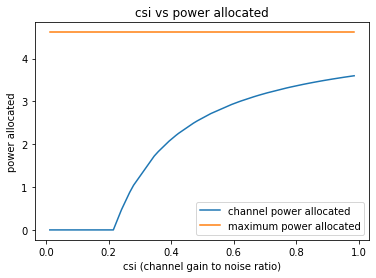

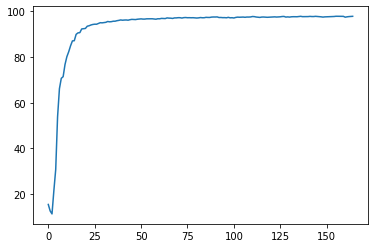

165
Power Allocated= 1.863063534078452
CSI= 0.3975189096328754
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18271522880030677
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0717762721325435
CSI= 0.7651748354729132
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.164009


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.084725

Power Allocated= 3.118724968299789
CSI= 0.7936872242565036
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.084193
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.431121

Power Allocated= 3.1231868494860144
CSI= 0.7965079281242702
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.324059
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054744

Power Allocated= 2.882012791319151
CSI= 0.668156949581671
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.258700
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.207683

Power Allocated= 3.160959338767265
CSI= 0.8212150765075581
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19397149159351856
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0770, Accuracy: 9783/10000 (98%)

Power in training Round= 97.99611005876362



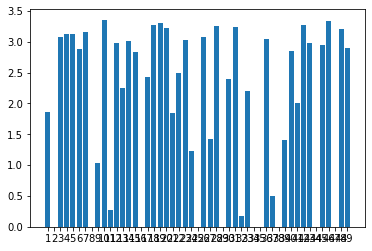

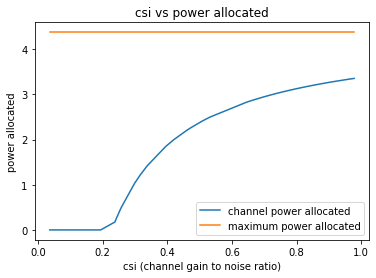

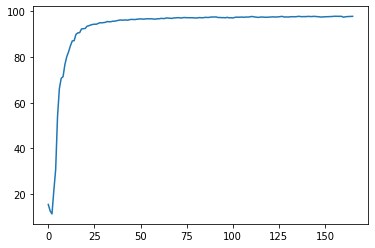

166
Power Allocated= 2.9244205593376322
CSI= 0.7883627826724933
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220446


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159092

Power Allocated= 0
CSI= 0.061957205040252816
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4715498367829767
CSI= 0.5809487341562971
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.330707


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.204537

Power Allocated= 2.6201093403049613
CSI= 0.6358237965464094
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.104548
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095417

Power Allocated= 1.330041666495584
CSI= 0.3493046539601312
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.266652
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195102

Power Allocated= 3.0964205631995743
CSI= 0.9120329996964046
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.315566
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.201453

Power Allocated= 2.4237724889788637
CSI= 0.5652592900559089
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.129935
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049194

Power Allocated= 0
CSI= 0.15672788229949175
SNR= 18.049650368948967
Client: c

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0816, Accuracy: 9782/10000 (98%)

Power in training Round= 98.00326137116079



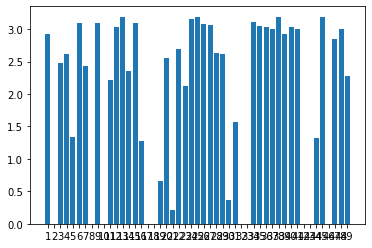

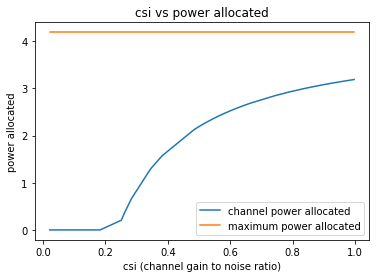

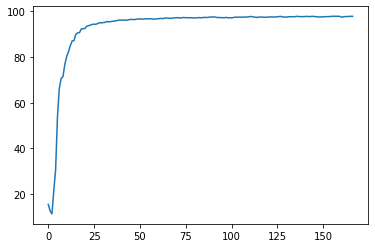

167
Power Allocated= 2.8218937776986426
CSI= 0.5700128603282333
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.022086402598764
CSI= 0.6434369794753328
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.215719


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249938

Power Allocated= 0.7029902965131352
CSI= 0.25818112307887087
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.606226
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.401910

Power Allocated= 3.4139967041335613
CSI= 0.860404929810339
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.167457
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.086450

Power Allocated= 3.369379693518489
CSI= 0.8285962021916069
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3269259127659776
CSI= 0.8004391219793509
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.127438
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068081

Power Allocated= 2.6981195713871466
CSI= 0.5324471737788625
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122286

Power Allocated= 0
CSI= 0.1608842952197116
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8726902628397522
CSI= 0.3698840552746635
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.203909
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.134826

Power Allocated= 0
CSI= 0.011632904247904308
SNR= 18.799405815022368
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3647386714444547
CSI= 0.4521814724904274
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.078024
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.259172

Power Allocated= 0
CSI= 0.10140260710392779
SNR= 19.00770332812949
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09418153761054293
SNR= 19.03828327344888

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0760, Accuracy: 9786/10000 (98%)

Power in training Round= 97.9963495412678



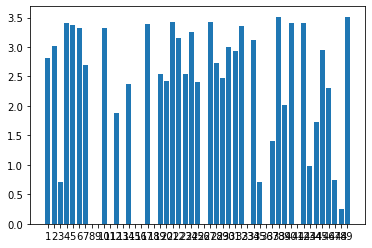

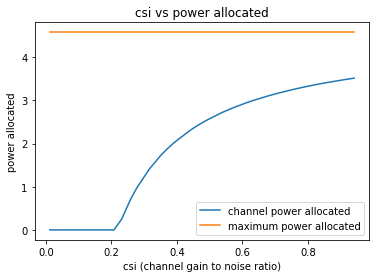

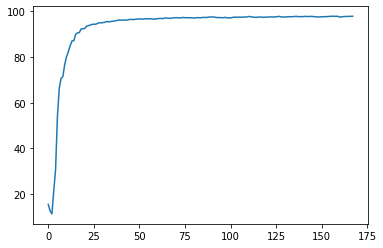

168
Power Allocated= 0.44579532901302343
CSI= 0.24193283501785068
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.399798


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.232925

Power Allocated= 2.6676479547948064
CSI= 0.5231422537588231
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3634097064505086
CSI= 0.8225279139668423
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.127117
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057273

Power Allocated= 0
CSI= 0.21452372302429157
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17531116941093128
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2511707295730776
CSI= 0.75301024082492
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.143401


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195623

Power Allocated= 3.3916961059393045
CSI= 0.8421209985263469
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.312419
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069608

Power Allocated= 2.9191335833457313
CSI= 0.6023950019233411
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.097066
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094008

Power Allocated= 2.3836949284000752
CSI= 0.45548147132393135
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.151843
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.154095

Power Allocated= 0
CSI= 0.12080119813233325
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17517886313827402
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

P

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0738, Accuracy: 9792/10000 (98%)

Power in training Round= 97.99762444086868



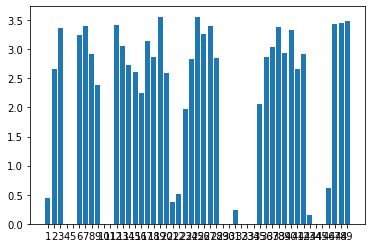

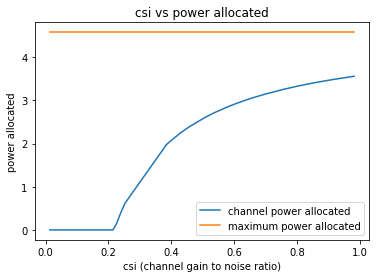

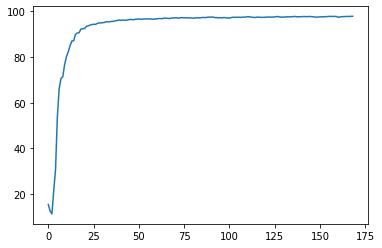

169
Power Allocated= 2.558742742409874
CSI= 0.598309523979162
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.089459


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030662

Power Allocated= 2.8409946938616666
CSI= 0.7198782688671119
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1991207879403225
CSI= 0.9699343105050791
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5340037554096018
CSI= 0.5895827723972142
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.280121
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112461

Power Allocated= 1.7574678299960578
CSI= 0.4044243026543022
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.631333
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048125

Power Allocated= 3.2192530401351434
CSI= 0.9892513848554686
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.289491
Model client6 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client20 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.166658

Power Allocated= 2.873403711993628
CSI= 0.7370746236570127
SNR= 19.812066026300165
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.188597
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.469867

Power Allocated= 3.110922789383782
CSI= 0.8934988234503904
SNR= 20.497019615829455
Client: client22
Model client22 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.352394
Model client22 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060161

Power Allocated= 3.130186855690562
CSI= 0.9091474517592869
SNR= 20.604825091330564
Client: client23
Model client23 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.186464
Model client23 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.206337

Power Allocated= 2.3585987127864203
CSI= 0.5343251175431477
SNR= 20.79815877075119
Client: client24
Model client24 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.267358
Model client24 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.185606

Power Allocated= 2.964377994676119
CSI= 0.7900513893459598
SNR= 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0805, Accuracy: 9794/10000 (98%)

Power in training Round= 98.00731066970465



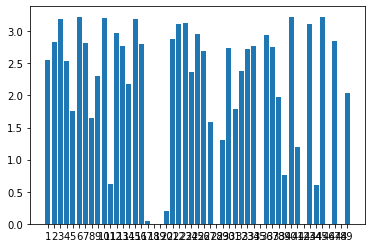

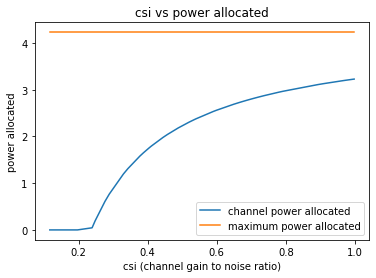

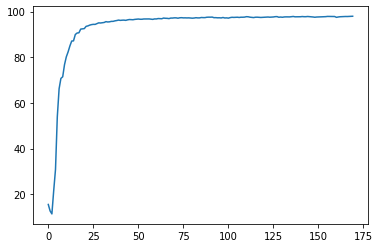

170
Power Allocated= 0
CSI= 0.0711003483821353
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.105205949311217
CSI= 0.9818308365759668
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.313482


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.192376

Power Allocated= 2.16060876518611
CSI= 0.509397732306237
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.624243
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.218833

Power Allocated= 2.1396421839981112
CSI= 0.5040146896446642
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.367461
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.097099

Power Allocated= 2.50767256489062
CSI= 0.6187970333845724
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0655652730068095
CSI= 0.9450491108909788
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.225361
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025402

Power Allocated= 1.450047267741994
CSI= 0.37401856512144815
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0762, Accuracy: 9792/10000 (98%)

Power in training Round= 97.9946677725066



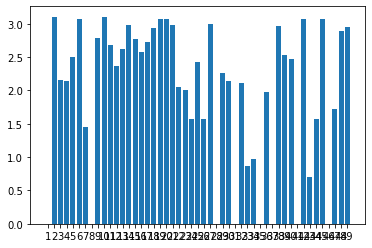

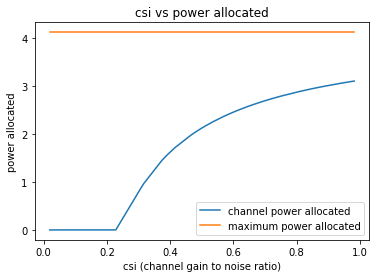

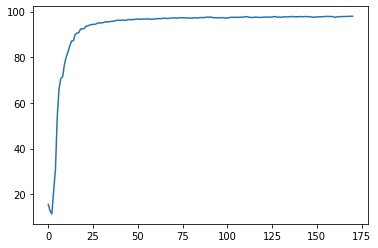

171
Power Allocated= 0
CSI= 0.018747203620594566
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5936728272324214
CSI= 0.33316752049425125
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1427654825360316
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.091159805618951
CSI= 0.6648909292218459
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1377565246258461
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8336405637530118
CSI= 0.567689824075072
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.139149


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.247164

Power Allocated= 3.5503449427491316
CSI= 0.9571017952394933
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4511575307304647
CSI= 0.4664160929133576
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.142806
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068567

Power Allocated= 1.7576946055772065
CSI= 0.3524264746147988
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.206560
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016600

Power Allocated= 1.0753497349748797
CSI= 0.2841057479249248
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.175524
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044350

Power Allocated= 0
CSI= 0.12469337780134404
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0741, Accuracy: 9790/10000 (98%)

Power in training Round= 98.00150779091419



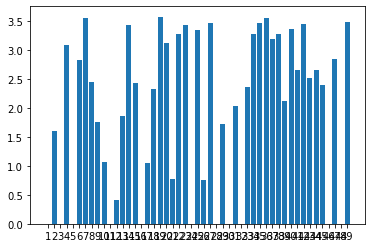

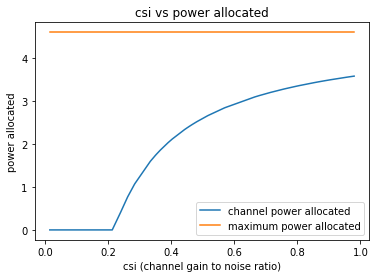

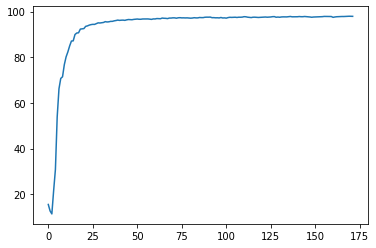

172
Power Allocated= 3.5250936916980127
CSI= 0.823863287408349
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01613546029611468
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.182112566527391
CSI= 0.6423536896832058
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.004246048613364639
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3054400612104526
CSI= 0.6976189750690724
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.119536


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067502

Power Allocated= 0.3218615096394437
CSI= 0.22639668531840473
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.221816
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074709

Power Allocated= 2.1103145313769764
CSI= 0.3804345873220679
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.199614
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.093379

Power Allocated= 3.5646925000722307
CSI= 0.8516474371843131
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.251858
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048798

Power Allocated= 0
CSI= 0.1804929206425152
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.729418208111574
CSI= 0.9906197216558839
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0780, Accuracy: 9797/10000 (98%)

Power in training Round= 97.99290000650186



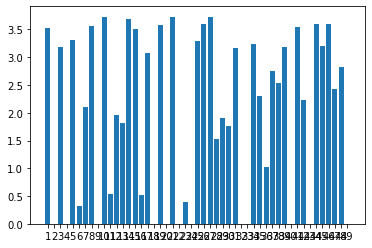

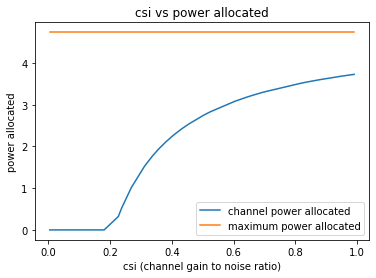

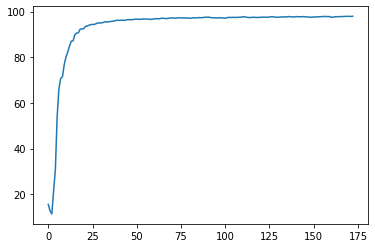

173
Power Allocated= 3.270243901960911
CSI= 0.9173516942082903
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.056039


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052846

Power Allocated= 3.0528514546891943
CSI= 0.7648260140974918
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.531078062579851
CSI= 0.5466690553423738
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.015621173078187223
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.21999373357893592
CSI= 0.24152578823352677
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.238133


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.324282

Power Allocated= 0
CSI= 0.16788292795990367
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.153593022516316
CSI= 0.8286752532349595
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5852929700151241
CSI= 0.26489747700915534
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.239077
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.139090

Power Allocated= 3.0393179141662854
CSI= 0.7569905533597564
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.282669
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059545

Power Allocated= 2.505480157922085
CSI= 0.5391247684932234
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.248017
Model client10 Train Epoch: 2 [0/1216 (0%)]	Los

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1045, Accuracy: 9790/10000 (98%)

Power in training Round= 97.99672176113945



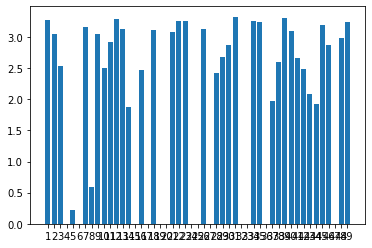

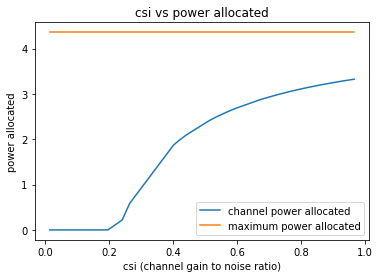

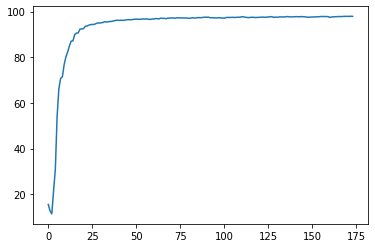

174
Power Allocated= 0
CSI= 0.0608651349299002
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2816504576728116
CSI= 0.8832429251384809
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.283169


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.170337

Power Allocated= 2.7052136113403513
CSI= 0.5852648352682291
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0840021017564333
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.09573994642191841
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13903027960831016
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.925157499639801
CSI= 0.6717340905957098
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.478746
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.231868

Power Allocated= 2.2039119006423165
CSI= 0.4525030394454327
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for av

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0981, Accuracy: 9788/10000 (98%)

Power in training Round= 98.00380921982543



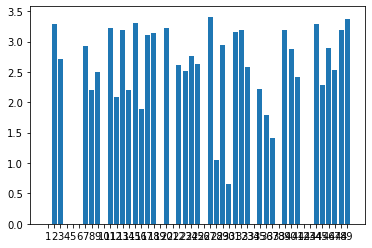

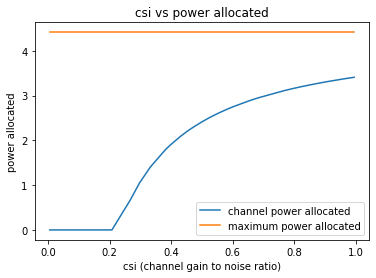

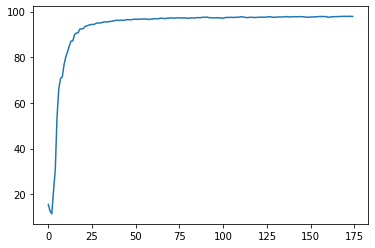

175
Power Allocated= 0
CSI= 0.096456180135013
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3289214829002187
CSI= 0.7215862564900296
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.264360


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107753

Power Allocated= 0
CSI= 0.044770724881097235
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1467913427258196
CSI= 0.6377689933331214
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4595181260952153
CSI= 0.4434119717074806
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.336686
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053268

Power Allocated= 1.5275415323756505
CSI= 0.3137534787162093
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.326647
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115118

Power Allocated= 3.36406058768636
CSI= 0.7403587143725137
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.523215
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0970, Accuracy: 9786/10000 (98%)

Power in training Round= 97.99617643719203



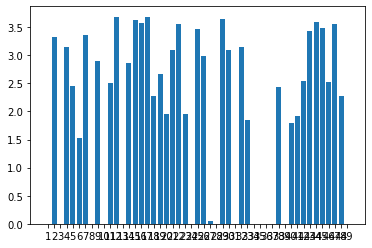

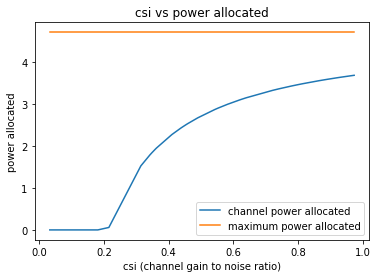

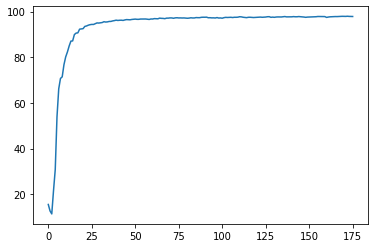

176
Power Allocated= 3.1587394066858723
CSI= 0.6880507110459289
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.348696


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.306102

Power Allocated= 3.475527601978106
CSI= 0.8798223770886752
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.229200
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114912

Power Allocated= 3.0029359642875155
CSI= 0.6214327087293288
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.265447
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.269910

Power Allocated= 0
CSI= 0.16450378238362828
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7295552678253165
CSI= 0.3469132062420869
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.260650


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.322460

Power Allocated= 3.118570142965522
CSI= 0.6695454845551813
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.300742
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057494

Power Allocated= 3.5191312277913696
CSI= 0.9149219350763449
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.165800
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.120185

Power Allocated= 1.4401609543431921
CSI= 0.31526251749014655
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.250495
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.164804

Power Allocated= 0
CSI= 0.013262667867393052
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.51934854047726
CSI= 0.4778351135221863
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0768, Accuracy: 9775/10000 (98%)

Power in training Round= 97.99744235716487



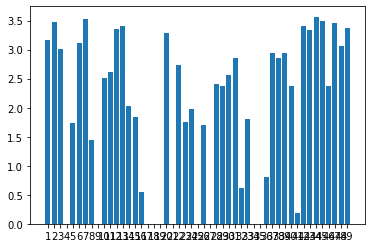

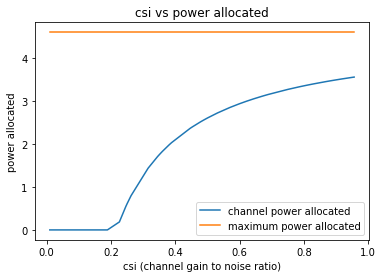

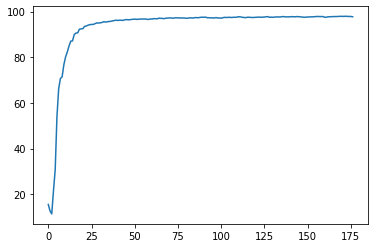

177
Power Allocated= 3.6117643839694145
CSI= 0.9924573327143086
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2447819136785805
CSI= 0.7274936410161579
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.594294010497177
CSI= 0.9755427863081506
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.031996976866634
CSI= 0.629973880580316
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.090998


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127419

Power Allocated= 3.265471915038859
CSI= 0.7386111003877175
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.217493
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016343

Power Allocated= 2.95646384403525
CSI= 0.6013588793202347
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.368949
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.090828

Power Allocated= 1.960510050872473
CSI= 0.3761018385820226
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.343347
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.144708

Power Allocated= 3.3351125228327554
CSI= 0.7786634669457251
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.595153
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099708

Power Allocated= 3.0509493480245267
CSI= 0.6375863419477902
SNR= 18.17035793859

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073385

Power Allocated= 3.385134271796283
CSI= 0.810221689642559
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.477977
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137814

Power Allocated= 3.1413412858338496
CSI= 0.6765794168015165
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.210586
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.321610

Power Allocated= 2.0644580055618964
CSI= 0.39140377580215513
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.219426
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079703

Power Allocated= 3.4368393879326615
CSI= 0.8456480924678362
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.106033
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007592

Power Allocated= 3.3733621114355907
CSI= 0.8025667600059473
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0943, Accuracy: 9780/10000 (98%)

Power in training Round= 97.99824226664778



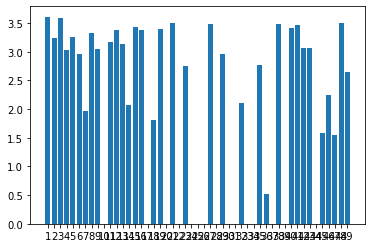

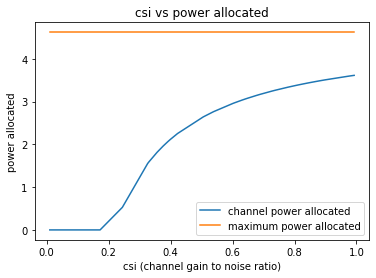

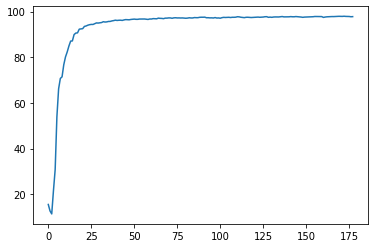

178
Power Allocated= 2.462237733482162
CSI= 0.45783969588224316
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.359901


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.234839

Power Allocated= 3.636590222601585
CSI= 0.9902773541829742
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.262065
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.160516

Power Allocated= 3.602336932686479
CSI= 0.9577889079765188
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6487469793461953
CSI= 0.2501462513191526
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.261750
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092264

Power Allocated= 0.06253957523013831
CSI= 0.2181563335016129
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.246505
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137669

Power Allocated= 2.9188125127582376
CSI= 0.578839096578263
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073931

Power Allocated= 0
CSI= 0.013370655821305366
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1775601709553967
CSI= 0.6808055661286242
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.166506
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085676

Power Allocated= 3.262359407305086
CSI= 0.7225178143846877
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.237477
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.102597

Power Allocated= 0
CSI= 0.12441641755927424
SNR= 18.799405815022368
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5554269393391156
CSI= 0.9166059218727162
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.352646
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0756, Accuracy: 9770/10000 (98%)

Power in training Round= 98.00467751716593



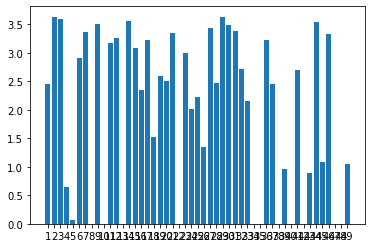

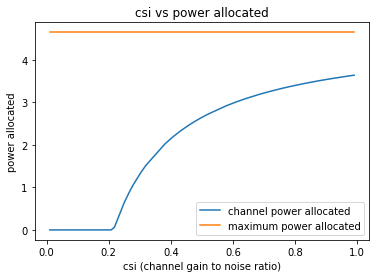

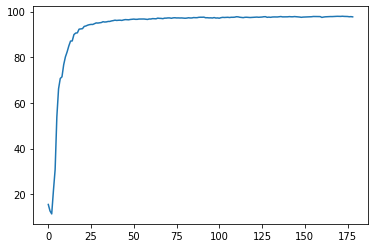

179
Power Allocated= 0
CSI= 0.06277106802189836
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0199534265992662
CSI= 0.2937683800976063
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.278157


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070656

Power Allocated= 0
CSI= 0.0672905431825459
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1625310327382037
CSI= 0.7927292646128175
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.233902
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.101264

Power Allocated= 2.7400774160940333
CSI= 0.593853026066862
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.4883545554508864
CSI= 0.3406410840830847
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.157815
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094439

Power Allocated= 1.881802325594704
CSI= 0.39336109881875614
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.194172
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0896, Accuracy: 9772/10000 (98%)

Power in training Round= 97.99971135689209



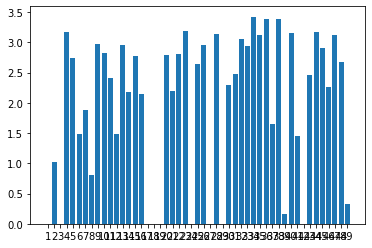

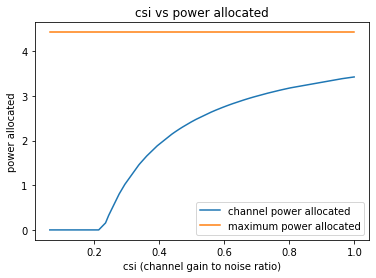

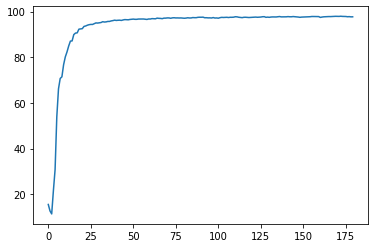

180
Power Allocated= 3.418161544474623
CSI= 0.890668573470761
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9906400801825272
CSI= 0.6450474491690472
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.447027


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113602

Power Allocated= 2.83407749283971
CSI= 0.5858793220745856
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.210090
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.313320

Power Allocated= 3.4161501936103074
CSI= 0.8890758412177322
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6611762025817862
CSI= 0.2577494014061532
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.102310
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.277243

Power Allocated= 3.3500477387954968
CSI= 0.8397251158630745
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.051475
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.158200

Power Allocated= 0.7565494824226535
CSI= 0.2642451837406887
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060514

Power Allocated= 3.408793733364308
CSI= 0.8832986694795617
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.184868
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.098432

Power Allocated= 2.1578171586977586
CSI= 0.4196221224265132
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235641
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042695

Power Allocated= 0
CSI= 0.16110481907066498
SNR= 18.799405815022368
Client: client13
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2705080611632815
CSI= 0.7871502007666831
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.174296
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.150522

Power Allocated= 0.5789754081690663
CSI= 0.2524017144007137
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0822, Accuracy: 9780/10000 (98%)

Power in training Round= 97.99967417959039



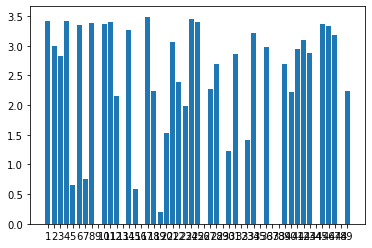

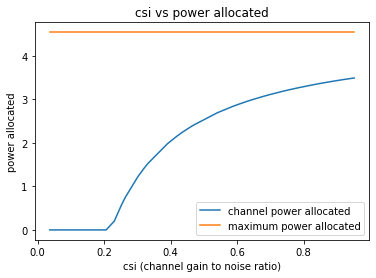

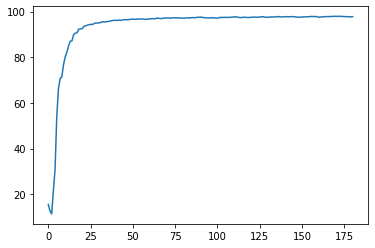

181
Power Allocated= 0
CSI= 0.012387962803028452
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3997288730791055
CSI= 0.5297450847054731
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.167299


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.353438

Power Allocated= 3.0735057836930197
CSI= 0.8237751568735262
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.071712
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.272778

Power Allocated= 2.8409077255689485
CSI= 0.6913135947046267
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.205336
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.093438

Power Allocated= 2.396021290983434
CSI= 0.5287066660109453
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.093410
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.104584

Power Allocated= 2.4641022075353423
CSI= 0.5484479594949921
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.196381
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048166

Power Allocated= 2.448615139708207
CSI= 0.5438287591818397
SNR= 17.400655572

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0763, Accuracy: 9787/10000 (98%)

Power in training Round= 97.99303375686091



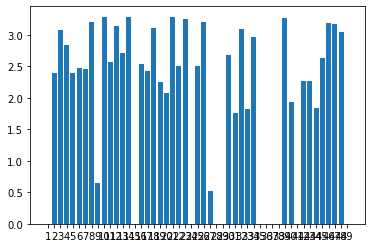

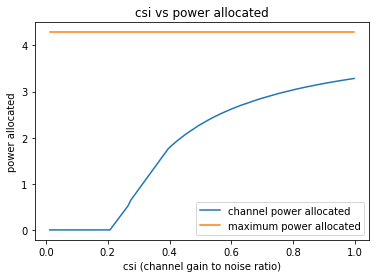

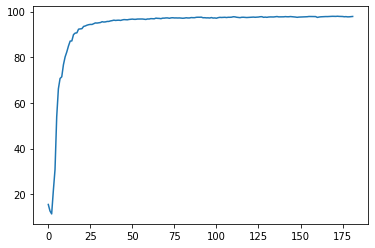

182
Power Allocated= 0
CSI= 0.09023210171310359
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.210263616376775
CSI= 0.8324720097862707
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.054380


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066012

Power Allocated= 0
CSI= 0.05090251621048392
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0442255659080577
CSI= 0.7313792811560111
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.114480
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.152749

Power Allocated= 2.9311899264605463
CSI= 0.6755317695546316
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.139387
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036707

Power Allocated= 3.3974880451427336
CSI= 0.9861766043211434
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.395634309933393
CSI= 0.9843770544945875
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8168487388250605
CSI= 0.2781

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0778, Accuracy: 9788/10000 (98%)

Power in training Round= 97.99816543213969



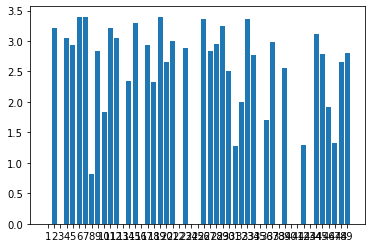

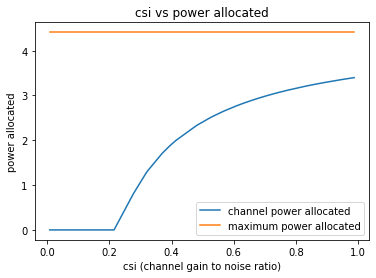

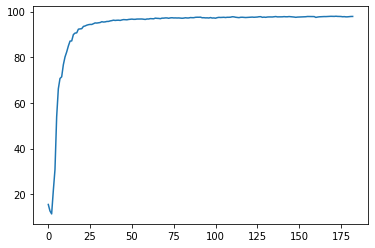

183
Power Allocated= 1.3479637534530045
CSI= 0.28672797655080373
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.522590


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.235879

Power Allocated= 2.0332272351310396
CSI= 0.3568417455593511
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.663038246499192
CSI= 0.8528408631021678
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.140622
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095232

Power Allocated= 3.6421136740672573
CSI= 0.8378884665671233
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.313476
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.118965

Power Allocated= 0
CSI= 0.20398795579980766
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17185740336841748
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5620311934963915
CSI= 0.4398390851654659
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013438

Power Allocated= 1.8228121997027107
CSI= 0.33191960560833333
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.082686
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.096060

Power Allocated= 3.197019977642895
CSI= 0.6102882524205677
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.087091
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116378

Power Allocated= 1.0935700120536667
CSI= 0.2672353484823615
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.150405
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100205

Power Allocated= 0
CSI= 0.09230891726119328
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1890032696610904
CSI= 0.607316952587616
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0861, Accuracy: 9778/10000 (98%)

Power in training Round= 97.9960355232804



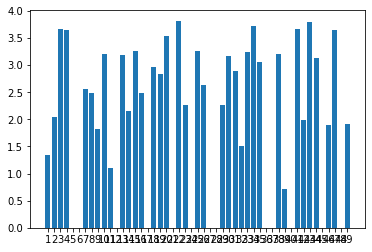

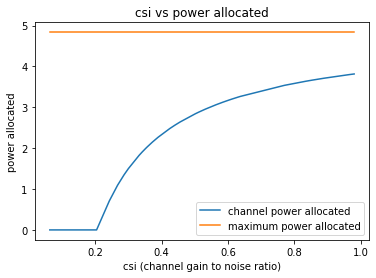

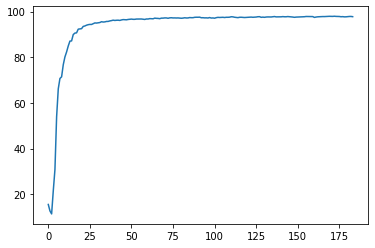

184
Power Allocated= 0
CSI= 0.12466349278301869
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.671096453193666
CSI= 0.34496203467732556
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.325022


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026594

Power Allocated= 3.372297350128333
CSI= 0.8349553509111288
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.233517
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.196532

Power Allocated= 0
CSI= 0.1443095130422658
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.100167091805176
CSI= 0.6803650964955515
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.225959
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.120808

Power Allocated= 0
CSI= 0.1582437530854336
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1643266763512345
CSI= 0.7114199592449183
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.253937
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076325

Power All

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0835, Accuracy: 9779/10000 (98%)

Power in training Round= 98.0012262767196



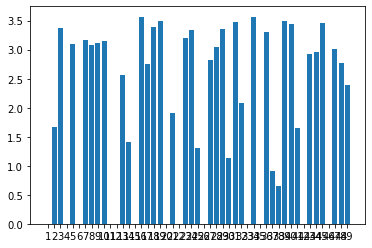

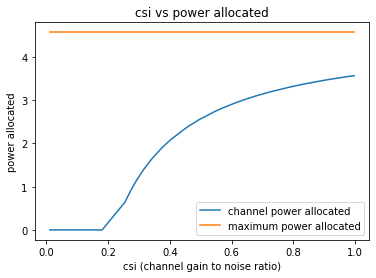

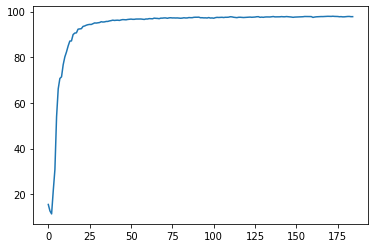

185
Power Allocated= 2.4270869690791175
CSI= 0.4484893612729963
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.378970


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.203338

Power Allocated= 0.9525986282715024
CSI= 0.26996414300327165
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.174139
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100840

Power Allocated= 2.8943781161912625
CSI= 0.567402881497247
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.147632
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.150179

Power Allocated= 2.85330931515137
CSI= 0.5544820328482641
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.201221
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.097057

Power Allocated= 2.968512913689536
CSI= 0.592318336341995
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.157984
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058318

Power Allocated= 0
CSI= 0.05256570942630012
SNR= 17.04968172980935
Client: clien

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.183248

Power Allocated= 2.620948193491272
CSI= 0.4911962721842207
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.238917
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071256

Power Allocated= 3.1168671472394442
CSI= 0.6493813829731883
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.347289
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021872

Power Allocated= 2.668408017747415
CSI= 0.5029203971175881
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.889159102853327
CSI= 0.5657276018504241
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.275309
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.121196

Power Allocated= 0
CSI= 0.08960339989755106
SNR= 18.595302734638665
Client: client12
Poor Channel, client not taken for averaging 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0754, Accuracy: 9779/10000 (98%)

Power in training Round= 97.99523991361349



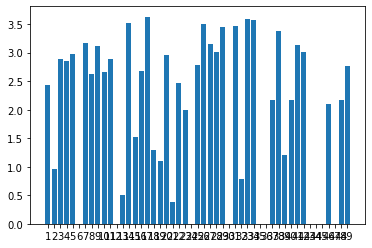

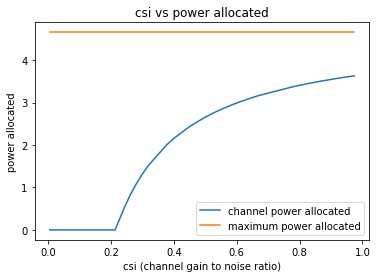

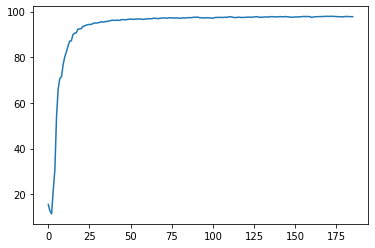

186
Power Allocated= 0
CSI= 0.20876328029326852
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.102244464373109
CSI= 0.8060146499458575
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9491765325062205
CSI= 0.7174938494795262
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.123569


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057870

Power Allocated= 2.6456156750575097
CSI= 0.5891706795793583
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.178426
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.098549

Power Allocated= 2.6528885607289947
CSI= 0.591706123153791
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.195850
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.097907

Power Allocated= 0
CSI= 0.0979704783931078
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7461852955797115
CSI= 0.6262794076960678
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.222460
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.152514

Power Allocated= 1.7573046599681557
CSI= 0.3867556243597585
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0750, Accuracy: 9780/10000 (98%)

Power in training Round= 97.99688046653273



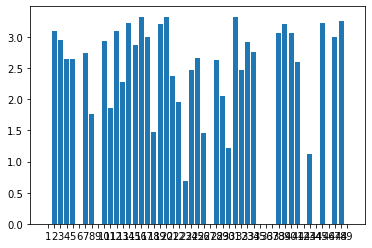

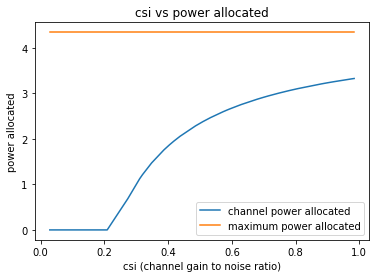

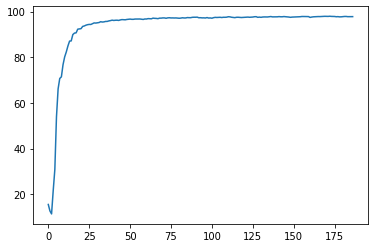

187
Power Allocated= 2.163148680355648
CSI= 0.42873453685062235
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.084756


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015930

Power Allocated= 2.47632424121742
CSI= 0.49522845493095713
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7735145273383064
CSI= 0.36736616009157597
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.259075
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.051868

Power Allocated= 2.910446103445168
CSI= 0.6308558348612339
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0868998924648855
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1280842653351445
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.448075954595737
CSI= 0.954637202885338
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch:

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.098855

Power Allocated= 2.590168745254416
CSI= 0.524817140343703
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.255216
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137325

Power Allocated= 2.462495556225528
CSI= 0.49186002127073714
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.219049
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.219027

Power Allocated= 0
CSI= 0.1384000274298306
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13689992568418152
SNR= 18.237505777687126
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4820980779160715
CSI= 0.9866834832483131
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.190626
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.160737

P

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0719, Accuracy: 9785/10000 (98%)

Power in training Round= 98.00071161896219



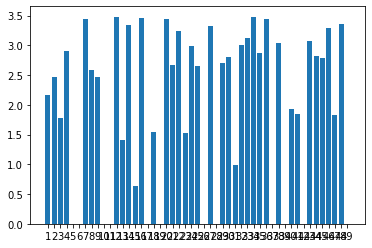

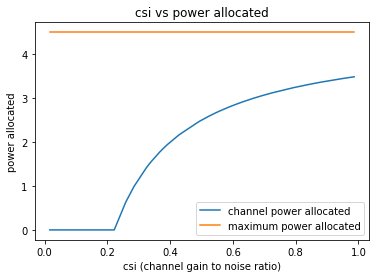

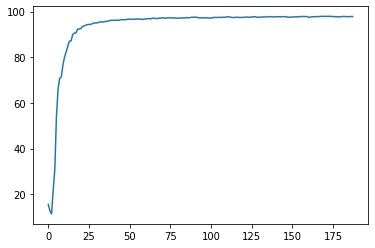

188
Power Allocated= 3.0929099676497844
CSI= 0.8600142972545328
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.134905


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.156730

Power Allocated= 0.9454273411383318
CSI= 0.30209162257052735
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.284991
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.215494

Power Allocated= 2.3259179250153954
CSI= 0.5181982387284075
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.137927
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075789

Power Allocated= 2.9452957754868914
CSI= 0.7631341730371832
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.238770
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189312

Power Allocated= 0
CSI= 0.13513731789578354
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7291222680870115
CSI= 0.6550680035564862
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in t

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.204088

Power Allocated= 0
CSI= 0.2326164312062935
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1299400802593387
CSI= 0.888303592108811
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.199046
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.131580

Power Allocated= 2.7800355388641513
CSI= 0.6776693993245572
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.193753
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083088

Power Allocated= 2.5410491443283534
CSI= 0.5832154590845532
SNR= 18.237505777687126
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.248693
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038559

Power Allocated= 3.2205886914959603
CSI= 0.9660970993074357
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0780, Accuracy: 9783/10000 (98%)

Power in training Round= 97.99441267657453



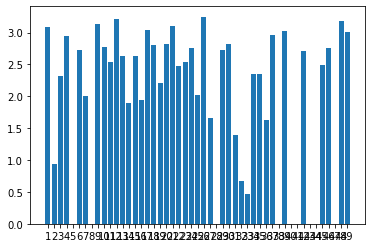

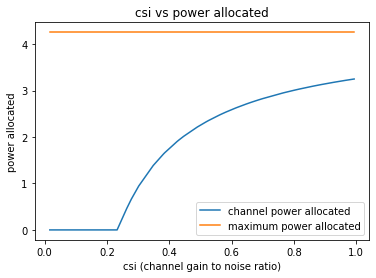

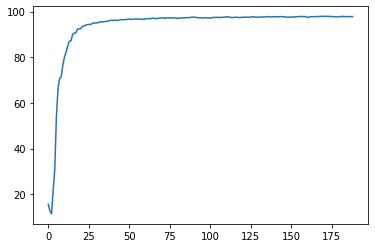

189
Power Allocated= 0.4869429473321656
CSI= 0.24181394768318232
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.310908


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.231588

Power Allocated= 0
CSI= 0.053755317717212314
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04212161522752367
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5174719945851485
CSI= 0.32207346175186125
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.236317


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027991

Power Allocated= 3.443638821966937
CSI= 0.8483815861753882
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.215077
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066430

Power Allocated= 0
CSI= 0.12069195121649345
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8839190412145954
CSI= 0.2674916350295776
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.281324
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.469107

Power Allocated= 3.600789366089509
CSI= 0.9788908680075582
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.329868
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068310

Power Allocated= 3.41605561233196
CSI= 0.8289824945805735
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0735, Accuracy: 9786/10000 (98%)

Power in training Round= 97.99223170926956



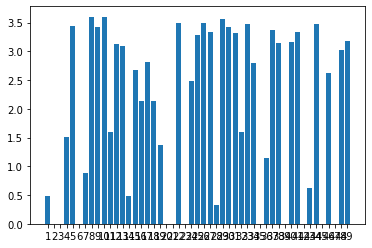

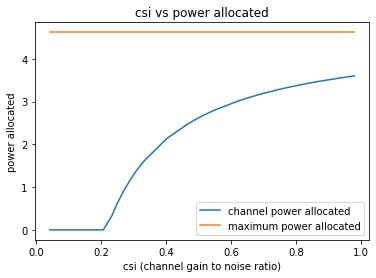

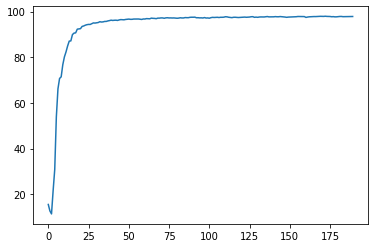

190
Power Allocated= 1.8905883028403379
CSI= 0.40241232630152435
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.124227


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040017

Power Allocated= 0
CSI= 0.22280346204642876
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5623204815824052
CSI= 0.26224134992561887
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.238358


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.148062

Power Allocated= 2.12464520923917
CSI= 0.44425559909217394
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2912436338311606
CSI= 0.9222046496554019
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.114131322767708
CSI= 0.792725744075166
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.190033
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119078

Power Allocated= 0
CSI= 0.1996788123078559
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2116939096500414
CSI= 0.8591746316597833
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.155719
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.117760

Power Allocated= 2.1633661186482516
CSI= 0.4520314

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0911, Accuracy: 9782/10000 (98%)

Power in training Round= 98.00111702944795



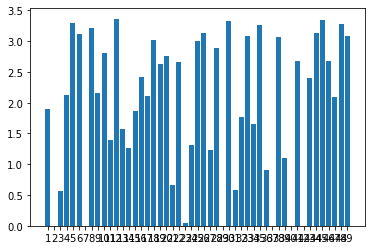

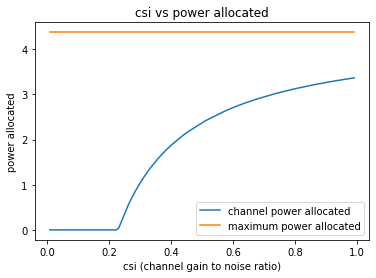

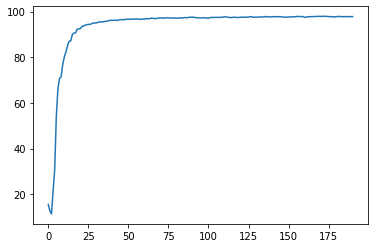

191
Power Allocated= 2.444503841851549
CSI= 0.44577401095843316
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.043023


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028128

Power Allocated= 3.328915091950586
CSI= 0.7359012929693538
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.892002
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.103173

Power Allocated= 0
CSI= 0.01843029558386977
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9030309558252694
CSI= 0.5602987863356962
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.423061


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.168578

Power Allocated= 0
CSI= 0.09745153610420088
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0739785973241114
CSI= 0.2767159273148272
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.117526
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035224

Power Allocated= 3.5904714596270475
CSI= 0.9113099260318969
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8736362722611051
CSI= 0.26218115163424494
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.124407
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.389307

Power Allocated= 3.286594884136564
CSI= 0.7136749599590192
SNR= 18.17035793859231
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.049940327038224264
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0716, Accuracy: 9796/10000 (98%)

Power in training Round= 98.00022244858896



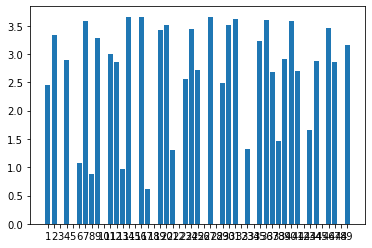

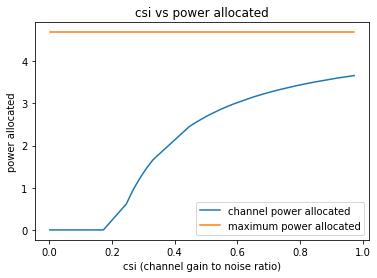

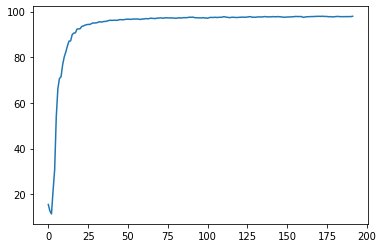

192
Power Allocated= 3.502953270016441
CSI= 0.9106368507089997
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.419770


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.192678

Power Allocated= 3.4970336345386634
CSI= 0.9057542572023158
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.094111
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119332

Power Allocated= 2.7650636514959057
CSI= 0.5446557222477327
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.158148
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.214003

Power Allocated= 0
CSI= 0.0040120457333105985
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2836349624092915
CSI= 0.4315086039805255
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.241630


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048246

Power Allocated= 3.2824248574099766
CSI= 0.7583450188260794
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.389666
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095100

Power Allocated= 0
CSI= 0.19091709079158103
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5722873498438585
CSI= 0.4929025710716253
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.096864
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.097468

Power Allocated= 3.4973370981039977
CSI= 0.9060032843601498
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.329851
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036853

Power Allocated= 3.356902655456224
CSI= 0.8037401560734777
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0728, Accuracy: 9797/10000 (98%)

Power in training Round= 97.9928111533557



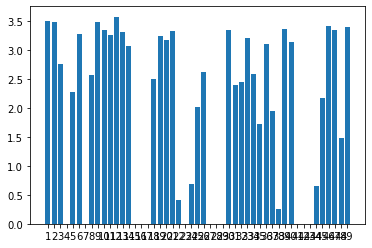

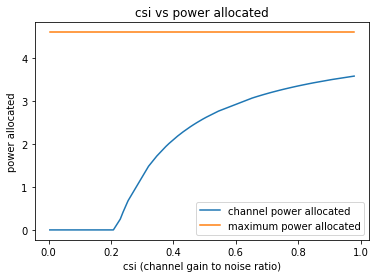

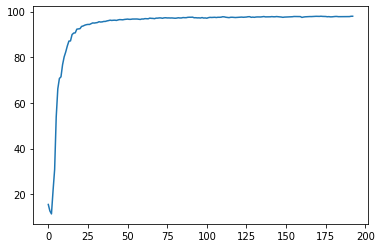

193
Power Allocated= 2.728462219998457
CSI= 0.5608677027285932
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.426677509947978
CSI= 0.9218829849106649
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.141337


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.072217

Power Allocated= 3.1386433658051125
CSI= 0.728453876132454
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4637669888798035
CSI= 0.9545200880516199
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.259950
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.169359

Power Allocated= 1.0396060958640745
CSI= 0.28803437949588306
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.315384
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.104018

Power Allocated= 2.8054523356851027
CSI= 0.586179685601269
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.164870
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189937

Power Allocated= 2.7413821138818184
CSI= 0.5649616129919007
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053724

Power Allocated= 2.7450329677977408
CSI= 0.566129306950924
SNR= 18.595302734638665
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.234625
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175911

Power Allocated= 3.4502557538999974
CSI= 0.942366625791345
SNR= 18.799405815022368
Client: client13
Model client13 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.190537
Model client13 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042640

Power Allocated= 2.99316426233168
CSI= 0.6586532216221576
SNR= 18.866727777656166
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.107820
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.197335

Power Allocated= 1.5148036387718964
CSI= 0.33371039957294024
SNR= 19.00770332812949
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.099203
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048349

Power Allocated= 0.9522633577206037
CSI= 0.2809659199723039
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0728, Accuracy: 9793/10000 (98%)

Power in training Round= 98.00754607277753



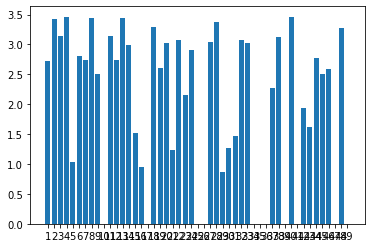

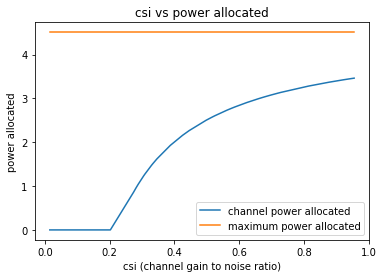

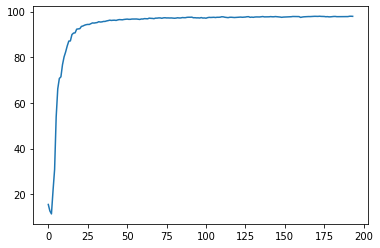

194
Power Allocated= 2.398698473021292
CSI= 0.4407297854483412
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1947641606202017
CSI= 0.28794393647434846
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6015621247620677
CSI= 0.9379980389483447
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.256079


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.084233

Power Allocated= 0
CSI= 0.11695150433838297
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.95832462270314
CSI= 0.5850218681228595
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.256760


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035500

Power Allocated= 1.6603680196812367
CSI= 0.33252480868567036
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.491515
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.163186

Power Allocated= 0
CSI= 0.06398778989848097
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9636017200196703
CSI= 0.3698141815338518
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.464310
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053016

Power Allocated= 2.7572039460622153
CSI= 0.5234345608511942
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.195151
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047584

Power Allocated= 1.7864210429011793
CSI= 0.3470726204554351
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Los

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0861, Accuracy: 9795/10000 (98%)

Power in training Round= 97.99875012104066



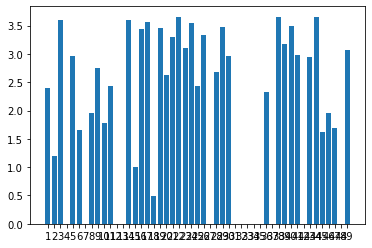

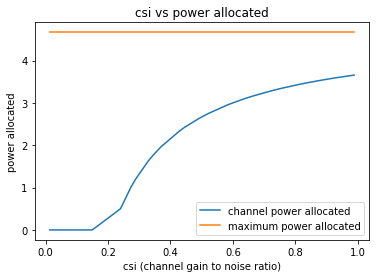

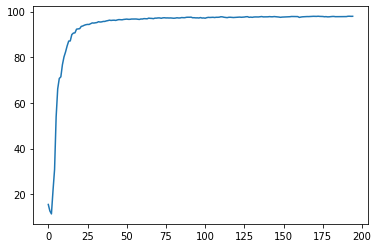

195
Power Allocated= 3.0755043707487086
CSI= 0.7542023703805426
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6760924758870823
CSI= 0.5796039766604151
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.260790


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.204145

Power Allocated= 3.355888406679083
CSI= 0.9564618160257392
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.246220
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.106259

Power Allocated= 0
CSI= 0.17990404523088543
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.376973325267088
CSI= 0.9761477083020552
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.286916


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070490

Power Allocated= 3.133061955076779
CSI= 0.7884280860530722
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.365451
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.239929

Power Allocated= 2.8591921082564946
CSI= 0.6484174577041355
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.269440
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099608

Power Allocated= 0
CSI= 0.17445227225761817
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2654863436945023
CSI= 0.8803420532347035
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.177984
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058294

Power Allocated= 2.4442391932014225
CSI= 0.5109420128924916
SNR= 18.187820388691026
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0821, Accuracy: 9789/10000 (98%)

Power in training Round= 97.99555912982906



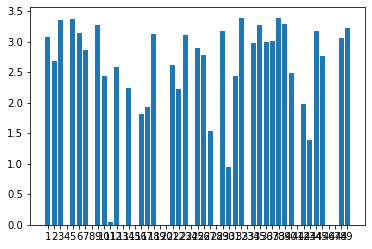

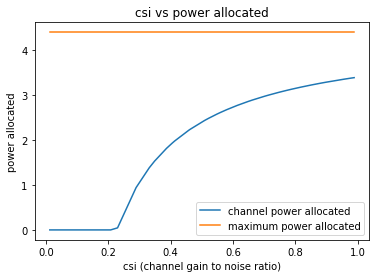

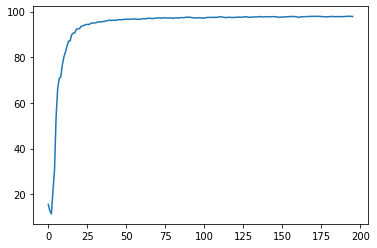

196
Power Allocated= 3.054922530851769
CSI= 0.9320758562083049
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.185511


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.155567

Power Allocated= 2.9761751009196153
CSI= 0.8683408709095128
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.176801
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111826

Power Allocated= 0
CSI= 0.18711650420104364
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2358692753566611
CSI= 0.3457901578780568
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.222429


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.177584

Power Allocated= 2.9576369979269668
CSI= 0.8545842921366653
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.147890
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.163431

Power Allocated= 0
CSI= 0.18530795950956858
SNR= 17.04968172980935
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.752896140251654
CSI= 0.727325389897978
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.144576
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.098301

Power Allocated= 0
CSI= 0.23114032719812716
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3025909340627573
CSI= 0.3539565343374844
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220045
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038695

Power A

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0879, Accuracy: 9778/10000 (98%)

Power in training Round= 98.00170550567869



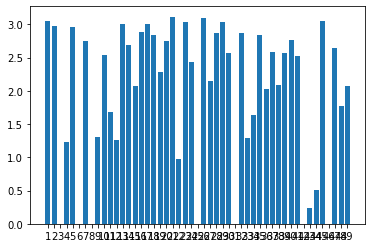

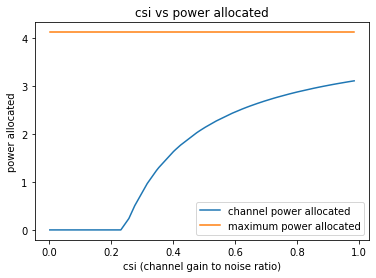

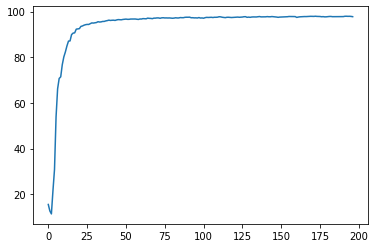

197
Power Allocated= 3.1777147754792745
CSI= 0.8125596989286111
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.33678541438507
CSI= 0.9331769118602885
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11853742504616072
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2344676955466625
CSI= 0.8518425328790405
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.252295463485455
CSI= 0.8649784862739186
SNR= 16.673578640237295
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.026513


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046469

Power Allocated= 2.3020812330485447
CSI= 0.47476339432395476
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.301720
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.394083

Power Allocated= 2.99908869136923
CSI= 0.7095696659314145
SNR= 17.40065557253575
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.573439437318459
CSI= 0.5449727467232054
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.555093
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337488

Power Allocated= 2.501105665598659
CSI= 0.5243046903019215
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.359381
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.130523

Power Allocated= 0
CSI= 0.07590867368598386
SNR= 18.187820388691026
Client: client10
Poor Channel, client not taken for averaging in thi

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0804, Accuracy: 9787/10000 (98%)

Power in training Round= 98.00031137772962



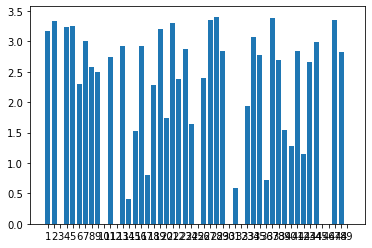

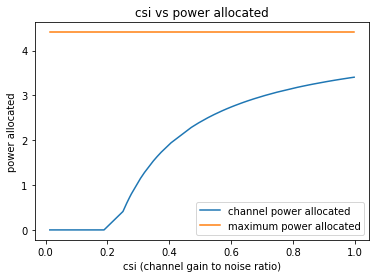

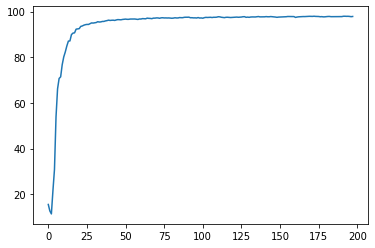

198
Power Allocated= 3.3785965034950483
CSI= 0.9526447653626022
SNR= 14.0451028156088
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.355429


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.096980

Power Allocated= 0
CSI= 0.05061966196918588
SNR= 14.7325677939596
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1707634903981052
CSI= 0.44295959666089635
SNR= 15.210927201616279
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.230497


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078023

Power Allocated= 0
CSI= 0.21935541921918966
SNR= 16.61133825842895
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19085616368518354
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4017764663774592
CSI= 0.9741563491808721
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.086123
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189543

Power Allocated= 1.2974145180865744
CSI= 0.3193978749954789
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.229371
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.072848

Power Allocated= 0
CSI= 0.1725990791715708
SNR= 18.049650368948967
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7746998075956206
CSI= 0.6047390048096098
SNR= 18.17035793859

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0904, Accuracy: 9803/10000 (98%)

Power in training Round= 98.00100582131958



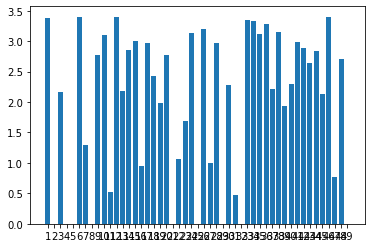

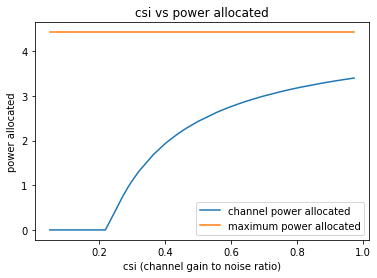

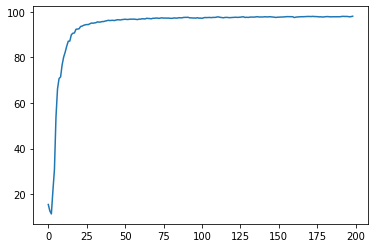

199
Power Allocated= 2.388131867864049
CSI= 0.5122567913194417
SNR= 14.0451028156088
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.1637437104937769
CSI= 0.2394329805264096
SNR= 14.7325677939596
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.606330


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060706

Power Allocated= 0
CSI= 0.17680399118421353
SNR= 15.210927201616279
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.625742900131534
CSI= 0.3683872357782835
SNR= 16.61133825842895
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.167359


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.307149

Power Allocated= 3.3364157858028225
CSI= 0.9961528656266899
SNR= 16.673578640237295
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.18927337731845562
CSI= 0.24090555044683704
SNR= 17.04968172980935
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.271387
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.392438

Power Allocated= 2.7024800852059245
CSI= 0.6105760220173616
SNR= 17.40065557253575
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.176402
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111806

Power Allocated= 0.5256997773710066
CSI= 0.26215219609960805
SNR= 18.049650368948967
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.222607
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.171477

Power Allocated= 2.867004014551846
CSI= 0.6787604754530289
SNR= 18.17035793859231
Client: client9
Model client9 Train Epoch: 1 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.0814, Accuracy: 9802/10000 (98%)

Power in training Round= 97.9931257868659



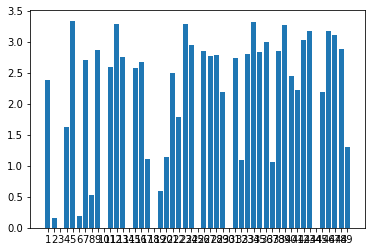

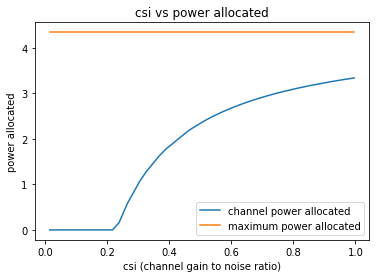

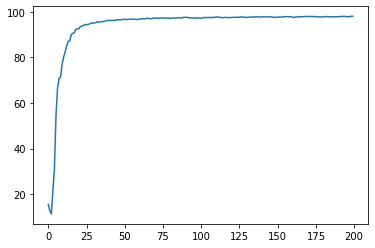

200


In [11]:
for fed_round in range(args.rounds):
    
    client_good_channel=[] #to check which clients have a good channel, only those will be taken for averaging per round

    # Training 
    #even slot
    
    snr=[] #snr of the channel
    csi=[] #csi of the channel
    for ii in range (int(args.clients)-1):
        #snr.append(random.uniform(args.snr_low, args.snr_high))
        csi.append(random.uniform(args.csi_low,args.csi_high))
    
    # if(fed_round==0):
    #     snr,cluster_head=get_cluster()
    if(fed_round==0): #fed_round==0 or True                                        %%%static or moving
        snr,cluster_head=get_cluster(args.clients)
        temp=copy.deepcopy(cluster_head)
        temp1=copy.deepcopy(snr)
    else:
        #print(temp)
        cluster_head=copy.deepcopy(temp)
        snr=copy.deepcopy(temp1)
    #print(cluster_head)
    smallmu1=0
    gsmall1=3.402823466E+38 
    
    #water filling algorithm
    mu=1e-15
    while(mu<=1):
        #print("yay")
        #pn=max(1/mu-1/csi,0)
        g1=0
        pn1=0
        for jj in csi:
            pn=max(1/mu-1/jj,0)
            g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
            pn1+=pn
        g=g1-mu*(pn1-P*(int(args.clients)-1))
        if(g<gsmall1):
            smallmu1=mu
            gsmall1=g
        mu+=0.00002

    #print(smallmu1)
    # poptim=max(1/smallmu1-1/csi1,0)
    # print(poptim)
    index=0
    members=[]
    for i in clients:
        if(i['hook'].id!=cluster_head):
            members.append(i)
        else:
            head=i
    for client in members:
        goodchannel=ClientUpdate(args, device, client,key_np,key,snr[index],csi[index],smallmu1)
        if(goodchannel):
            client_good_channel.append(client)
        index+=1
        
    po=[]    
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    
    plt.bar([str(i) for i in range (1,len(po)+1)],po,)
    csi.sort()
    po=[]
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    fig,ax=plt.subplots()
    line1=ax.plot(csi,po,label="channel power allocated")
    line2=ax.plot(csi,[1/smallmu1]*len(csi),label="maximum power allocated")
    ax.set_title("csi vs power allocated")
    ax.set_xlabel("csi (channel gain to noise ratio)")
    ax.set_ylabel("power allocated")
    ax.legend()
    #plt.show()
    

#     # Testing 
#     for client in active_clients:
#         test(args, client['model'], device, client['testset'], client['hook'].id)
    
    
    
    print()
    print("Clients having a good channel and considered for training")
    for no in range (len(client_good_channel)):
        print(client_good_channel[no]['hook'].id)
        
        
        
    # Averaging 
        #odd slot

    head['model'] = averageModels(head['model'],client_good_channel)
    # Testing the average model
    #test(args, global_model, device, global_test_loader, 'Global')
    ac=test(args, head['model'], device, global_test_loader, 'Final')
    accuracy.append(ac)
    
    print("Power in training Round=",sum(po))
    #print("Power cap=",P*len(active_clients))
    
    #print("Total Power =",power_odd+power_even)
    print()
            
    # Share the global model with the clients
    index=0
    for client in members:
        client['model'].load_state_dict(head['model'].state_dict())
        #client=CLientReturn(client,snr[index],csi[index],smallmu1) #CHANGE:Commented
        index+=1
        #client['model']=torch.quantization.quantize_dynamic(client['model'],{torch.nn.Conv2d},dtype=torch.qint8)
        #print(client['model'].conv1.weight.data)
    fig1,ax1=plt.subplots()
    ax1.plot([i for i in range(len(accuracy))],accuracy)
    plt.show()
    print(rc)
    rc+=1

In [12]:
print(accuracy)

[15.49, 12.66, 11.35, 21.51, 30.82, 53.87, 66.16, 70.7, 71.42, 76.72, 80.14, 82.33, 84.94, 87.07, 87.16, 89.94, 90.59, 90.69, 92.31, 92.44, 92.53, 93.51, 93.71, 94.05, 94.27, 94.39, 94.37, 94.7, 95.04, 94.98, 95.08, 95.21, 95.57, 95.43, 95.5, 95.69, 95.7, 95.92, 96.06, 96.25, 96.13, 96.21, 96.24, 96.14, 96.35, 96.5, 96.46, 96.41, 96.56, 96.63, 96.72, 96.62, 96.62, 96.74, 96.74, 96.76, 96.76, 96.66, 96.57, 96.77, 96.75, 96.93, 96.9, 96.85, 97.14, 97.05, 97.02, 96.91, 97.14, 97.14, 97.24, 97.23, 97.08, 97.26, 97.31, 97.22, 97.24, 97.2, 97.23, 97.15, 97.09, 97.16, 97.3, 97.21, 97.22, 97.39, 97.34, 97.34, 97.5, 97.54, 97.53, 97.57, 97.31, 97.33, 97.25, 97.27, 97.2, 97.39, 97.18, 97.23, 97.11, 97.35, 97.48, 97.43, 97.46, 97.51, 97.41, 97.52, 97.51, 97.56, 97.75, 97.7, 97.53, 97.43, 97.36, 97.51, 97.53, 97.45, 97.41, 97.46, 97.48, 97.55, 97.6, 97.52, 97.58, 97.62, 97.75, 97.78, 97.5, 97.59, 97.5, 97.63, 97.67, 97.65, 97.65, 97.73, 97.84, 97.69, 97.7, 97.68, 97.72, 97.81, 97.74, 97.74, 97.83,